## Final Project Submission

Please fill out:
* Student name: Mindy Jen
* Student pace: full time
* Scheduled project review date/time: Fri, Jul 24, 2020, 02:45 PM - 03:30 PM (CDT)
* Instructor name: Abhineet Kulkarni 
* Blog post URL: TBD

# obtaining data

In [137]:
# Your code here - remember to use markdown cells for comments as well!
# Import statements go here
import pandas as pd
import numpy as np
import math
import scipy.stats as stats
from scipy.stats import pearsonr
import statsmodels.api as sm
from statsmodels.formula.api import ols
import statsmodels.stats.api as sms
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import LabelBinarizer
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, make_scorer
from sklearn.metrics import r2_score

from warnings import filterwarnings
filterwarnings('ignore')

import matplotlib.pyplot as plt
plt.style.use('seaborn')
import seaborn as sns
sns.set(style="darkgrid", color_codes=True)

kc = pd.read_csv('kc_house_data.csv',index_col=None,encoding='latin1')
kc.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,...,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,...,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503


## retrieve data information

In [2]:
kc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
id               21597 non-null int64
date             21597 non-null object
price            21597 non-null float64
bedrooms         21597 non-null int64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       19221 non-null float64
view             21534 non-null float64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21597 non-null object
yr_built         21597 non-null int64
yr_renovated     17755 non-null float64
zipcode          21597 non-null int64
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int64
dtypes: float64(8), int64(11), object(2)
memory usage: 3.5+ MB


# scrubbing and cleaning Data

## run timestamp data conversion  

In [3]:
def general_datetime_converter(df, col):
    df_clone = df.copy()
    df_clone[col] = pd.to_datetime(df_clone[col])
    return df_clone

kc2 = general_datetime_converter(kc, 'date')
kc2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
id               21597 non-null int64
date             21597 non-null datetime64[ns]
price            21597 non-null float64
bedrooms         21597 non-null int64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       19221 non-null float64
view             21534 non-null float64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21597 non-null object
yr_built         21597 non-null int64
yr_renovated     17755 non-null float64
zipcode          21597 non-null int64
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int64
dtypes: datetime64[ns](1), float64(8), int64(11), object(1)
memory 

## read missing and symbolic values

In [4]:
def check_cols(df):
    for col in df.columns:
        print('------------------------------------------------------')
        print(col)
        print(f'unique values: {df[col].nunique(dropna=False)} (\'NaN\' included)')
        print(f'NaN exists? {df[col].isna().any()}')
        if df[col].isna().any():
            print(f'how many \'NaN\' values? {df[col].isna().sum()} ({np.divide(df[col].isna().sum(),df.shape[0])*100:.2f}%)')
        print('------------------------------------------------------')
        print(df[col].value_counts(dropna=False, normalize=True))
        print('------------------------------------------------------')
        print('\n') # Break up the output between columns
        
    return None

check_cols(kc2)

------------------------------------------------------
id
unique values: 21420 ('NaN' included)
NaN exists? False
------------------------------------------------------
795000620     0.000139
1825069031    0.000093
2019200220    0.000093
7129304540    0.000093
1781500435    0.000093
                ...   
7812801125    0.000046
4364700875    0.000046
3021059276    0.000046
880000205     0.000046
1777500160    0.000046
Name: id, Length: 21420, dtype: float64
------------------------------------------------------


------------------------------------------------------
date
unique values: 372 ('NaN' included)
NaN exists? False
------------------------------------------------------
2014-06-23    0.006575
2014-06-25    0.006066
2014-06-26    0.006066
2014-07-08    0.005880
2015-04-27    0.005834
                ...   
2014-07-27    0.000046
2015-03-08    0.000046
2014-11-02    0.000046
2015-05-15    0.000046
2015-05-24    0.000046
Name: date, Length: 372, dtype: float64
-------------------

Name: long, Length: 751, dtype: float64
------------------------------------------------------


------------------------------------------------------
sqft_living15
unique values: 777 ('NaN' included)
NaN exists? False
------------------------------------------------------
1540    0.009122
1440    0.009029
1560    0.008890
1500    0.008334
1460    0.007825
          ...   
4890    0.000046
2873    0.000046
952     0.000046
3193    0.000046
2049    0.000046
Name: sqft_living15, Length: 777, dtype: float64
------------------------------------------------------


------------------------------------------------------
sqft_lot15
unique values: 8682 ('NaN' included)
NaN exists? False
------------------------------------------------------
5000      0.019771
4000      0.016484
6000      0.013335
7200      0.009724
4800      0.006714
            ...   
11036     0.000046
8989      0.000046
871200    0.000046
809       0.000046
6147      0.000046
Name: sqft_lot15, Length: 8682, dtype: float64


## remove erratic symbols

In [5]:
# Your code here - Manipulate column names
subs = [(' ','_'),('.',''),("'",""),('®',''),('Â',''),('â\x84¢',''),('+','plus'),('½','half'),('-','_')]

def transform_colname(df):
    df_clone = df.copy()
    cols_rename = []
    for col in df_clone.columns:
        for old, new in subs:
            col = col.replace(old,new)
        cols_rename.append(col)
    df_clone.columns = cols_rename
    return df_clone

In [6]:
def convert_obj_to_num(df, col):
    df_clone = df.copy()
    if df_clone[col].dtype == 'object':
        df_clone[col] = df_clone[col].replace({'?':np.NaN}).astype('float64')
    return df_clone

kc3 = convert_obj_to_num(kc2, 'sqft_basement')
kc3.dtypes

id                        int64
date             datetime64[ns]
price                   float64
bedrooms                  int64
bathrooms               float64
sqft_living               int64
sqft_lot                  int64
floors                  float64
waterfront              float64
view                    float64
condition                 int64
grade                     int64
sqft_above                int64
sqft_basement           float64
yr_built                  int64
yr_renovated            float64
zipcode                   int64
lat                     float64
long                    float64
sqft_living15             int64
sqft_lot15                int64
dtype: object

## replace missing values

In [7]:
def find_null_cols(df):
    df_clone = df.copy()
    print('\'NaN\' found in columns as follows:')
    for col in df_clone.columns:
        if (df_clone[col].isnull().any()) | (df_clone[col].isna().any()):
            print(f'\t{col:30} contains {df_clone[col].isna().sum():10} null values ({df_clone[col].isna().sum()*100/df_clone.shape[0]:5.2f}%) !')
    return None

find_null_cols(kc3)

'NaN' found in columns as follows:
	waterfront                     contains       2376 null values (11.00%) !
	view                           contains         63 null values ( 0.29%) !
	sqft_basement                  contains        454 null values ( 2.10%) !
	yr_renovated                   contains       3842 null values (17.79%) !


### continuous features

In [8]:
def fill_null_cols(df, col, nullified=False):
    df_clone = df.copy()
    if nullified:
        df_clone[col] = df_clone[col].fillna(0)
    else:
        try:
            median = df_clone[col].median()
            mean = df_clone[col].mean()
            print(f'{col}: median {median:.3f}, mean {mean:.3f}')
            if median > 0:
                df_clone[col] = df_clone[col].fillna(median)
            else:
                df_clone[col] = df_clone[col].fillna(mean)
        except:
            print('N/A')
    return df_clone

In [9]:
kc4 = fill_null_cols(kc3, 'sqft_basement', nullified=False)
kc4.sqft_basement.isna().any()

sqft_basement: median 0.000, mean 291.852


False

In [10]:
kc5 = fill_null_cols(kc4, 'yr_renovated', nullified=True)
print(kc5.yr_renovated.isna().any())
kc5.yr_renovated.unique()

False


array([   0., 1991., 2002., 2010., 1992., 2013., 1994., 1978., 2005.,
       2003., 1984., 1954., 2014., 2011., 1983., 1945., 1990., 1988.,
       1977., 1981., 1995., 2000., 1999., 1998., 1970., 1989., 2004.,
       1986., 2007., 1987., 2006., 1985., 2001., 1980., 1971., 1979.,
       1997., 1950., 1969., 1948., 2009., 2015., 1974., 2008., 1968.,
       2012., 1963., 1951., 1962., 1953., 1993., 1996., 1955., 1982.,
       1956., 1940., 1976., 1946., 1975., 1964., 1973., 1957., 1959.,
       1960., 1967., 1965., 1934., 1972., 1944., 1958.])

### discrete, categorical features

NaN values are either replaced with 'unknown' (for object data type) or with 0 (for numerical data type)

furthermore, you are allowed to require numerical data be either float or integer

In [11]:
def replace_null_cols(df, col, obj=False, bina=False):
    df_clone = df.copy()
    if obj:
        df_clone[col] = df_clone[col].fillna('unknown')
    else:
        #df_clone[col] = df_clone[col].fillna(-1)
        # Thomas T. 
        df_clone[col] = df_clone[col].fillna(0)
        if bina:
            df_clone[col] = df_clone[col].astype('int64')
        
    return df_clone

In [12]:
kc6 = replace_null_cols(kc5, 'waterfront', obj=False, bina=True)
kc6.waterfront.isna().any()

False

In [13]:
kc7 = replace_null_cols(kc6, 'view', obj=False, bina=True)
kc7.view.isna().any()

False

for the sake of insightful feature creation and multicollinearity elimination, transforming some numerical data to be so-called binary switch, that is, 1 stands for non-zero values in primordial data, and 0 still stays the same, becomes definitely helpful and fairly useful in the model development and fitting

In [14]:
def transform_col_to_binary(df, col, colrename):
    df_clone = df.copy()
    df_clone[colrename] = df_clone[col]
    for idx in range(df_clone.shape[0]):
        if df_clone.loc[idx,colrename] > 0:
            df_clone.loc[idx,colrename] = 1
    
    df_clone[colrename] = df_clone[colrename].astype('int64')
    return df_clone

In [15]:
kc7.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
id               21597 non-null int64
date             21597 non-null datetime64[ns]
price            21597 non-null float64
bedrooms         21597 non-null int64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       21597 non-null int64
view             21597 non-null int64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21597 non-null float64
yr_built         21597 non-null int64
yr_renovated     21597 non-null float64
zipcode          21597 non-null int64
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int64
dtypes: datetime64[ns](1), float64(7), int64(13)
memory usage: 3.5 MB


In [16]:
kc8 = transform_col_to_binary(kc7, 'yr_renovated', 'hasrenovated')
print('any NaN?',kc8.hasrenovated.isna().sum())
print(kc8.hasrenovated.nunique())
print('after:',kc8.hasrenovated.unique())
print('before:',kc8.yr_renovated.nunique())
print('----------------------------------')
kc8.info()

any NaN? 0
2
after: [0 1]
before: 70
----------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 22 columns):
id               21597 non-null int64
date             21597 non-null datetime64[ns]
price            21597 non-null float64
bedrooms         21597 non-null int64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       21597 non-null int64
view             21597 non-null int64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21597 non-null float64
yr_built         21597 non-null int64
yr_renovated     21597 non-null float64
zipcode          21597 non-null int64
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int6

In [17]:
kc9 = transform_col_to_binary(kc8, 'sqft_basement', 'hasbasement')
print('any NaN?',kc9.hasbasement.isna().sum())
print(kc9.hasbasement.nunique())
print('after:',kc9.hasbasement.unique())
print('before:',kc9.sqft_basement.nunique())
print('----------------------------------')
kc9.info()

any NaN? 0
2
after: [0 1]
before: 304
----------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 23 columns):
id               21597 non-null int64
date             21597 non-null datetime64[ns]
price            21597 non-null float64
bedrooms         21597 non-null int64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       21597 non-null int64
view             21597 non-null int64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21597 non-null float64
yr_built         21597 non-null int64
yr_renovated     21597 non-null float64
zipcode          21597 non-null int64
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int

likewise, by comparing one feature's size against another, we take the difference as binary-switch between any pair of features. through binary-switch creation, we could not only remove one feature from the primal data but also further reduce the complexity induced by the multicollinearity among a handful of features

In [18]:
def combine_cols_to_binary(df, cola, colb, colrename):
    df_clone = df.copy()
    df_clone[colrename] = df_clone[cola]
    for idx in range(df_clone.shape[0]):
        if df_clone.loc[idx,colrename] > df_clone.loc[idx,colb]:
            df_clone.loc[idx,colrename] = 1
        else:
            df_clone.loc[idx,colrename] = 0
            
    df_clone[colrename] = df_clone[colrename].astype('int64')
    return df_clone

In [19]:
kc10 = combine_cols_to_binary(kc9, 'sqft_living', 'sqft_living15', 'hasbiggerliving')
print('any NaN?',kc10.hasbiggerliving.isna().sum())
print(kc10.hasbiggerliving.nunique())
print(kc10.hasbiggerliving.unique())
print('----------------------------------')
kc10.info()

any NaN? 0
2
[0 1]
----------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 24 columns):
id                 21597 non-null int64
date               21597 non-null datetime64[ns]
price              21597 non-null float64
bedrooms           21597 non-null int64
bathrooms          21597 non-null float64
sqft_living        21597 non-null int64
sqft_lot           21597 non-null int64
floors             21597 non-null float64
waterfront         21597 non-null int64
view               21597 non-null int64
condition          21597 non-null int64
grade              21597 non-null int64
sqft_above         21597 non-null int64
sqft_basement      21597 non-null float64
yr_built           21597 non-null int64
yr_renovated       21597 non-null float64
zipcode            21597 non-null int64
lat                21597 non-null float64
long               21597 non-null float64
sqft_living15      21597 non-null int64
sqft_lot15    

In [20]:
kc11 = combine_cols_to_binary(kc10, 'sqft_lot', 'sqft_lot15', 'hasbiggerlot')
print('any NaN?',kc11.hasbiggerliving.isna().sum())
print(kc11.hasbiggerlot.nunique())
print(kc11.hasbiggerlot.unique())
print('----------------------------------')
kc11.info()

any NaN? 0
2
[0 1]
----------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 25 columns):
id                 21597 non-null int64
date               21597 non-null datetime64[ns]
price              21597 non-null float64
bedrooms           21597 non-null int64
bathrooms          21597 non-null float64
sqft_living        21597 non-null int64
sqft_lot           21597 non-null int64
floors             21597 non-null float64
waterfront         21597 non-null int64
view               21597 non-null int64
condition          21597 non-null int64
grade              21597 non-null int64
sqft_above         21597 non-null int64
sqft_basement      21597 non-null float64
yr_built           21597 non-null int64
yr_renovated       21597 non-null float64
zipcode            21597 non-null int64
lat                21597 non-null float64
long               21597 non-null float64
sqft_living15      21597 non-null int64
sqft_lot15    

## remove duplications

In [21]:
def check_remove_duplicated_data(df):
    df_clone = df.copy()
    #df_clone['is_duplicated'] = df_clone.duplicated(subset=None, keep='first')
    do_drop = '0'
    for col in df_clone.columns:
        print(f'{col} contains duplications?')
        if df_clone[col].duplicated().value_counts(normalize=True, sort=False)[0] == 1:
            print('Nope!')
        else:
            print(f'Yes, how much? {df_clone[col].duplicated().value_counts(normalize=True, sort=False)[1]}')
            do_drop = input('drop? enter 1 (\'True\') or 0 (\'False\')')
            if do_drop == '1':
                df_clone[col+'_korg'] = df_clone[col]
                #df_clone[col] = df_clone[col].drop_duplicates(keep='first') 
                # Thomas T.
                df_clone[col] = df_clone[col].drop_duplicates(keep='last')
                print(f' duplications in {col} dropped ... ')
            else:
                print(f' skip {col} ... ')
        print('---------------------------------------------------------------------------')
    return df_clone

if removal of duplications column-by-column is needed, go ahead to uncomment lines below, please

In [22]:
#kc9 = check_remove_duplicated_data(kc8)
#kc9.columns

## remove extreme outliers exclusively for EDA studies
(data with removal of outliers are not applicable for establishing model development studies. the major reason is we don't want to throw away any data.)  

In [23]:
def remove_outliers(df):
    df_clone = df.copy()
    cuts = []
    do_work = '0'
    do_cut = '0'
    read_cut = '0'
    for col in df_clone.columns:
        print('\n')
        print('***************************************************************************')
        print(f'{col} (data type: {df_clone[col].dtype}):')
        print(f'>>>>>> remaining data size {df_clone.shape[0]} wrt {df.shape[0]}')
        print(f'>>>>>> Percent remained (previous cuts applied): {round(df_clone.shape[0]/df.shape[0],3)}')
        do_work = input('wanna continue? enter 1 (\'True\') or 0 (\'False\')')
        if do_work == '1':
            print ('----------------------------------------------------------------------')
            print(df_clone[col].value_counts(dropna=False,normalize=True))
            print ('----------------------------------------------------------------------')
            q75, q25 = np.percentile(df_clone[col], [75 ,25])
            iqr = q75 - q25
            minVal = q25 - (1.73 * iqr)
            maxVal = q75 + (1.73 * iqr)
            print(f'*** IQR: {iqr:.6f} ********* ')
            print(f'*** minValue: {minVal:.6f} *** ')
            print(f'*** maxValue: {maxVal:.6f} *** ')
            print('-----------------------------------------------------------------------')
            do_cut = input('make cut? enter 1 (\'True\') or 0 (\'False\')')
            if (maxVal == minVal) & (do_cut == '1'):
                do_cut = 0
                print('minimal and maximal values are the same. cut not recommended.')
            if do_cut == '1':
                print(f'\tcut on {col} applied ... ')
                try:
                    orig_tot = df.shape[0]
                    df_cut = df_clone.copy()
                    df_cut = df_clone[(df_clone[col]<minVal) | (df_clone[col]>maxVal)]
                    df_clone = df_clone[(df_clone[col]>minVal) & (df_clone[col]<maxVal)]
                    print(f'\tPercent removed: {round(df_cut.shape[0]/orig_tot,3)}')
                    cuts.append([col,round(minVal,6),round(maxVal,6),round(df_clone.shape[0]/df.shape[0],3),round(df_cut.shape[0]/orig_tot,3)])
                except Exception as e:
                    print('\t\t>>> Sorry! ',e)
            else:
                print(f'\tskip {col} ... ')
                read_cut = input('\tbut... wanna read cut? enter 1 (\'True\') or 0 (\'False\')')
                if read_cut == '1':
                    df_kept = df_clone.copy()
                    try:
                        orig_tot = df_clone.shape[0]
                        df_cut = df_clone.copy()
                        df_cut = df_clone[(df_clone[col]<minVal) | (df_clone[col]>maxVal)]
                        df_clone = df_clone[(df_clone[col]>minVal) & (df_clone[col]<maxVal)]
                        print(f'\tPercent removed: {round(df_cut.shape[0]/orig_tot,3)}')
                        cuts.append([col,round(minVal,6),round(maxVal,6),round(df_clone.shape[0]/df.shape[0],3),round(df_cut.shape[0]/orig_tot,3)])
                    except Exception as e:
                        print('\t\t>>> Sorry! ',e)
                    df_clone = df_kept.copy()
                else:
                    cuts.append([col,0.,0.,0.,0.])
        else:
            cuts.append([col,0.,0.,0.,0.])
            continue
        input("Press Enter to continue...")
    return cuts, df_clone

removal of extreme outliers (Q1 - 1.73 * IQR , Q3 + 1.73 * IQR) column-by-column ; uncomment lines below

**recreate another completely identical data-frame where outlier removal process is conducted column-by-column exclusively for EDA studies**   

In [24]:
results, kc_eda = remove_outliers(kc11)
print(kc_eda.columns)
results



***************************************************************************
id (data type: int64):
>>>>>> remaining data size 21597 wrt 21597
>>>>>> Percent remained (previous cuts applied): 1.0
wanna continue? enter 1 ('True') or 0 ('False')0


***************************************************************************
date (data type: datetime64[ns]):
>>>>>> remaining data size 21597 wrt 21597
>>>>>> Percent remained (previous cuts applied): 1.0
wanna continue? enter 1 ('True') or 0 ('False')0


***************************************************************************
price (data type: float64):
>>>>>> remaining data size 21597 wrt 21597
>>>>>> Percent remained (previous cuts applied): 1.0
wanna continue? enter 1 ('True') or 0 ('False')0


***************************************************************************
bedrooms (data type: int64):
>>>>>> remaining data size 21597 wrt 21597
>>>>>> Percent remained (previous cuts applied): 1.0
wanna continue? enter 1 ('True') or 0 ('Fal



***************************************************************************
yr_renovated (data type: float64):
>>>>>> remaining data size 19181 wrt 21597
>>>>>> Percent remained (previous cuts applied): 0.888
wanna continue? enter 1 ('True') or 0 ('False')0


***************************************************************************
zipcode (data type: int64):
>>>>>> remaining data size 19181 wrt 21597
>>>>>> Percent remained (previous cuts applied): 0.888
wanna continue? enter 1 ('True') or 0 ('False')0


***************************************************************************
lat (data type: float64):
>>>>>> remaining data size 19181 wrt 21597
>>>>>> Percent remained (previous cuts applied): 0.888
wanna continue? enter 1 ('True') or 0 ('False')0


***************************************************************************
long (data type: float64):
>>>>>> remaining data size 19181 wrt 21597
>>>>>> Percent remained (previous cuts applied): 0.888
wanna continue? enter 1 ('True') 

[['id', 0.0, 0.0, 0.0, 0.0],
 ['date', 0.0, 0.0, 0.0, 0.0],
 ['price', 0.0, 0.0, 0.0, 0.0],
 ['bedrooms', 1.27, 5.73, 0.975, 0.025],
 ['bathrooms', 0.4525, 3.7975, 0.961, 0.015],
 ['sqft_living', 0.0, 0.0, 0.0, 0.0],
 ['sqft_lot', 0.0, 0.0, 0.0, 0.0],
 ['floors', -0.73, 3.73, 0.961, 0.0],
 ['waterfront', 0.0, 0.0, 0.0, 0.006],
 ['view', 0.0, 0.0, 0.0, 0.092],
 ['condition', 1.27, 5.73, 0.96, 0.001],
 ['grade', 5.27, 9.73, 0.888, 0.071],
 ['sqft_above', 0.0, 0.0, 0.0, 0.0],
 ['sqft_basement', 0.0, 0.0, 0.0, 0.0],
 ['yr_built', 0.0, 0.0, 0.0, 0.0],
 ['yr_renovated', 0.0, 0.0, 0.0, 0.0],
 ['zipcode', 0.0, 0.0, 0.0, 0.0],
 ['lat', 0.0, 0.0, 0.0, 0.0],
 ['long', 0.0, 0.0, 0.0, 0.0],
 ['sqft_living15', 0.0, 0.0, 0.0, 0.0],
 ['sqft_lot15', 0.0, 0.0, 0.0, 0.0],
 ['hasrenovated', 0.0, 0.0, 0.0, 0.033],
 ['hasbasement', -1.73, 2.73, 0.888, 0.0],
 ['hasbiggerliving', -1.73, 2.73, 0.888, 0.0],
 ['hasbiggerlot', -1.73, 2.73, 0.888, 0.0]]

## feature manipulation for modeling

ensure every house was renovated **BEFORE** being sold out

In [25]:
kc11[kc11['yr_renovated']<kc11['date'].dt.year].date.dt.year.isna().any()

False

In [26]:
kc11['yr_sold'] = kc11['date'].dt.year.astype('int64')
kc11['mo_sold'] = kc11['date'].dt.month.astype('int64')
print(kc11.dtypes)
kc11.head()

id                          int64
date               datetime64[ns]
price                     float64
bedrooms                    int64
bathrooms                 float64
sqft_living                 int64
sqft_lot                    int64
floors                    float64
waterfront                  int64
view                        int64
condition                   int64
grade                       int64
sqft_above                  int64
sqft_basement             float64
yr_built                    int64
yr_renovated              float64
zipcode                     int64
lat                       float64
long                      float64
sqft_living15               int64
sqft_lot15                  int64
hasrenovated                int64
hasbasement                 int64
hasbiggerliving             int64
hasbiggerlot                int64
yr_sold                     int64
mo_sold                     int64
dtype: object


,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,lat,long,sqft_living15,sqft_lot15,hasrenovated,hasbasement,hasbiggerliving,hasbiggerlot,yr_sold,mo_sold
0,7129300520,2014-10-13,221900.0,3,1.00,1180,5650,1.0,0,0,...,47.5112,-122.257,1340,5650,0,0,0,0,2014,10
1,6414100192,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0,0,...,47.7210,-122.319,1690,7639,1,1,1,0,2014,12
2,5631500400,2015-02-25,180000.0,2,1.00,770,10000,1.0,0,0,...,47.7379,-122.233,2720,8062,0,0,0,1,2015,2
3,2487200875,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0,0,...,47.5208,-122.393,1360,5000,0,1,1,0,2014,12
4,1954400510,2015-02-18,510000.0,3,2.00,1680,8080,1.0,0,0,...,47.6168,-122.045,1800,7503,0,0,0,1,2015,2


Note: if any additional columns are created in order to keep copies of their original data after the duplication data removal process (see above) is done, and these columns are considered to be useless in EDA and modeling, please remember to account for dropping them from data-frame.

-------------------------------------------------------------------------------------------------------------------------------

* id: not used in my analysis

* date: split into **year** and **month** that stand for the house sold-month and sold-year

* yr_renovated: turned into a binary-switch called **hasrenovated**

* sqft_basement: turned into a binary-switch called **hasbasement**

* sqft_living15: turned into a binary switch called **hasbiggerliving** (1, if sqft_living >= sqft_living15. otherwise, 0)

* sqft_lot15: turned into a binary switch called **hasbiggerlot** (1, if sqft_lot >= sqft_lot15. otherwise, 0)

In [82]:
kc12 = kc11.drop(['id','date','yr_renovated','sqft_basement','sqft_living15','sqft_lot15'],axis=1)
kc12.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,yr_built,zipcode,lat,long,hasrenovated,hasbasement,hasbiggerliving,hasbiggerlot,yr_sold,mo_sold
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,...,1955,98178,47.5112,-122.257,0,0,0,0,2014,10
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,...,1951,98125,47.7210,-122.319,1,1,1,0,2014,12
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,...,1933,98028,47.7379,-122.233,0,0,0,1,2015,2
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,...,1965,98136,47.5208,-122.393,0,1,1,0,2014,12
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,...,1987,98074,47.6168,-122.045,0,0,0,1,2015,2


## feature manipulation for EDA

In [28]:
kc_eda['yr_sold'] = kc_eda['date'].dt.year.astype('int64')
kc_eda['mo_sold'] = kc_eda['date'].dt.month.astype('int64')
print(kc_eda.dtypes)
kc_eda.head()

id                          int64
date               datetime64[ns]
price                     float64
bedrooms                    int64
bathrooms                 float64
sqft_living                 int64
sqft_lot                    int64
floors                    float64
waterfront                  int64
view                        int64
condition                   int64
grade                       int64
sqft_above                  int64
sqft_basement             float64
yr_built                    int64
yr_renovated              float64
zipcode                     int64
lat                       float64
long                      float64
sqft_living15               int64
sqft_lot15                  int64
hasrenovated                int64
hasbasement                 int64
hasbiggerliving             int64
hasbiggerlot                int64
yr_sold                     int64
mo_sold                     int64
dtype: object


,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,lat,long,sqft_living15,sqft_lot15,hasrenovated,hasbasement,hasbiggerliving,hasbiggerlot,yr_sold,mo_sold
0,7129300520,2014-10-13,221900.0,3,1.00,1180,5650,1.0,0,0,...,47.5112,-122.257,1340,5650,0,0,0,0,2014,10
1,6414100192,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0,0,...,47.7210,-122.319,1690,7639,1,1,1,0,2014,12
2,5631500400,2015-02-25,180000.0,2,1.00,770,10000,1.0,0,0,...,47.7379,-122.233,2720,8062,0,0,0,1,2015,2
3,2487200875,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0,0,...,47.5208,-122.393,1360,5000,0,1,1,0,2014,12
4,1954400510,2015-02-18,510000.0,3,2.00,1680,8080,1.0,0,0,...,47.6168,-122.045,1800,7503,0,0,0,1,2015,2


* id: not used in my analysis

* date: split into **year** and **month** that stand for the house sold-month and sold-year

* yr_renovated: turned into a binary-switch called **hasrenovated**

* sqft_basement: turned into a binary-switch called **hasbasement**

* sqft_living15: turned into a binary switch called **hasbiggerliving** (1, if sqft_living >= sqft_living15. otherwise, 0)

* sqft_lot15: turned into a binary switch called **hasbiggerlot** (1, if sqft_lot >= sqft_lot15. otherwise, 0)

In [29]:
kc_eda = kc_eda.drop(['id','date','yr_renovated','sqft_basement','sqft_living15','sqft_lot15'],axis=1)
kc_eda.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,yr_built,zipcode,lat,long,hasrenovated,hasbasement,hasbiggerliving,hasbiggerlot,yr_sold,mo_sold
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,...,1955,98178,47.5112,-122.257,0,0,0,0,2014,10
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,...,1951,98125,47.7210,-122.319,1,1,1,0,2014,12
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,...,1933,98028,47.7379,-122.233,0,0,0,1,2015,2
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,...,1965,98136,47.5208,-122.393,0,1,1,0,2014,12
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,...,1987,98074,47.6168,-122.045,0,0,0,1,2015,2


# pre-processing data: prepared for feature engineering
## for EDA

* read: a flag used to either open or close the option of reading an array of unique values

* intype : if true, data type will be integer. otherwise, float. 

In [30]:
def combine_vars(df, col, read=True, intype=False, digit=0):
    df_clone = df.copy()
    df_clone[col] = sorted(df_clone[col])
    
    print(f'no. unique variables in {col}: {df_clone[col].nunique()}')
    if read:
        print(f'unique values as follows: {df_clone[col].unique()}')
    
    q_0 = float(df_clone[col].min())
    q_5 = df_clone[col].quantile(q=0.05)
    q_25 = df_clone[col].quantile(q=0.25)
    q_50 = df_clone[col].median()
    q_75 = df_clone[col].quantile(q=0.75)
    q_95 = df_clone[col].quantile(q=0.95)
    q_100 = float(df_clone[col].max())
            
    print('q0=',round(q_0,digit),'q5=',round(q_5,digit),'q25=',round(q_25,digit),'q50=',round(q_50,digit),
          'q75=',round(q_75,digit),'q95=',round(q_95,digit),'q100=',round(q_100,digit))
    print('size:',df_clone[col].shape[0])
    
    for idx, row in df_clone.iterrows():
        if (row[col] >= q_0) & (row[col] < q_5):
            df_clone.loc[idx,col] = q_0
        elif (row[col] >= q_5) & (row[col] <= q_25):
            df_clone.loc[idx,col] = (q_5 + q_25) / 2
        elif (row[col] > q_25) & (row[col] <= q_50):
            df_clone.loc[idx,col] = (q_25 + q_50) / 2
        elif (row[col] > q_50) & (row[col] <= q_75):
            df_clone.loc[idx,col] = (q_50 + q_75) / 2
        elif (row[col] > q_75) & (row[col] <= q_95):
            df_clone.loc[idx,col] = (q_75 + q_95) / 2 
        elif (row[col] > q_95) & (row[col] <= q_100):
            df_clone.loc[idx,col] = q_100
        else:
            print('sth.',row[col],'not included!')
    
    df_clone[col] = df_clone[col].apply(np.ceil) # or np.floor
    if intype:
        df_clone[col] = df_clone[col].astype('int64')
    else:
        df_clone[col] = df_clone[col].apply(lambda x:round(x,digit))
    
    return df_clone

### size reduction for discrete feature: date (from 12 to 5)

In [31]:
kc_eda['mo_sold_eda'] = kc_eda['mo_sold']
kc_eda = combine_vars(kc_eda, 'mo_sold_eda', True, True, 0) # integer
print('original:',kc_eda.mo_sold.unique())
print('eda:',kc_eda.mo_sold_eda.unique())

no. unique variables in mo_sold_eda: 12
unique values as follows: [ 1  2  3  4  5  6  7  8  9 10 11 12]
q0= 1.0 q5= 2.0 q25= 4.0 q50= 6.0 q75= 9.0 q95= 12.0 q100= 12.0
size: 19181
original: [10 12  2  6  1  4  3  5  7  8 11  9]
eda: [ 1  3  5  8 11]


### size reduction for other discrete features

* view (from 5 to 3)
* waterfront (from 2 to 2)
* bathrooms (from 14 to 4)
* bedrooms (from 4 to 4)
* floors (from 6 to 3)

In [32]:
kc_eda['view_eda'] = kc_eda['view']
kc_eda = combine_vars(kc_eda, 'view_eda', True, True, 0) # integer
kc_eda.view_eda.unique()

no. unique variables in view_eda: 5
unique values as follows: [0 1 2 3 4]
q0= 0.0 q5= 0.0 q25= 0.0 q50= 0.0 q75= 0.0 q95= 2.0 q100= 4.0
size: 19181


array([0, 1, 4], dtype=int64)

In [33]:
kc_eda['waterfront_eda'] = kc_eda['waterfront']
kc_eda = combine_vars(kc_eda, 'waterfront_eda', True, True, 0) # integer
kc_eda.waterfront_eda.unique()

no. unique variables in waterfront_eda: 2
unique values as follows: [0 1]
q0= 0.0 q5= 0.0 q25= 0.0 q50= 0.0 q75= 0.0 q95= 0.0 q100= 1.0
size: 19181


array([0, 1], dtype=int64)

In [34]:
kc_eda['bathrooms_eda'] = kc_eda['bathrooms']
kc_eda = combine_vars(kc_eda, 'bathrooms_eda', True, False, 2) # float
kc_eda.bathrooms_eda.unique()

no. unique variables in bathrooms_eda: 14
unique values as follows: [0.5  0.75 1.   1.25 1.5  1.75 2.   2.25 2.5  2.75 3.   3.25 3.5  3.75]
q0= 0.5 q5= 1.0 q25= 1.5 q50= 2.0 q75= 2.5 q95= 3.0 q100= 3.75
size: 19181


array([1., 2., 3., 4.])

In [35]:
kc_eda['bedrooms_eda'] = kc_eda['bedrooms']
kc_eda = combine_vars(kc_eda, 'bedrooms', True, False, 0) # float
kc_eda.bedrooms_eda.unique()

no. unique variables in bedrooms: 4
unique values as follows: [2 3 4 5]
q0= 2.0 q5= 2.0 q25= 3.0 q50= 3.0 q75= 4.0 q95= 5.0 q100= 5.0
size: 19181


array([3, 2, 4, 5], dtype=int64)

In [36]:
kc_eda['floors_eda'] = kc_eda['floors']
kc_eda = combine_vars(kc_eda, 'floors_eda', True, False, 1) # float
kc_eda.floors_eda.unique()

no. unique variables in floors_eda: 6
unique values as follows: [1.  1.5 2.  2.5 3.  3.5]
q0= 1.0 q5= 1.0 q25= 1.0 q50= 1.0 q75= 2.0 q95= 2.0 q100= 3.5
size: 19181


array([1., 2., 4.])

### size reduction for categorical features

* condition (from 4 to 4)
* grade (from 4 to 3)

In [37]:
kc_eda['condition_eda'] = kc_eda['condition']
kc_eda = combine_vars(kc_eda, 'condition_eda', True, True, 0) # integer
kc_eda.condition_eda.unique()

no. unique variables in condition_eda: 4
unique values as follows: [2 3 4 5]
q0= 2.0 q5= 3.0 q25= 3.0 q50= 3.0 q75= 4.0 q95= 5.0 q100= 5.0
size: 19181


array([2, 3, 4, 5], dtype=int64)

In [38]:
kc_eda['grade_eda'] = kc_eda['grade']
kc_eda = combine_vars(kc_eda, 'grade_eda', True, True, 0) # integer
kc_eda.grade_eda.unique()

no. unique variables in grade_eda: 4
unique values as follows: [6 7 8 9]
q0= 6.0 q5= 6.0 q25= 7.0 q50= 7.0 q75= 8.0 q95= 9.0 q100= 9.0
size: 19181


array([7, 8, 9], dtype=int64)

### size reduction for continuous features

In [39]:
kc_eda['lat_eda'] = kc_eda['lat']
kc_eda['lat_eda'] = kc_eda['lat_eda'] * 100000
kc_eda = combine_vars(kc_eda, 'lat_eda', False, False, 4) # float
kc_eda['lat_eda'] /= 100000
kc_eda['lat_eda'] = kc_eda['lat_eda'].apply(lambda x:round(x,4))
kc_eda.lat_eda.unique()

no. unique variables in lat_eda: 4956
q0= 4715590.0 q5= 4730890.0 q25= 4745830.0 q50= 4756860.0 q75= 4768010.0 q95= 4775120.0 q100= 4777760.0
size: 19181


array([47.1559, 47.3836, 47.5134, 47.6243, 47.7156, 47.7776])

In [40]:
kc_eda['long_eda'] = kc_eda['long']
kc_eda['long_eda'] = kc_eda['long_eda'] * 1000
kc_eda = combine_vars(kc_eda, 'long_eda', False, False, 3) # float
kc_eda['long_eda'] /= 1000
kc_eda['long_eda'] = kc_eda['long_eda'].apply(lambda x:round(x,3))
kc_eda.long_eda.unique()

no. unique variables in long_eda: 736
q0= -122519.0 q5= -122387.0 q25= -122332.0 q50= -122244.0 q75= -122133.0 q95= -121983.0 q100= -121319.0
size: 19181


array([-122.518, -122.359, -122.288, -122.188, -122.058, -121.319])

### EDA : What're major factors that make impact on house decision-making buyers' behaviors?
* house **location**
    - weather factor
    - maintenance cost
    - daily commute time, road condition and traffic safety
    - neighborhood quality, e.g. ethics, religion, immigration backgrounds, political parties, education level, salary range, career/occupation and ages 
    - school district for kid education
    - community life, convenience and entertainment, e.g. close to national state park, fishing, dairy food farms and so on
    - crime rate
    
* house **condition**
    - when it was built
    - has it ever been renovated?
    - with or without basement?
    
* house **size**
    - family size
    - above average compared to the neighborhood?
    
* house tour **evaluation**
    - reliability of votes, e.g. are voters buyers? or they are simply house tourists?
    
* house **price**
    - buyer's economic capability
    - buyer's health condition
    - buyer's age
    - buyer's intension to be a landlord of the house (monthly rental fee)
    - annual tax payment
    - renovation/maintenance expanses included? 
    - loan option for specific groups
    - discount deal/offer for specific groups and seasons
    
https://en.wikipedia.org/wiki/Seattle

Coordinates: 47°36′35″N 122°19′59″W

https://en.wikipedia.org/wiki/History_of_Seattle

#### house size vs. price in view and sold month aspects over a range of grades

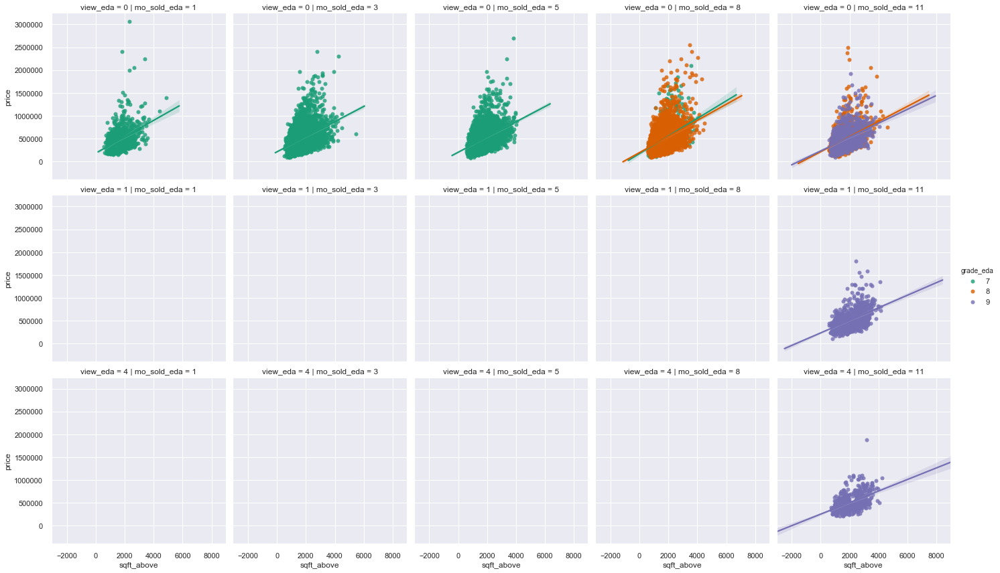

In [41]:
sns.lmplot(x ='sqft_above', y ='price', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='grade_eda', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### house size vs. price in view and sold month aspects over a range of conditions

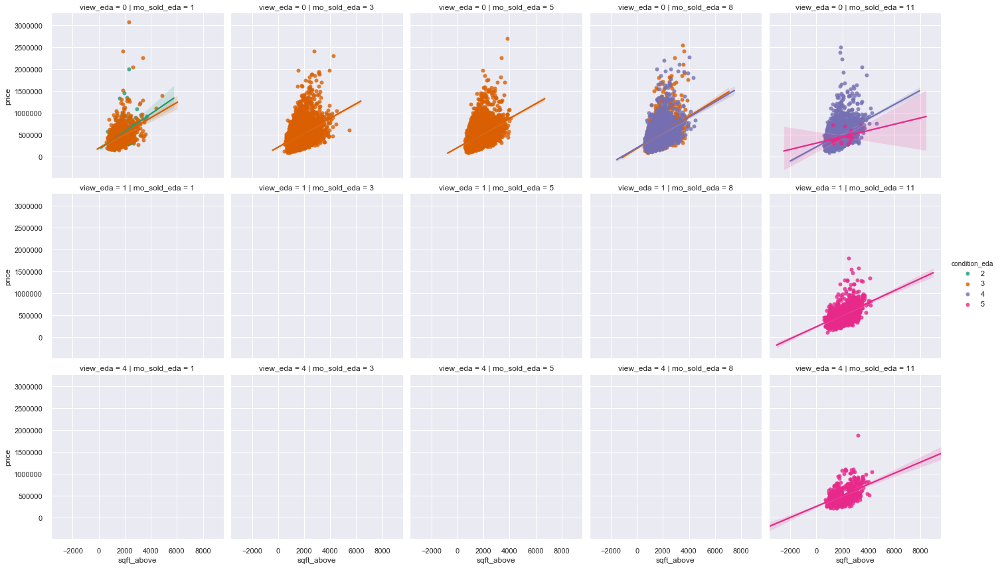

In [42]:
sns.lmplot(x ='sqft_above', y ='price', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='condition_eda', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### house size vs. price in view and sold month aspects over a range of latitudes (either more northern or southern)

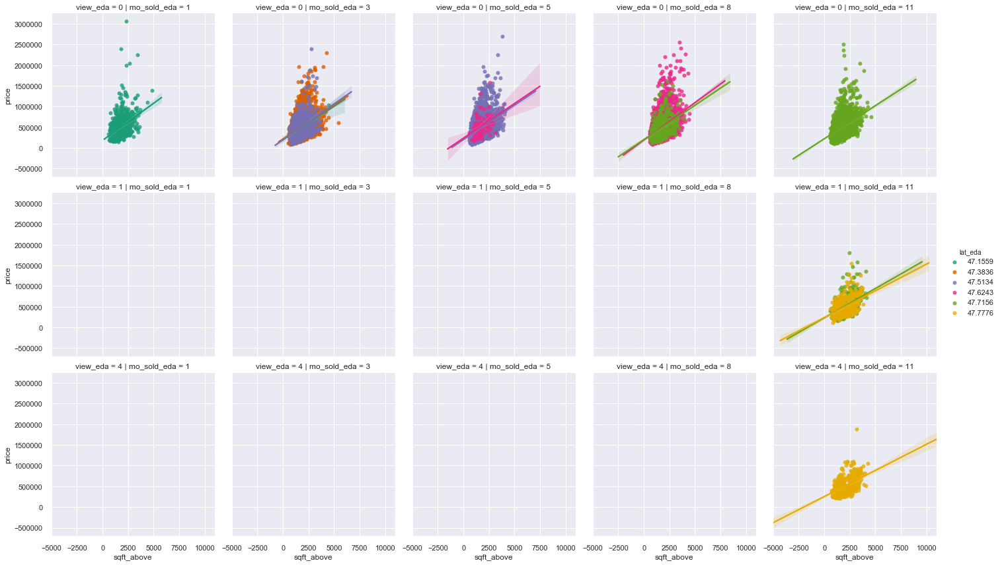

In [43]:
sns.lmplot(x ='sqft_above', y ='price', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='lat_eda', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### house age vs. price in view and sold month aspects over a range of latitudes (either more northern or southern)

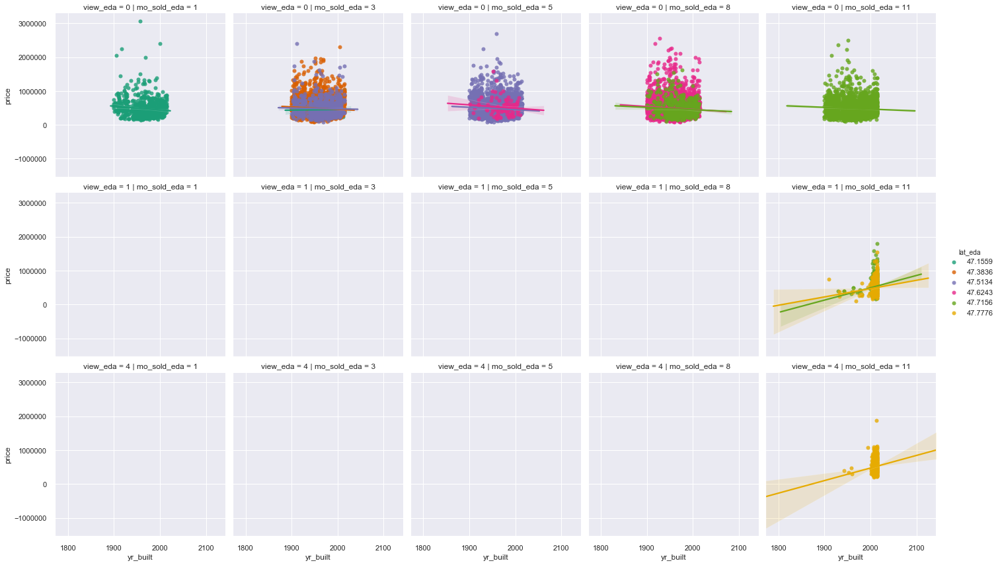

In [44]:
sns.lmplot(x ='yr_built', y ='price', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='lat_eda', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### house age vs. its size in view and sold month aspects over a range of latitudes (either more northern or southern)

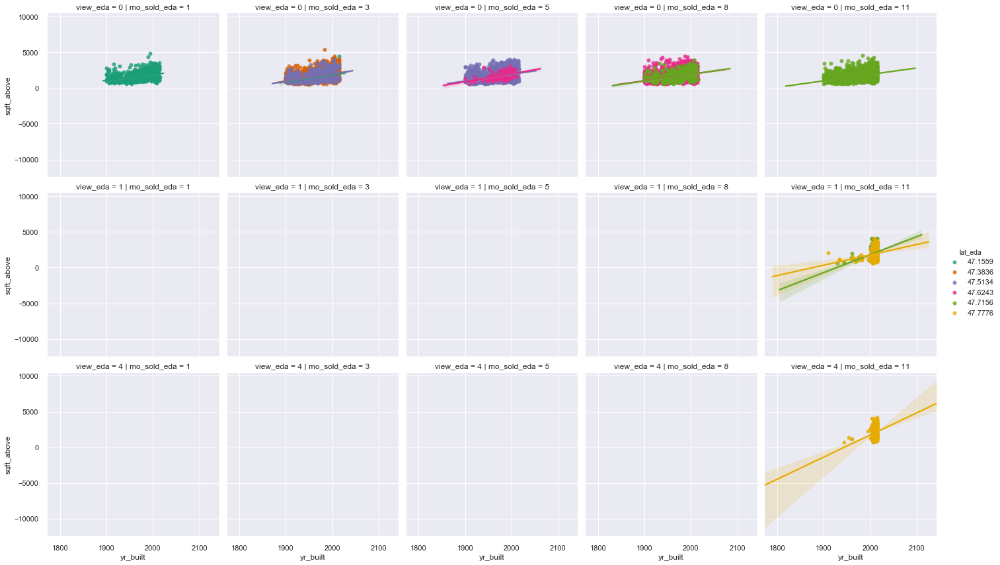

In [46]:
sns.lmplot(x ='yr_built', y ='sqft_above', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='lat_eda', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### house size vs. price in view and sold month aspects over a range of longitudes (either more eastern or western)

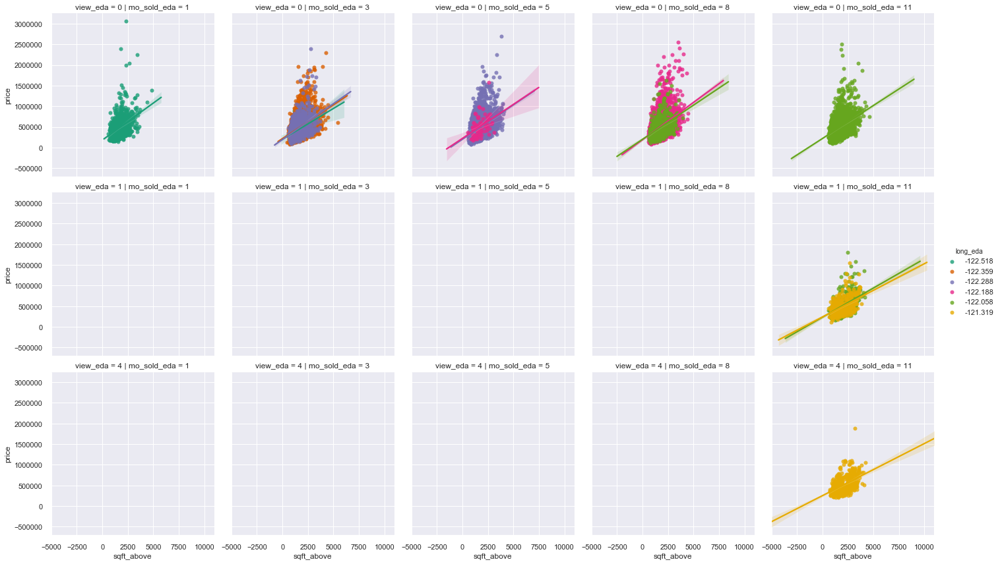

In [47]:
sns.lmplot(x ='sqft_above', y ='price', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='long_eda', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### house age vs. price in view and sold month aspects over a range of longitudes (either more eastern or western)

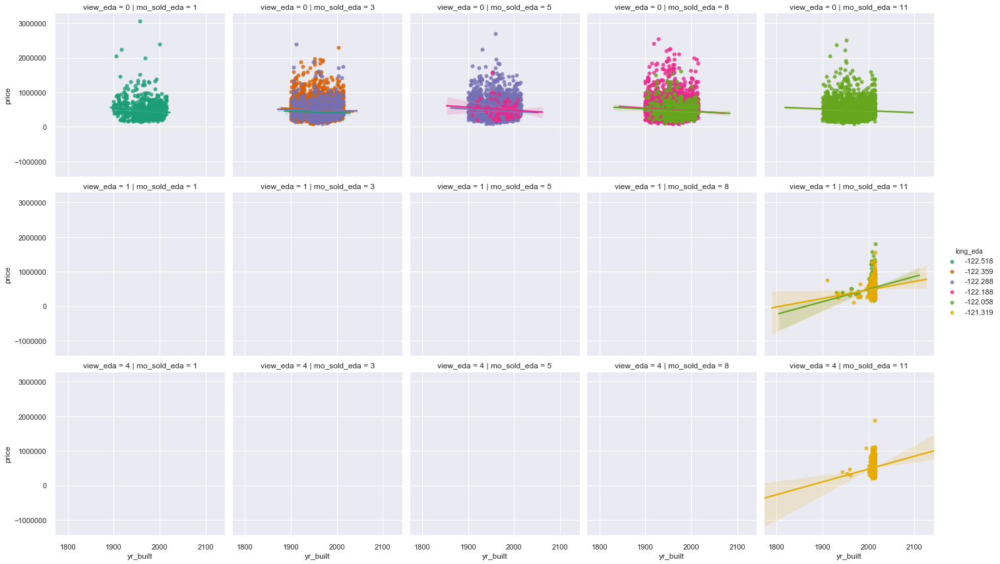

In [48]:
sns.lmplot(x ='yr_built', y ='price', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='long_eda', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### house age vs. size in view and sold month aspects over a range of longitudes (either more eastern or western)

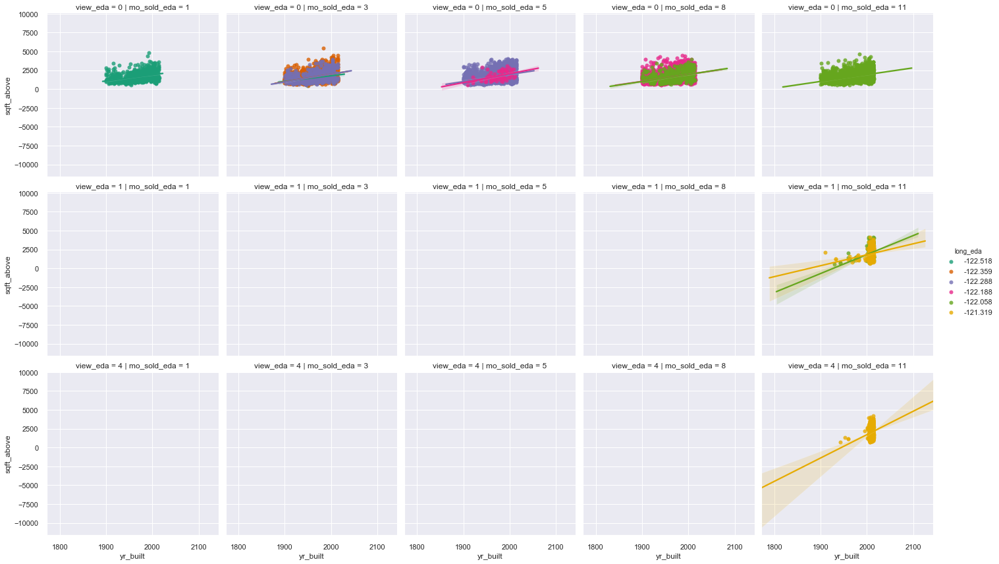

In [49]:
sns.lmplot(x ='yr_built', y ='sqft_above', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='long_eda', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### N/S location vs. price in view and sold month aspects over a range of conditions

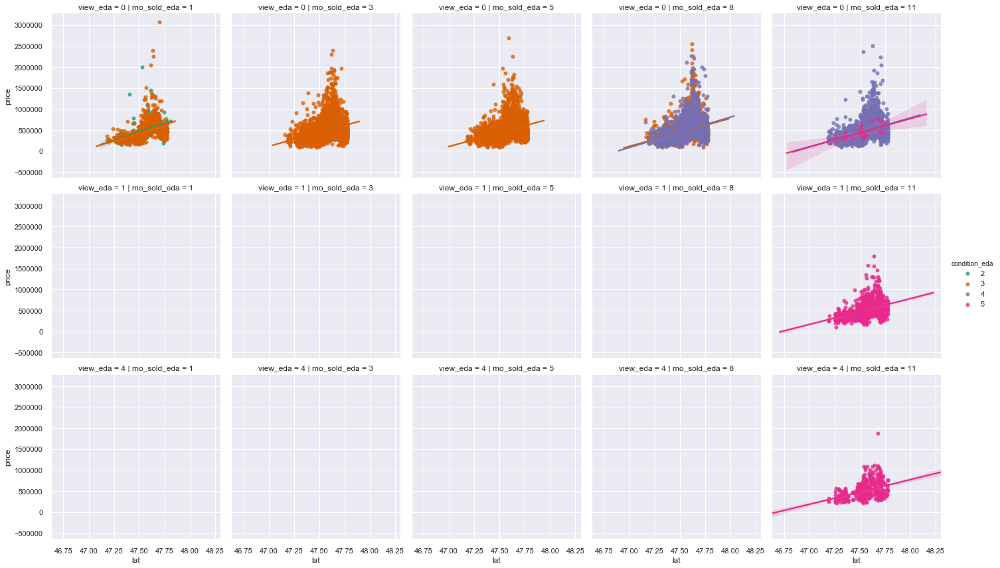

In [50]:
sns.lmplot(x ='lat', y ='price', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='condition_eda', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### N/S location vs. house size in view and sold month aspects over a range of conditions

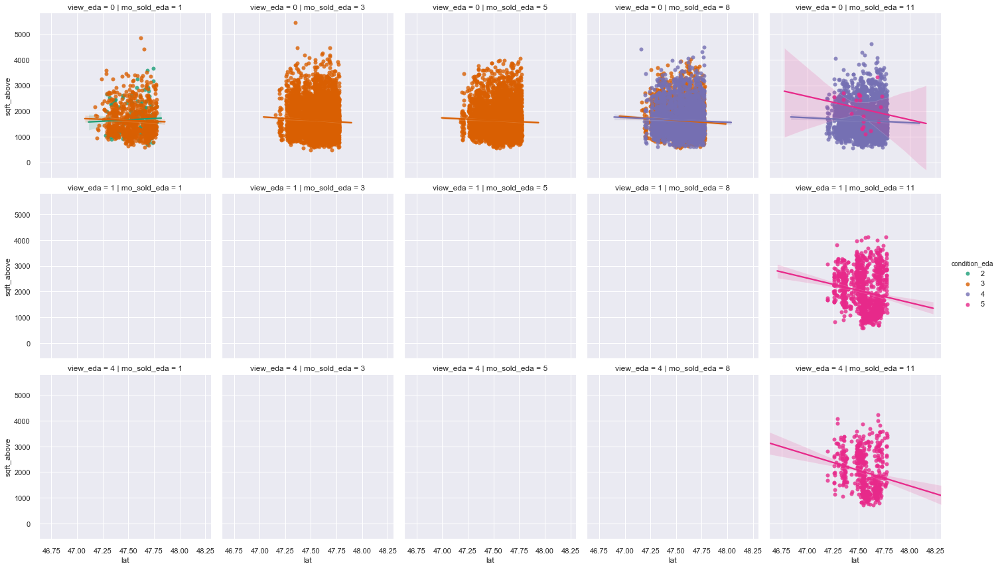

In [51]:
sns.lmplot(x ='lat', y ='sqft_above', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='condition_eda', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### E/W location vs. price in view and sold month aspects over a range of conditions

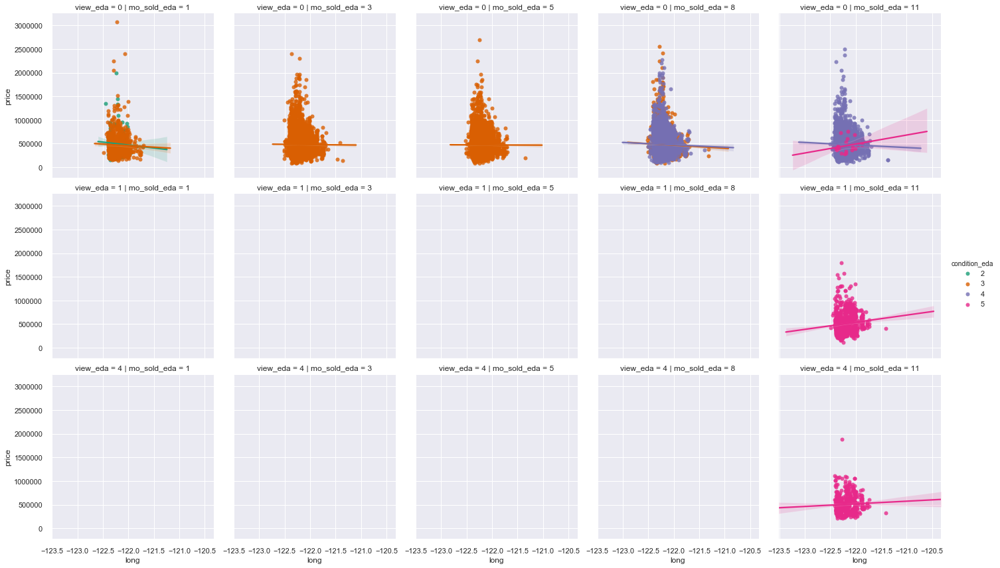

In [52]:
sns.lmplot(x ='long', y ='price', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='condition_eda', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### E/W location vs. house size in view and sold month aspects over a range of conditions

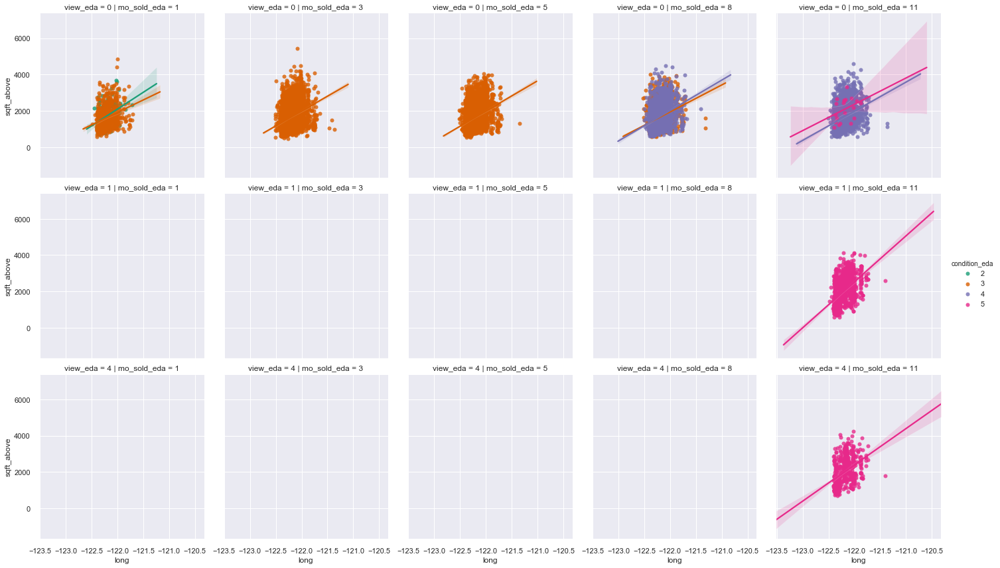

In [53]:
sns.lmplot(x ='long', y ='sqft_above', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='condition_eda', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### house size vs. price in view and sold month aspects with renovation

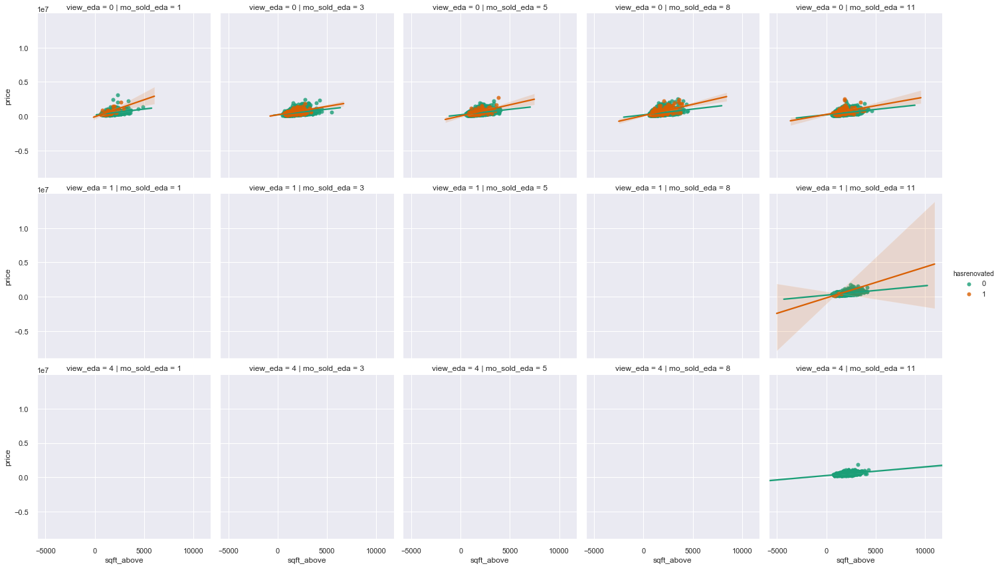

In [54]:
sns.lmplot(x ='sqft_above', y ='price', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='hasrenovated', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### house age vs. its size in view and sold month aspects with renovation

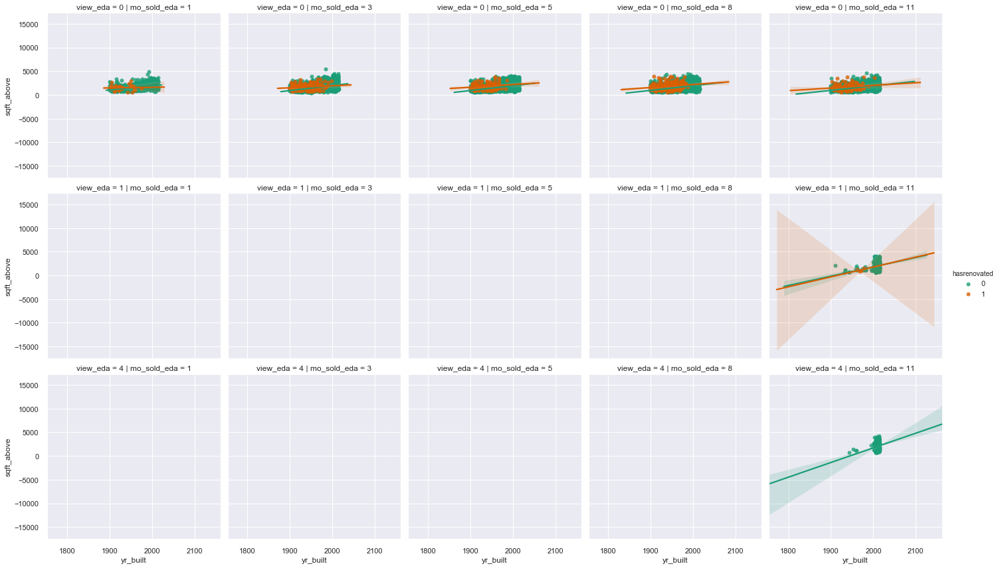

In [55]:
sns.lmplot(x ='yr_built', y ='sqft_above', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='hasrenovated', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### house size vs. price in view and sold month aspects with basement

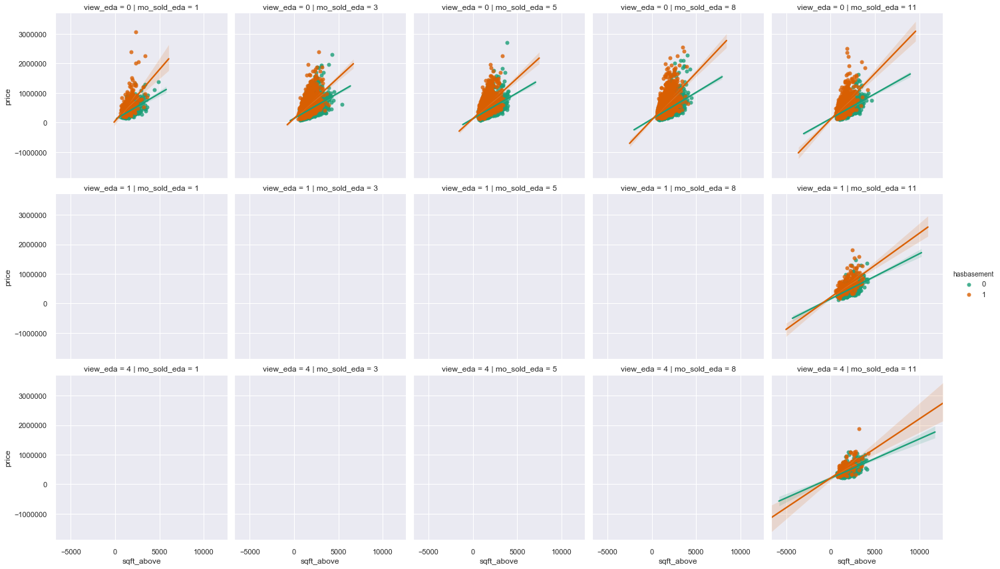

In [56]:
sns.lmplot(x ='sqft_above', y ='price', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='hasbasement', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### house age vs. its size in view and sold month aspects with basement

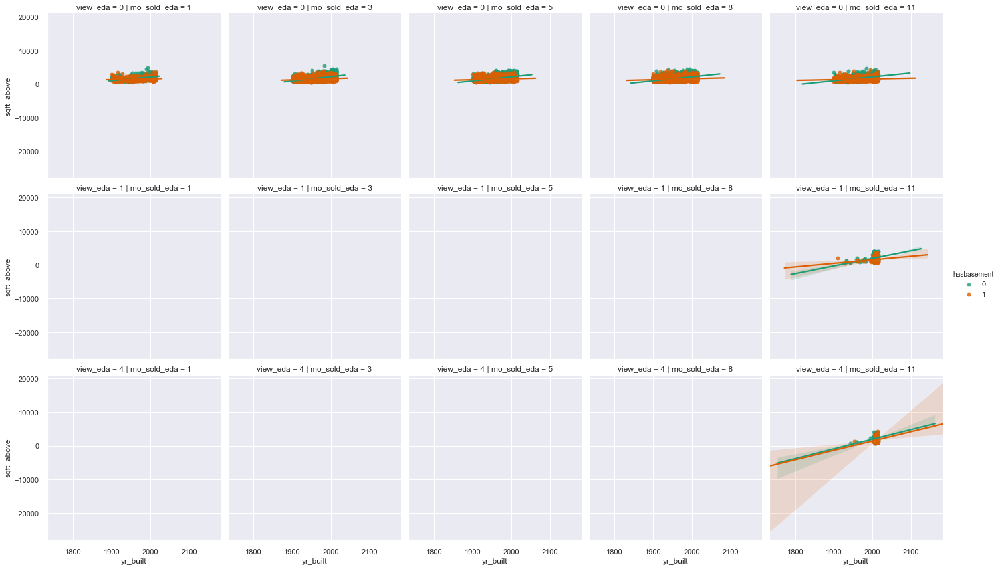

In [57]:
sns.lmplot(x ='yr_built', y ='sqft_above', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='hasbasement', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### house size vs. its price in view and sold month aspects with larger living area

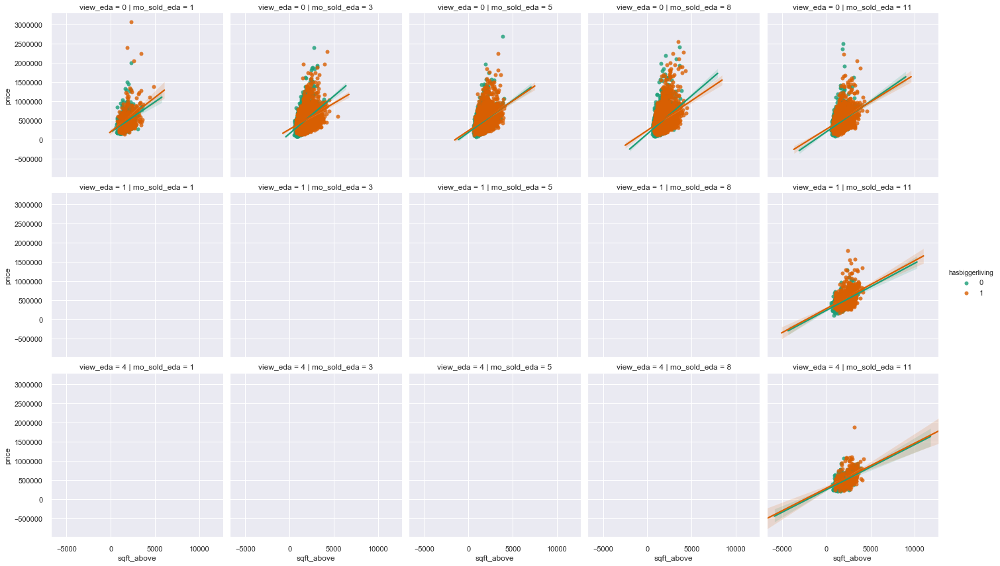

In [58]:
sns.lmplot(x ='sqft_above', y ='price', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='hasbiggerliving', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### house age vs. its size in view and sold month aspects with larger living area

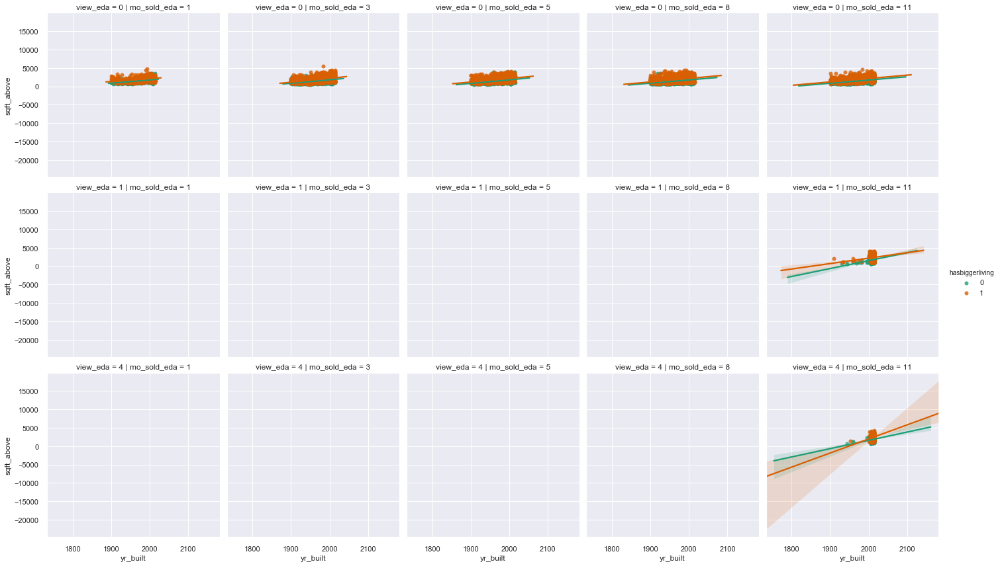

In [59]:
sns.lmplot(x ='yr_built', y ='sqft_above', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='hasbiggerliving', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### house size vs. its price in N/S location and sold month aspects with larger living area

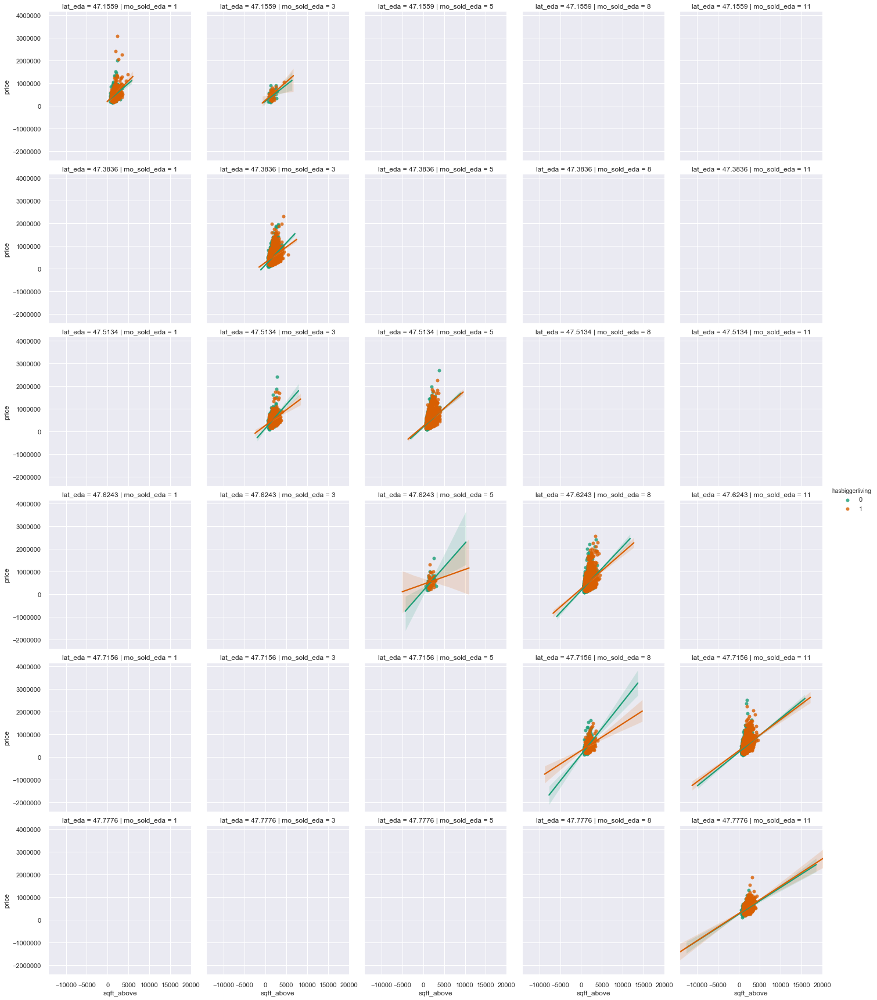

In [60]:
sns.lmplot(x ='sqft_above', y ='price', row='lat_eda', col='mo_sold_eda', data = kc_eda, hue='hasbiggerliving', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### house age vs. its size in N/S location and sold month aspects with larger living area

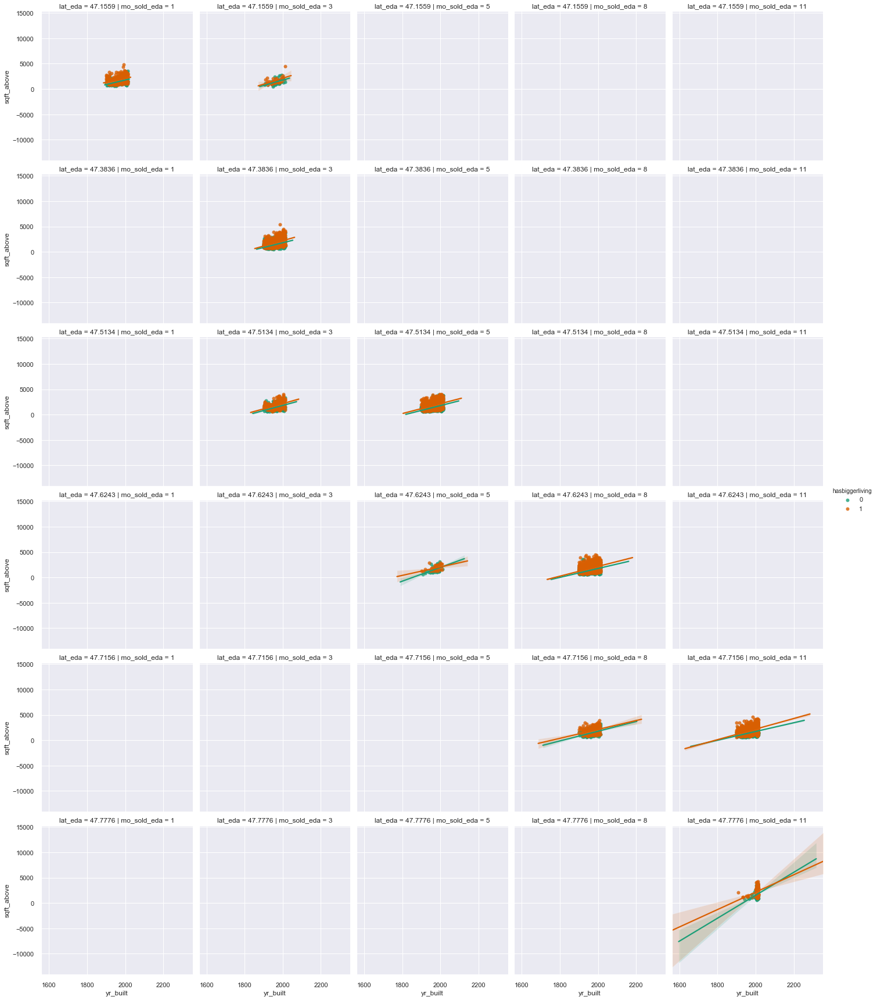

In [61]:
sns.lmplot(x ='yr_built', y ='sqft_above', row='lat_eda', col='mo_sold_eda', data = kc_eda, hue='hasbiggerliving', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### house size vs. its price in E/W location and sold month aspects with larger living area

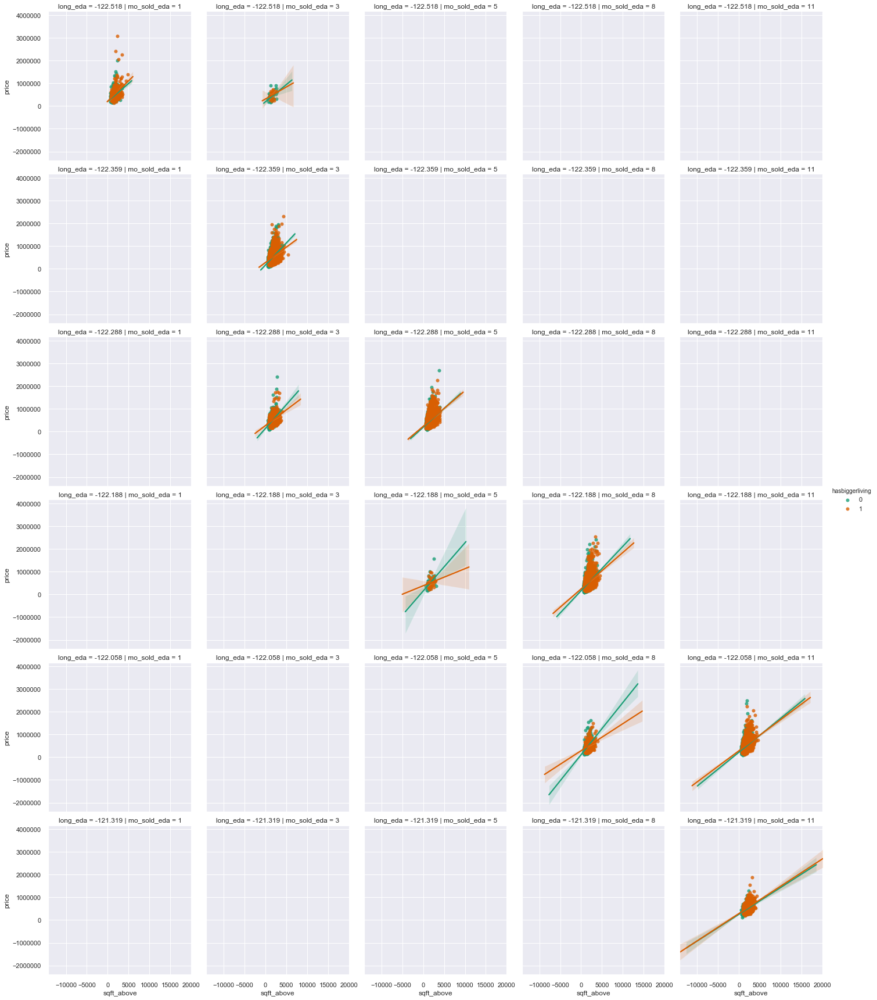

In [62]:
sns.lmplot(x ='sqft_above', y ='price', row='long_eda', col='mo_sold_eda', data = kc_eda, hue='hasbiggerliving', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### house age vs. its size in E/W location and sold month aspects with larger living area

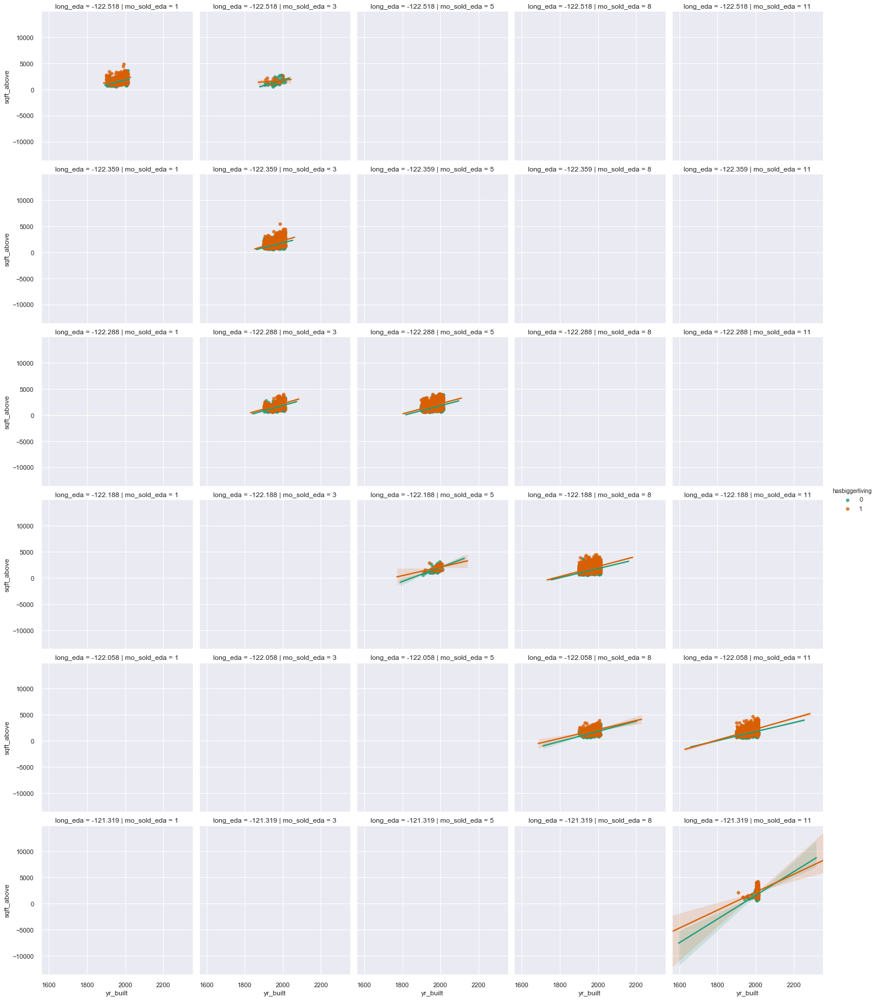

In [63]:
sns.lmplot(x ='yr_built', y ='sqft_above', row='long_eda', col='mo_sold_eda', data = kc_eda, hue='hasbiggerliving', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### house size vs. its price in view and sold month aspects with larger lot

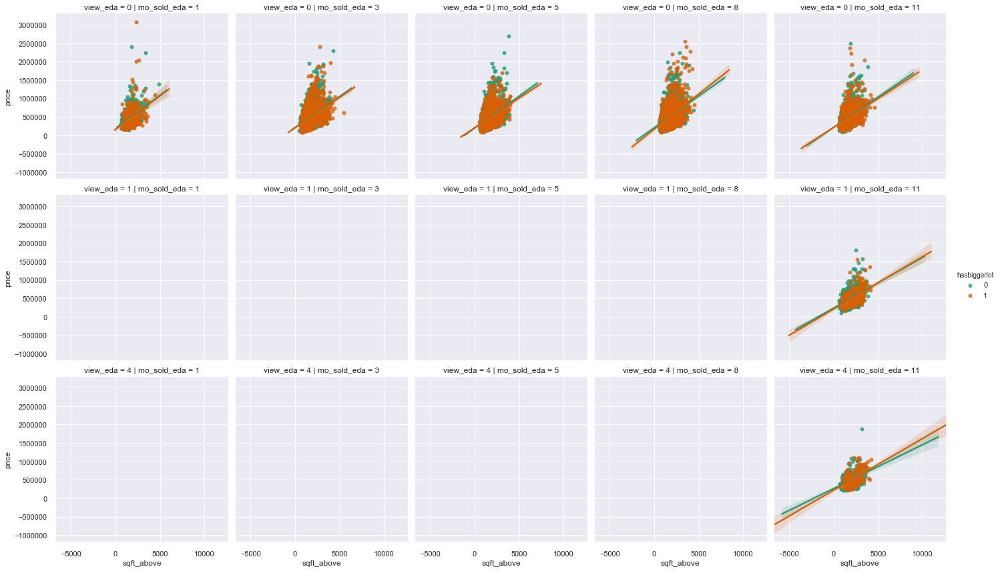

In [64]:
sns.lmplot(x ='sqft_above', y ='price', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='hasbiggerlot', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### house age vs. its size in view and sold month aspects with larger lot

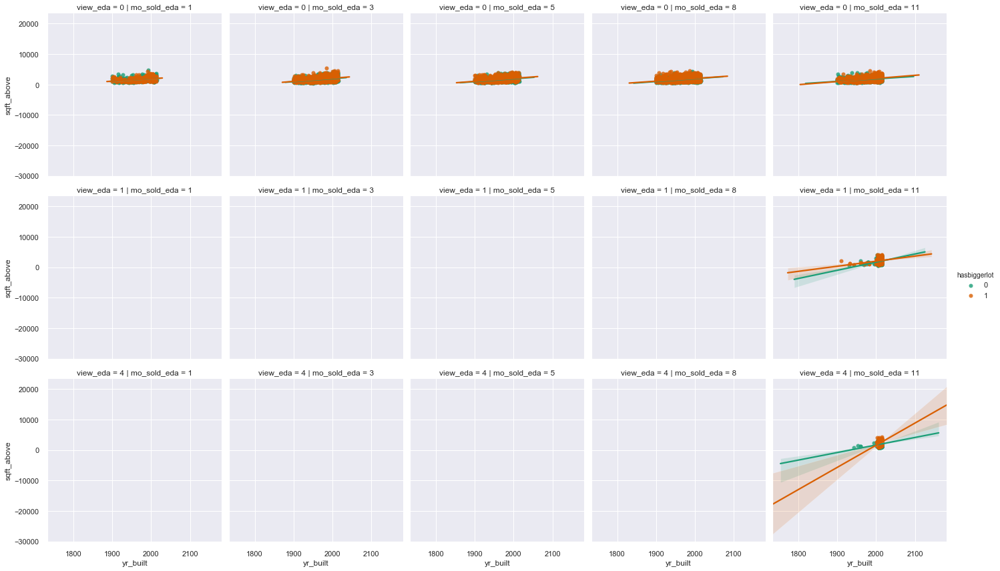

In [65]:
sns.lmplot(x ='yr_built', y ='sqft_above', row='view_eda', col='mo_sold_eda', data = kc_eda, hue='hasbiggerlot', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### house size vs. its price in N/S location and sold month aspects with larger lot

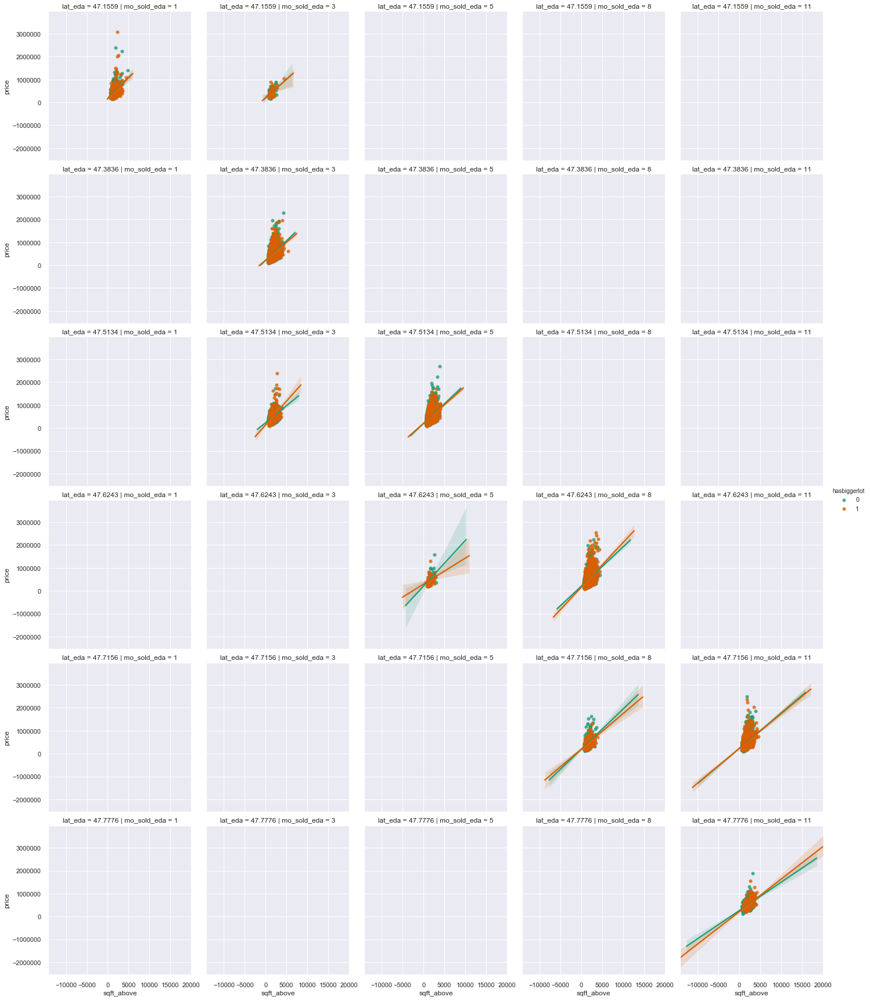

In [66]:
sns.lmplot(x ='sqft_above', y ='price', row='lat_eda', col='mo_sold_eda', data = kc_eda, hue='hasbiggerlot', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### house age vs. its size in N/S location and sold month aspects with larger lot

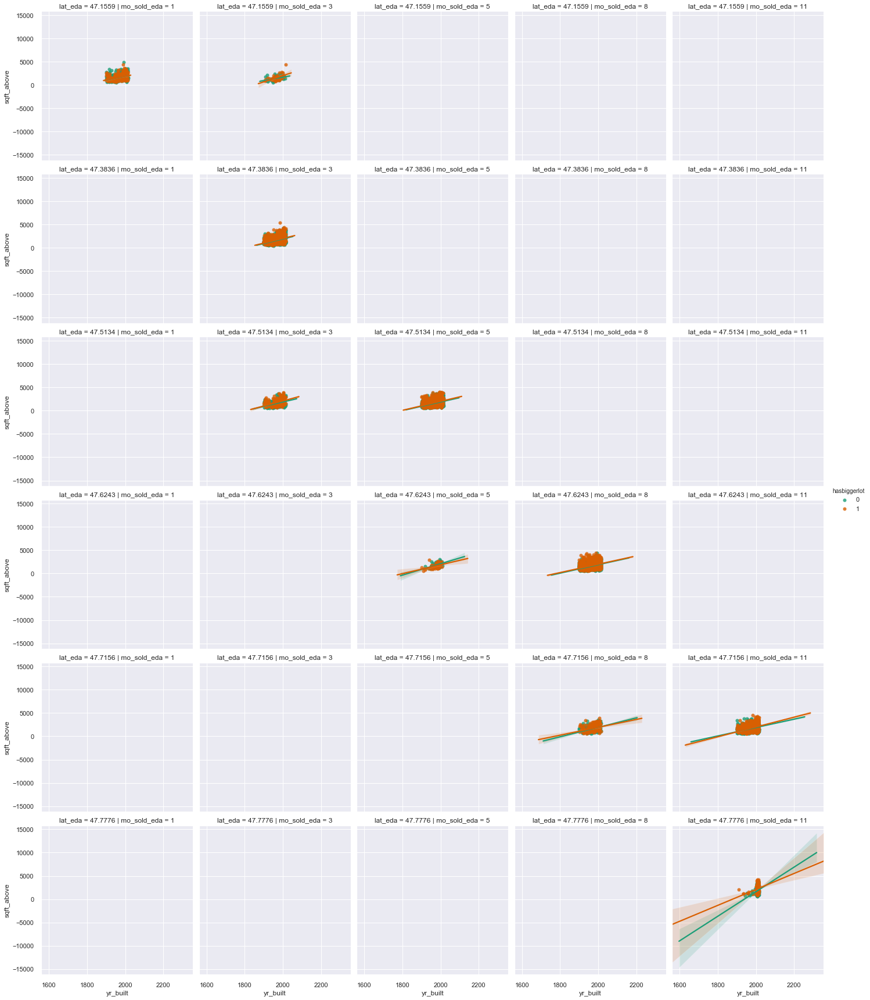

In [67]:
sns.lmplot(x ='yr_built', y ='sqft_above', row='lat_eda', col='mo_sold_eda', data = kc_eda, hue='hasbiggerlot', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### house size vs. its price in E/W location and sold month aspects with larger lot

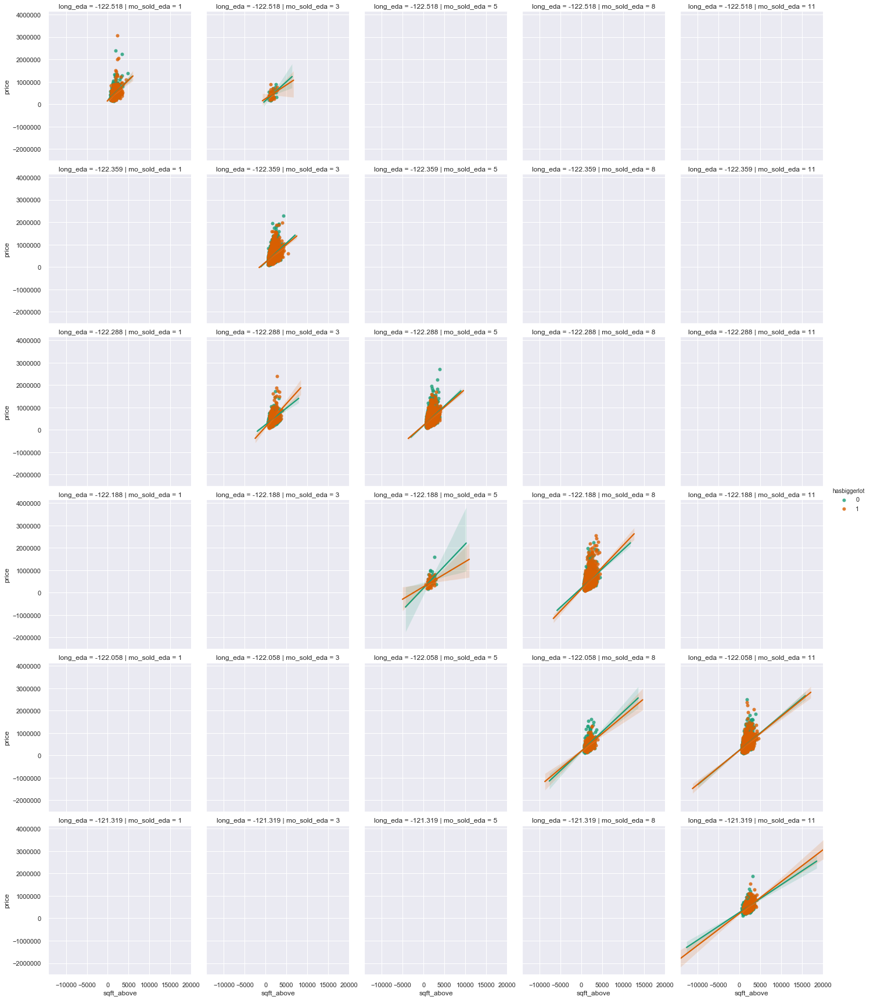

In [68]:
sns.lmplot(x ='sqft_above', y ='price', row='long_eda', col='mo_sold_eda', data = kc_eda, hue='hasbiggerlot', height=4, aspect=1, palette='Dark2', fit_reg=True) 

#### house age vs. its size in E/W location and sold month aspects with larger lot

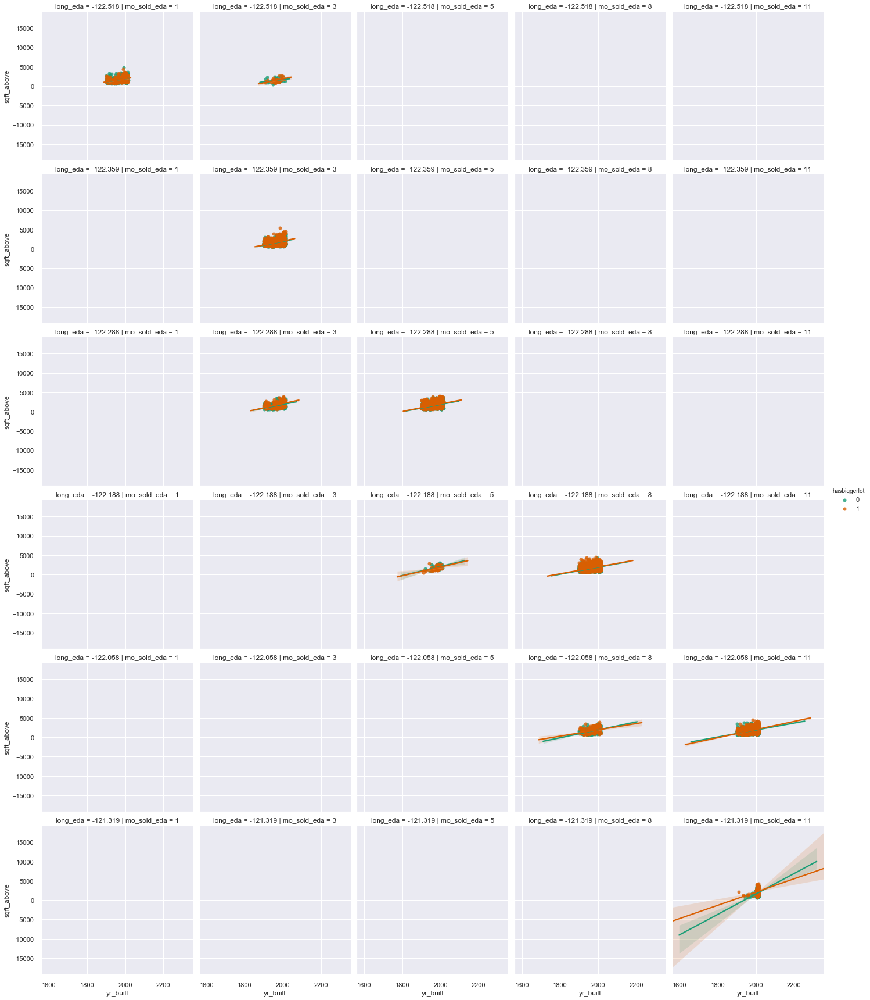

In [69]:
sns.lmplot(x ='yr_built', y ='sqft_above', row='long_eda', col='mo_sold_eda', data = kc_eda, hue='hasbiggerlot', height=4, aspect=1, palette='Dark2', fit_reg=True) 

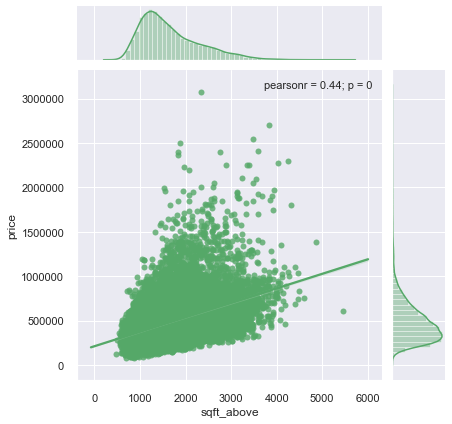

In [70]:
j = sns.jointplot(x='sqft_above', y='price', data=kc_eda, kind='reg', color='g')
j.annotate(stats.pearsonr)
plt.show()

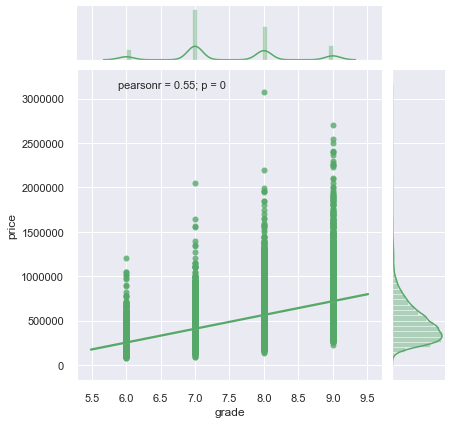

In [71]:
j = sns.jointplot(x='grade', y='price', data=kc_eda, kind='reg', color='g')
j.annotate(stats.pearsonr)
plt.show()

## for modeling: training, testing and making predictions

In [72]:
def convert_to_cate(df, col, read=True, intype=True, digit=0):
    df_clone = df.copy()
    df_clone[col] = sorted(df_clone[col])
    
    print(f'no. unique variables in {col}: {df_clone[col].nunique()}')
    if read:
        print(f'unique values as follows: {df_clone[col].unique()}')
    
    q_0 = float(df_clone[col].min())
    q_10 = df_clone[col].quantile(q=0.10)
    q_20 = df_clone[col].quantile(q=0.20)
    q_30 = df_clone[col].quantile(q=0.30)
    q_40 = df_clone[col].quantile(q=0.40)
    q_50 = df_clone[col].median()
    q_60 = df_clone[col].quantile(q=0.60)
    q_70 = df_clone[col].quantile(q=0.70)
    q_80 = df_clone[col].quantile(q=0.80)
    q_90 = df_clone[col].quantile(q=0.90)
    q_100 = float(df_clone[col].max())
            
    print('q0=',round(q_0,digit),'q10=',round(q_10,digit),'q20=',round(q_20,digit),'q30=',round(q_30,digit),
          'q40=',round(q_40,digit))
    print('q50=',round(q_50,digit),'q60=',round(q_60,digit),'q70=',round(q_70,digit),'q80=',round(q_80,digit), 
          'q90=',round(q_90,digit),'q100=',round(q_100,digit))
    print(f'size {df_clone[col].shape[0]}')
    
    for idx, row in df_clone.iterrows():
        if (row[col] <= q_10):
            df_clone.loc[idx,col] = (q_0 + q_10) / 2
        elif (row[col] > q_10) & (row[col] <= q_20):
            df_clone.loc[idx,col] = (q_10 + q_20) / 2
        elif (row[col] > q_20) & (row[col] <= q_30):
            df_clone.loc[idx,col] = (q_20 + q_30) / 2
        elif (row[col] > q_30) & (row[col] <= q_40):
            df_clone.loc[idx,col] = (q_30 + q_40) / 2
        elif (row[col] > q_40) & (row[col] <= q_50):
            df_clone.loc[idx,col] = (q_40 + q_50) / 2
        elif (row[col] > q_50) & (row[col] <= q_60):
            df_clone.loc[idx,col] = (q_50 + q_60) / 2
        elif (row[col] > q_60) & (row[col] <= q_70):
            df_clone.loc[idx,col] = (q_60 + q_70) / 2
        elif (row[col] > q_70) & (row[col] <= q_80):
            df_clone.loc[idx,col] = (q_70 + q_80) / 2
        elif (row[col] > q_80) & (row[col] <= q_90):
            df_clone.loc[idx,col] = (q_80 + q_90) / 2
        elif (row[col] > q_90) & (row[col] <= q_100):
            df_clone.loc[idx,col] = (q_90 + q_100) / 2
        else:
            print('sth.',row[col],'not included!')
            
    df_clone[col] = df_clone[col].apply(np.ceil) # or np.floor
    
    if intype:
        df_clone[col] = df_clone[col].astype('int64')
    else:
        df_clone[col] = df_clone[col].apply(lambda x:round(x,digit))
    
    return df_clone

In [83]:
kc12 = convert_to_cate(kc12, 'yr_built', True, 0)
kc12['yr_built'] = kc12['yr_built'].astype('int64')
kc12.yr_built.unique()

no. unique variables in yr_built: 116
unique values as follows: [1900 1901 1902 1903 1904 1905 1906 1907 1908 1909 1910 1911 1912 1913
 1914 1915 1916 1917 1918 1919 1920 1921 1922 1923 1924 1925 1926 1927
 1928 1929 1930 1931 1932 1933 1934 1935 1936 1937 1938 1939 1940 1941
 1942 1943 1944 1945 1946 1947 1948 1949 1950 1951 1952 1953 1954 1955
 1956 1957 1958 1959 1960 1961 1962 1963 1964 1965 1966 1967 1968 1969
 1970 1971 1972 1973 1974 1975 1976 1977 1978 1979 1980 1981 1982 1983
 1984 1985 1986 1987 1988 1989 1990 1991 1992 1993 1994 1995 1996 1997
 1998 1999 2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011
 2012 2013 2014 2015]
q0= 1900.0 q10= 1926.0 q20= 1947.0 q30= 1956.0 q40= 1965.0
q50= 1975.0 q60= 1983.0 q70= 1991.0 q80= 2001.0 q90= 2007.0 q100= 2015.0
size 21597


array([1913., 1937., 1952., 1961., 1970., 1979., 1987., 1996., 2004.,
       2011.])

In [84]:
kc12 = convert_to_cate(kc12, 'zipcode', True, 0)
kc12['zipcode'] = kc12['zipcode'].astype('int64')
kc12.zipcode.unique()

no. unique variables in zipcode: 70
unique values as follows: [98001 98002 98003 98004 98005 98006 98007 98008 98010 98011 98014 98019
 98022 98023 98024 98027 98028 98029 98030 98031 98032 98033 98034 98038
 98039 98040 98042 98045 98052 98053 98055 98056 98058 98059 98065 98070
 98072 98074 98075 98077 98092 98102 98103 98105 98106 98107 98108 98109
 98112 98115 98116 98117 98118 98119 98122 98125 98126 98133 98136 98144
 98146 98148 98155 98166 98168 98177 98178 98188 98198 98199]
q0= 98001.0 q10= 98008.0 q20= 98028.0 q30= 98038.0 q40= 98053.0
q50= 98065.0 q60= 98103.0 q70= 98115.0 q80= 98125.0 q90= 98155.0 q100= 98199.0
size 21597


array([98005., 98018., 98033., 98046., 98059., 98084., 98109., 98120.,
       98140., 98177.])

In [85]:
kc12['bathrooms'] = np.around(kc12['bathrooms'],2)
kc12['bedrooms'] = np.around(kc12['bedrooms'],0)
kc12['floors'] = np.around(kc12['floors'],1)
kc12['condition'] = np.around(kc12['condition'],0)
kc12['grade'] = np.around(kc12['grade'],0)
kc12['waterfront'] = np.around(kc12['waterfront'],0)
kc12['view'] = np.around(kc12['view'],0)
kc12['hasrenovated'] = np.around(kc12['hasrenovated'],0)
kc12['hasbasement'] = np.around(kc12['hasbasement'],0)
kc12['hasbiggerliving'] = np.around(kc12['hasbiggerliving'],0)
kc12['hasbiggerlot'] = np.around(kc12['hasbiggerlot'],0)

# exploring data

## count unique values 

In [86]:
def unique_features_plt(df):
    df_clone = df.copy()
    df_clone = df_clone.loc[:, df_clone.dtypes != 'object']
    print(df_clone.info())
    print(df_clone.nunique())
    
    fig, ax = plt.subplots(1,1,figsize = (15, 5)) 
    plt.bar(df_clone.columns,df_clone.nunique(),color='green',alpha=0.4,width=0.2)
    plt.xticks(rotation=90)
    plt.yscale('log')
    plt.show()
    
    return None

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
price              21597 non-null float64
bedrooms           21597 non-null int64
bathrooms          21597 non-null float64
sqft_living        21597 non-null int64
sqft_lot           21597 non-null int64
floors             21597 non-null float64
waterfront         21597 non-null int64
view               21597 non-null int64
condition          21597 non-null int64
grade              21597 non-null int64
sqft_above         21597 non-null int64
yr_built           21597 non-null float64
zipcode            21597 non-null float64
lat                21597 non-null float64
long               21597 non-null float64
hasrenovated       21597 non-null int64
hasbasement        21597 non-null int64
hasbiggerliving    21597 non-null int64
hasbiggerlot       21597 non-null int64
yr_sold            21597 non-null int64
mo_sold            21597 non-null int64
dtypes: float64(7), int64(14)
memory 

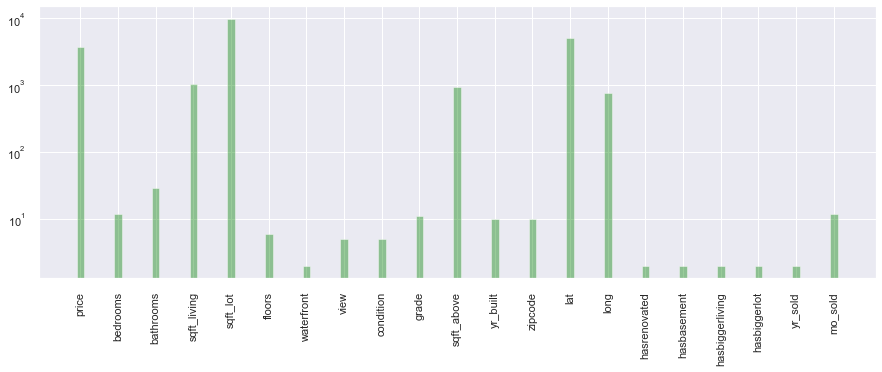

In [87]:
unique_features_plt(kc12)

## understand data

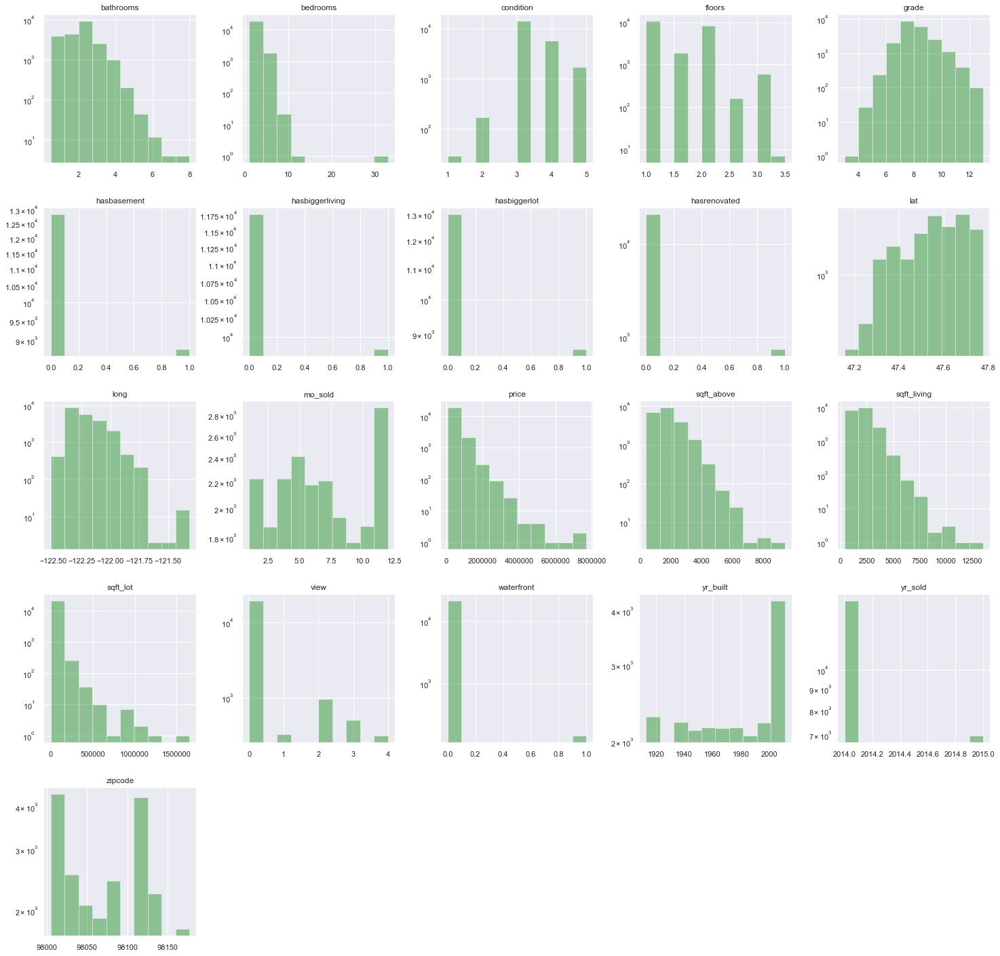

In [88]:
kc12.hist(figsize=(25,25), color='green', alpha=0.4, log=True)
plt.show()

##  inspect features

Column Names and descriptions for Kings County Data Set
* **id** - unique identified for a house
* **date** - house was sold
* **price** -  is prediction target
* **bedrooms** -  of Bedrooms/House
* **bathrooms** -  of bathrooms/bedrooms
* **sqft_living** -  footage of the home
* **sqft_lot** -  footage of the lot
* **floors** -  floors (levels) in house
* **waterfront** - House which has a view to a waterfront
* **view** - Has been viewed
* **condition** - How good the condition is ( Overall )
* **grade** - overall grade given to the housing unit, based on King County grading system
* **sqft_above** - square footage of house apart from basement
* **sqft_basement** - square footage of the basement
* **yr_built** - Built Year
* **yr_renovated** - Year when house was renovated
* **zipcode** - zip
* **lat** - Latitude coordinate
* **long** - Longitude coordinate
* **sqft_living15** - The square footage of interior housing living space for the nearest 15 neighbors
* **sqft_lot15** - The square footage of the land lots for the nearest 15 neighbors

### continuous features

In [89]:
def check_continuous_feats(df):
    df_clone = df.copy()
    
    for col in df_clone.columns:
        if (df_clone[col].min() < 0) & (df_clone[col].max() < 0):
            print(f'{col} minimal/maximal are negative!')
            df_clone[col+'_korg'] = df_clone[col]
            df_clone[col] *= (-1)
        elif (df_clone[col].min() <= 0) & (df_clone[col].max() > 0):
            print(f'{col} minimal is negative!')
            df_clone[col+'_korg'] = df_clone[col]
            df_clone[col] -= df_clone[col].min()
            df_clone[col] += 1
        else:
            print(f'{col} is positive!')
            
    return df_clone

In [90]:
kc_continuous = kc12.loc[:, (kc12.dtypes != 'object') & (kc12.nunique() > 20)]
#removed_contfeats = ['lat','long']
#continuous = list(col for col in kc_continuous.columns if col not in removed_contfeats)
continuous = list(kc_continuous.columns)
print(continuous)
kc_continuous = kc_continuous.loc[:,continuous]
print(kc_continuous.shape)
kc_continuous.head()

['price', 'bathrooms', 'sqft_living', 'sqft_lot', 'sqft_above', 'lat', 'long']
(21597, 7)


,price,bathrooms,sqft_living,sqft_lot,sqft_above,lat,long
0,221900.0,1.00,1180,5650,1180,47.5112,-122.257
1,538000.0,2.25,2570,7242,2170,47.7210,-122.319
2,180000.0,1.00,770,10000,770,47.7379,-122.233
3,604000.0,3.00,1960,5000,1050,47.5208,-122.393
4,510000.0,2.00,1680,8080,1680,47.6168,-122.045


price
bathrooms
sqft_living
sqft_lot
sqft_above
lat
long


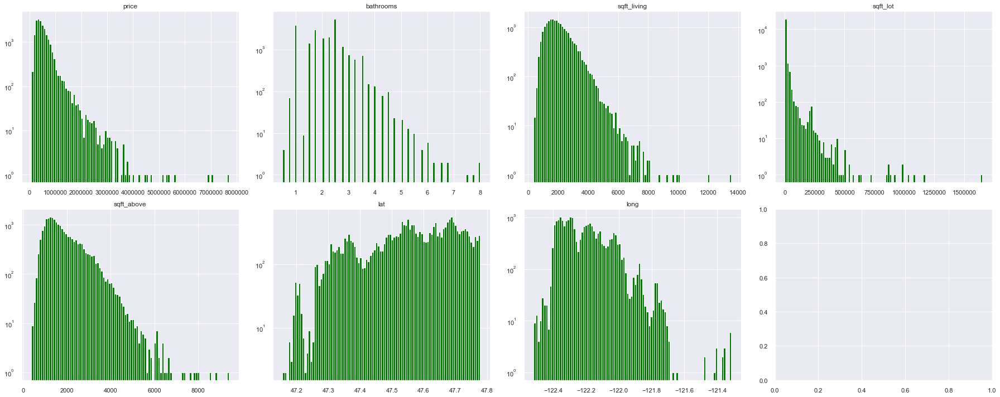

In [92]:
fig, axes = plt.subplots(nrows=kc_continuous.shape[1] // 3, ncols=4, figsize=(25,10))
for xcol, ax in zip(continuous, axes.flatten()):
    print(xcol)
    ax.hist(kc_continuous[xcol], bins=100, color='green')
    ax.set_title(xcol)
    ax.set_yscale('log')
    
fig.tight_layout()

#### check features column by column before applying logarithm transformation

In [93]:
kc_continuous_fit = check_continuous_feats(kc_continuous)
kc_continuous_fit.head()

price is positive!
bathrooms is positive!
sqft_living is positive!
sqft_lot is positive!
sqft_above is positive!
lat is positive!
long minimal/maximal are negative!


,price,bathrooms,sqft_living,sqft_lot,sqft_above,lat,long,long_korg
0,221900.0,1.00,1180,5650,1180,47.5112,122.257,-122.257
1,538000.0,2.25,2570,7242,2170,47.7210,122.319,-122.319
2,180000.0,1.00,770,10000,770,47.7379,122.233,-122.233
3,604000.0,3.00,1960,5000,1050,47.5208,122.393,-122.393
4,510000.0,2.00,1680,8080,1680,47.6168,122.045,-122.045


#### logarithm transformation (scaling) and standard normalization 

Note: we removed columns with non-positive values before applying logarithm transformation.

In [94]:
# log features

#removed_feats = ['yr_sdiff_korg','yr_rdiff_korg','yr_srdif_korg']
removed_feats = ['long_korg']
kc_continuous_fit = kc_continuous_fit.drop(removed_feats,axis=1)

log_names = [f'{col}_log' for col in continuous]

kc_log = np.log(kc_continuous_fit)
kc_log.columns = log_names

kc_log.head()

,price_log,bathrooms_log,sqft_living_log,sqft_lot_log,sqft_above_log,lat_log,long_log
0,12.309982,0.000000,7.073270,8.639411,7.073270,3.860965,4.806125
1,13.195614,0.810930,7.851661,8.887653,7.682482,3.865372,4.806632
2,12.100712,0.000000,6.646391,9.210340,6.646391,3.865726,4.805929
3,13.311329,1.098612,7.580700,8.517193,6.956545,3.861168,4.807237
4,13.142166,0.693147,7.426549,8.997147,7.426549,3.863186,4.804390


In [95]:
# normalize (subract mean and divide by std)

def normalize(feature):
    return (feature - feature.mean()) / feature.std()

kc_log_norm = kc_log.apply(normalize)
kc_log_norm.head()

,price_log,bathrooms_log,sqft_living_log,sqft_lot_log,sqft_above_log,lat_log,long_log
0,-1.401998,-1.726509,-1.125556,-0.388430,-0.753565,-0.351359,0.306054
1,0.279938,0.339653,0.709446,-0.113241,0.672693,1.160018,0.746142
2,-1.799430,-1.726509,-2.131893,0.244475,-1.752954,1.281474,0.135637
3,0.499698,1.072635,0.070674,-0.523914,-1.026835,-0.282056,1.271117
4,0.178434,0.039555,-0.292725,0.008139,0.073515,0.410205,-1.200453


price_log
bathrooms_log
sqft_living_log
sqft_lot_log
sqft_above_log
lat_log
long_log


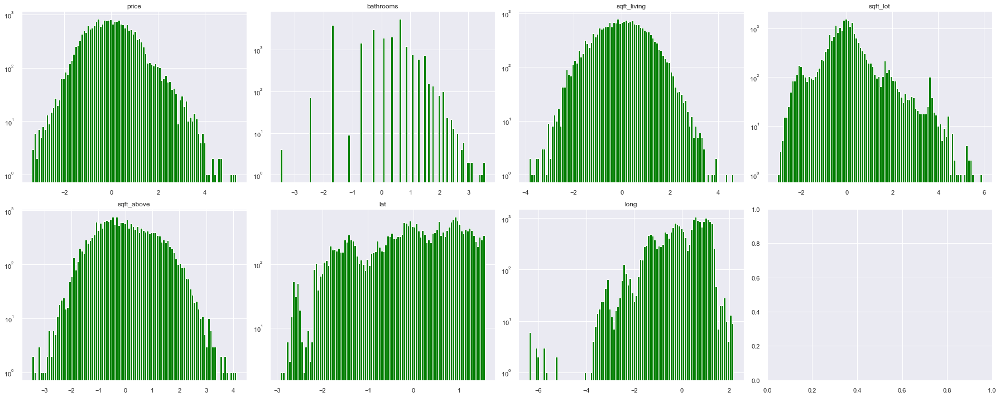

In [97]:
fig2, axes = plt.subplots(nrows=kc_log_norm.shape[1] // 3, ncols=4, figsize=(25,10))
for xcol, ax in zip(continuous, axes.flatten()):
    print(xcol+'_log')
    ax.hist(kc_log_norm[xcol+'_log'], bins=100, color='green')
    ax.set_title(xcol)
    ax.set_yscale('log')
    
fig2.tight_layout()

### categoricals features

In [98]:
kc12.columns

Index(['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'grade', 'sqft_above', 'yr_built',
       'zipcode', 'lat', 'long', 'hasrenovated', 'hasbasement',
       'hasbiggerliving', 'hasbiggerlot', 'yr_sold', 'mo_sold'],
      dtype='object')

In [99]:
kc_continuous_fit.columns

Index(['price', 'bathrooms', 'sqft_living', 'sqft_lot', 'sqft_above', 'lat',
       'long'],
      dtype='object')

In [103]:
categorical = ['price','bedrooms','floors','waterfront','view','condition','grade','yr_built','zipcode',
               'hasrenovated','hasbasement','hasbiggerliving','hasbiggerlot','yr_sold','mo_sold']
kc_categorical = kc12.loc[:, categorical]
print(kc_categorical.shape)
kc_categorical.head()

(21597, 15)


,price,bedrooms,floors,waterfront,view,condition,grade,yr_built,zipcode,hasrenovated,hasbasement,hasbiggerliving,hasbiggerlot,yr_sold,mo_sold
0,221900.0,3,1.0,0,0,3,7,1913.0,98005.0,0,0,0,0,2014,10
1,538000.0,3,2.0,0,0,3,7,1913.0,98005.0,1,1,1,0,2014,12
2,180000.0,2,1.0,0,0,3,6,1913.0,98005.0,0,0,0,1,2015,2
3,604000.0,4,1.0,0,0,5,7,1913.0,98005.0,0,1,1,0,2014,12
4,510000.0,3,1.0,0,0,3,8,1913.0,98005.0,0,0,0,1,2015,2


price
bedrooms
floors
waterfront
view
condition
grade
yr_built
zipcode
hasrenovated
hasbasement
hasbiggerliving
hasbiggerlot
yr_sold
mo_sold


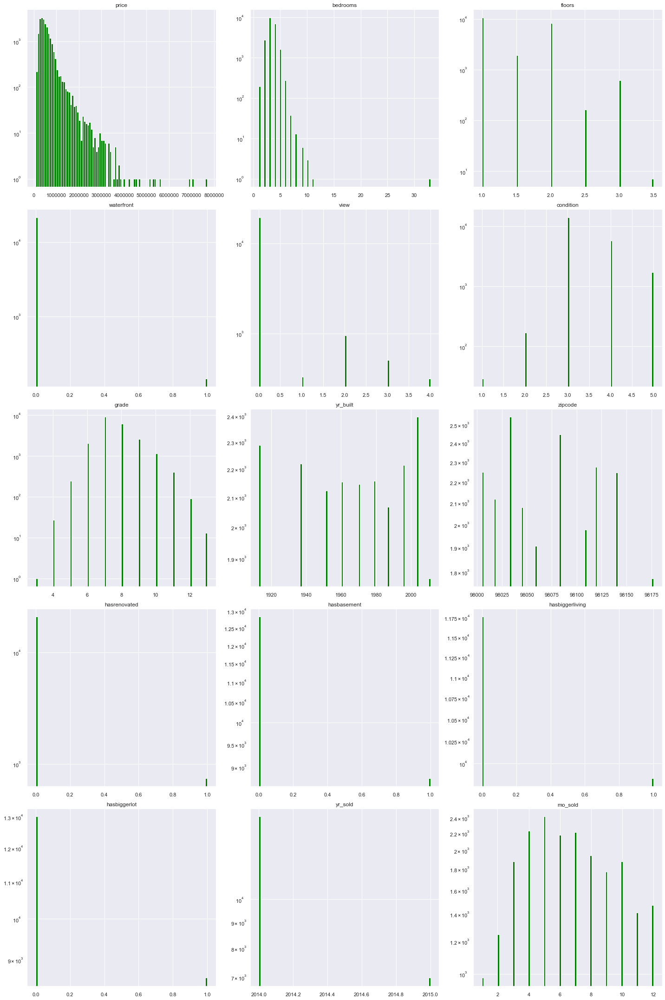

In [106]:
fig3, axes = plt.subplots(nrows=kc_categorical.shape[1] // 3, ncols=3, figsize=(20,30))
for xcol, ax in zip(categorical, axes.flatten()):
    print(xcol)
    ax.hist(kc_categorical[xcol], bins=100, color='green')
    ax.set_title(xcol)
    ax.set_yscale('log')
    
fig3.tight_layout()

## check linearity
### continuous features

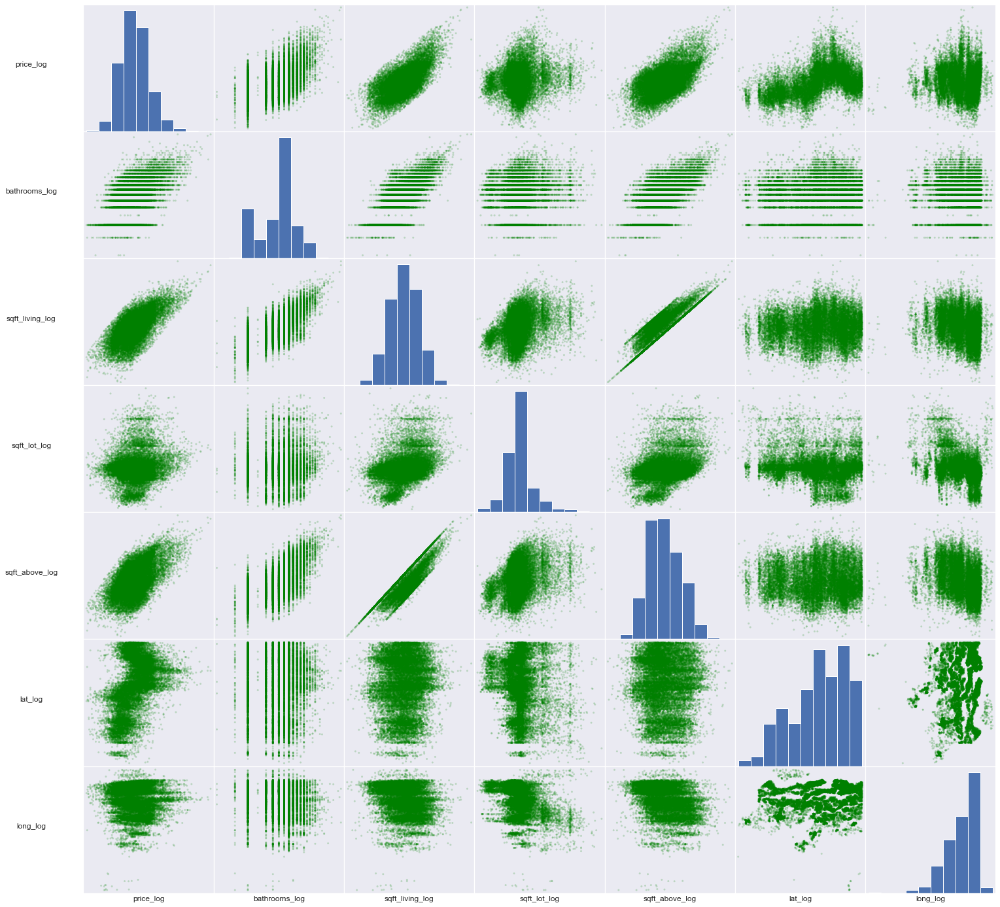

In [108]:
# Your code here 
sm = pd.plotting.scatter_matrix(kc_log_norm, color='green', alpha=0.2, figsize=[25, 25]);

# Rotates the text
[s.xaxis.label.set_rotation(0) for s in sm.reshape(-1)]
[s.yaxis.label.set_rotation(0) for s in sm.reshape(-1)]

# May need to offset label when rotating to prevent overlap of figure
[s.get_yaxis().set_label_coords(-0.4,0.5) for s in sm.reshape(-1)]

# Hide all ticks
[s.set_xticks(()) for s in sm.reshape(-1)]
[s.set_yticks(()) for s in sm.reshape(-1)]

plt.show()

In [109]:
kc_log_norm.corr()

,price_log,bathrooms_log,sqft_living_log,sqft_lot_log,sqft_above_log,lat_log,long_log
price_log,1.000000,0.520278,0.674802,0.138261,0.586013,0.449133,-0.050828
bathrooms_log,0.520278,1.000000,0.760764,0.084877,0.683889,0.011330,-0.241395
sqft_living_log,0.674802,0.760764,1.000000,0.325983,0.864979,0.038881,-0.257081
sqft_lot_log,0.138261,0.084877,0.325983,1.000000,0.318663,-0.149394,-0.376157
sqft_above_log,0.586013,0.683889,0.864979,0.318663,1.000000,-0.019118,-0.361924
lat_log,0.449133,0.011330,0.038881,-0.149394,-0.019118,1.000000,0.135284
long_log,-0.050828,-0.241395,-0.257081,-0.376157,-0.361924,0.135284,1.000000


In [110]:
cc1_df = kc_log_norm.corr().abs().stack().reset_index().sort_values(0, ascending=True)
print(cc1_df.head())
cc1_df['pairs'] = list(zip(cc1_df.level_0, cc1_df.level_1))
cc1pairs_df = cc1_df.set_index('pairs')
cc1pairs_df = cc1pairs_df.drop(['level_1', 'level_0'], axis=1)
cc1pairs_df.columns = ['cc']
cc1pairs_df = cc1pairs_df.drop_duplicates(keep='first')
cc1pairs_df.head()

           level_0          level_1         0
36         lat_log    bathrooms_log  0.011330
12   bathrooms_log          lat_log  0.011330
39         lat_log   sqft_above_log  0.019118
33  sqft_above_log          lat_log  0.019118
37         lat_log  sqft_living_log  0.038881


,cc
pairs,
"(lat_log, bathrooms_log)",0.011330
"(lat_log, sqft_above_log)",0.019118
"(lat_log, sqft_living_log)",0.038881
"(long_log, price_log)",0.050828
"(sqft_lot_log, bathrooms_log)",0.084877


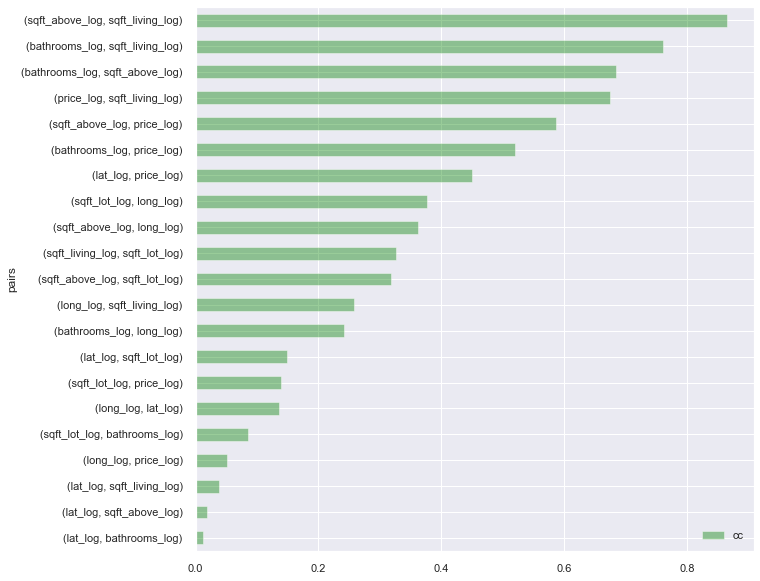

In [112]:
cc1pairs_update_df = cc1pairs_df[cc1pairs_df.cc<1]
cc1pairs_update_df.plot.barh(figsize=(10,10), color='green', alpha=0.4)

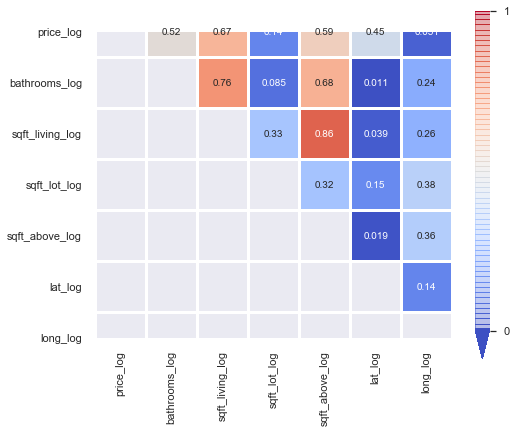

In [113]:
plt.figure(figsize=(8,8))
cbar_kws = {"orientation":"vertical", 
            "shrink":0.8,
            'extend':'min', 
            'extendfrac':0.1, 
            "ticks":np.arange(0,2), 
            "drawedges":True,
           }
sns.heatmap(kc_log_norm.corr().abs(), mask=np.tril(kc_log_norm.corr().abs()), cmap='coolwarm', center=0.5, linewidths=2, square= True, annot=True, cbar_kws=cbar_kws)
plt.show()

In [114]:
def corrfunc(x, y, **kws):
    (r, p) = pearsonr(x, y)
    ax = plt.gca()
    ax.annotate(r"$\rho$ = " + str(round(r, 2)), xy=(.1, 1.), size=15, xycoords=ax.transAxes)
    ax.annotate(f"p = {p:.3f}", xy=(.6, 1.), size=15, xycoords=ax.transAxes)

In [115]:
def corr(x, y, **kwargs):
    
    # Calculate the value
    coef = np.corrcoef(x, y)[0][1]
    # Make the label
    label = r'$\rho$ = ' + str(round(coef, 2))
    
    # Add the label to the plot
    ax = plt.gca()
    ax.annotate(label, xy = (.2, .95), size=20, xycoords = ax.transAxes)

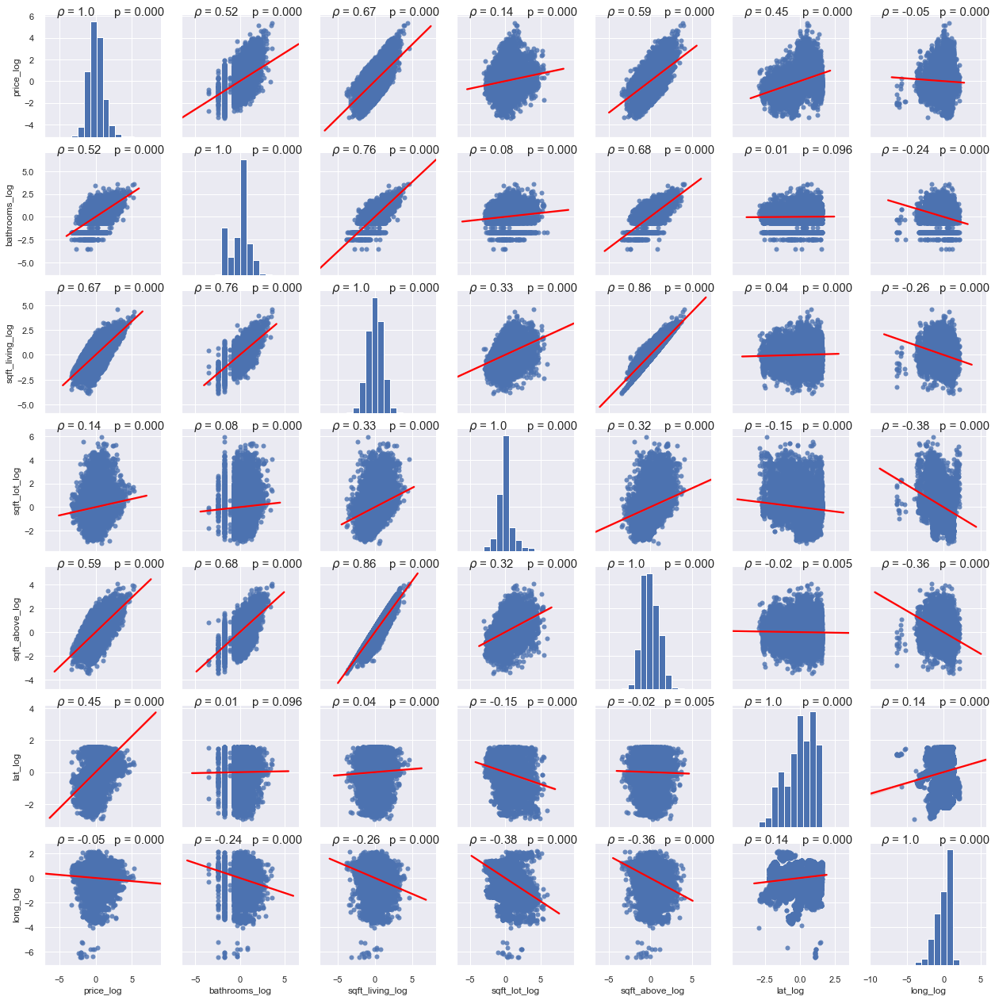

In [116]:
#cont_cols = ['price','sqft_living','sqft_lot','sqft_above','sqft_basement','sqft_living15','sqft_lot15',
#             'yr_built','zipcode']
#cont_feats = ['price','sqft_living','sqft_lot','yr_built','zipcode']
cont_feats = list(kc_log_norm.columns)
g = sns.pairplot(kc_log_norm, vars = cont_feats, kind='reg', plot_kws={'line_kws':{'color':'red'}})
g.map(corrfunc)
plt.show()

### categorical features

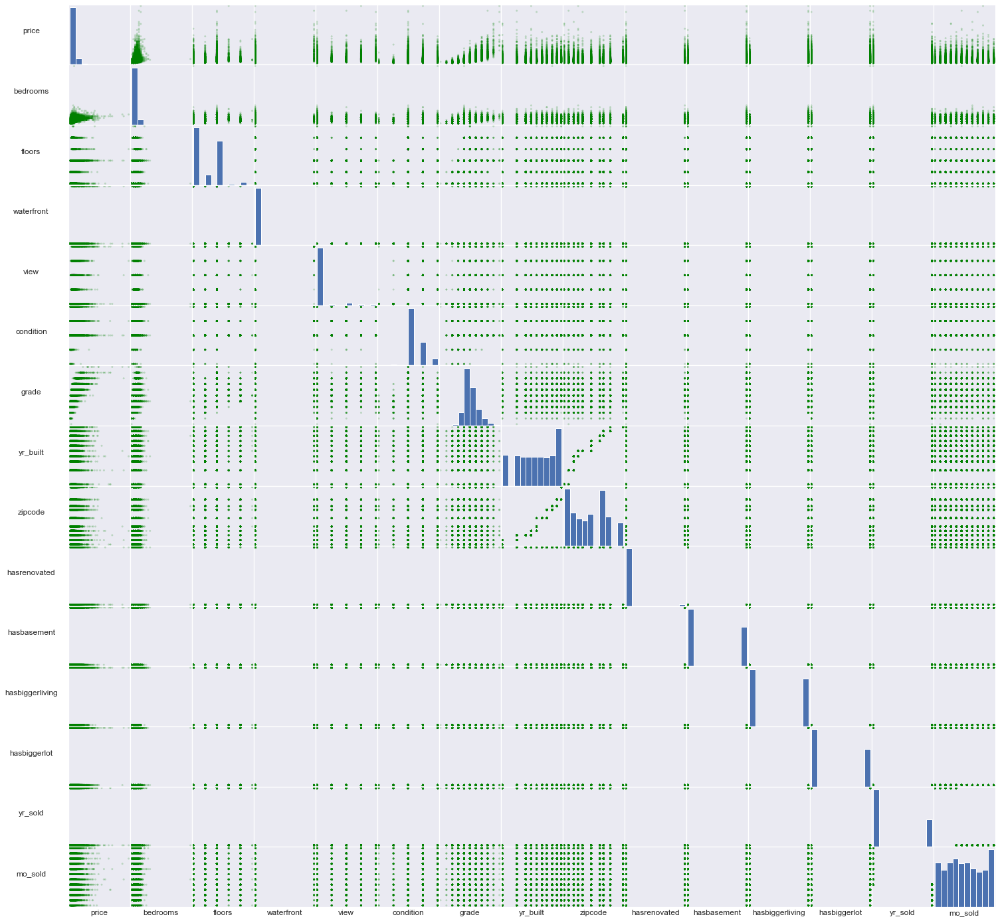

In [117]:
sm = pd.plotting.scatter_matrix(kc_categorical, color='green', alpha=0.2, figsize=[25, 25]);

# Rotates the text
[s.xaxis.label.set_rotation(0) for s in sm.reshape(-1)]
[s.yaxis.label.set_rotation(0) for s in sm.reshape(-1)]

# May need to offset label when rotating to prevent overlap of figure
[s.get_yaxis().set_label_coords(-0.6,0.5) for s in sm.reshape(-1)]

# Hide all ticks
[s.set_xticks(()) for s in sm.reshape(-1)]
[s.set_yticks(()) for s in sm.reshape(-1)]

plt.show()

In [118]:
kc_categorical.corr()

,price,bedrooms,floors,waterfront,view,condition,grade,yr_built,zipcode,hasrenovated,hasbasement,hasbiggerliving,hasbiggerlot,yr_sold,mo_sold
price,1.000000,0.308787,0.256804,0.264306,0.393497,0.036056,0.667951,0.023502,0.033353,0.117543,0.175472,0.225865,0.057116,0.003727,-0.009928
bedrooms,0.308787,1.000000,0.177944,-0.002127,0.078354,0.026496,0.356563,0.007320,0.012737,0.017635,0.158345,0.365105,0.080793,-0.009949,-0.001046
floors,0.256804,0.177944,1.000000,0.020797,0.028414,-0.264075,0.458794,0.156789,0.209645,0.003713,-0.248292,0.129568,-0.020206,-0.022352,0.014245
waterfront,0.264306,-0.002127,0.020797,1.000000,0.380543,0.016648,0.082818,-0.009644,-0.006189,0.074267,0.039933,0.022118,0.010286,-0.005018,0.008199
view,0.393497,0.078354,0.028414,0.380543,1.000000,0.045622,0.249082,-0.012128,-0.017016,0.090480,0.176662,0.062615,0.038263,0.001239,-0.005161
condition,0.036056,0.026496,-0.264075,0.016648,0.045622,1.000000,-0.146896,-0.083822,-0.110211,-0.055383,0.129050,0.056044,-0.011143,-0.045898,0.022388
grade,0.667951,0.356563,0.458794,0.082818,0.249082,-0.146896,1.000000,0.070321,0.097447,0.015259,0.049619,0.213058,0.068825,-0.030635,0.008989
yr_built,0.023502,0.007320,0.156789,-0.009644,-0.012128,-0.083822,0.070321,1.000000,0.953504,-0.019275,-0.018716,0.014874,-0.014863,0.000720,0.000100
zipcode,0.033353,0.012737,0.209645,-0.006189,-0.017016,-0.110211,0.097447,0.953504,1.000000,-0.024754,-0.025165,0.019608,-0.020293,-0.001903,0.001209
hasrenovated,0.117543,0.017635,0.003713,0.074267,0.090480,-0.055383,0.015259,-0.019275,-0.024754,1.000000,0.046963,0.057141,-0.007273,-0.019699,0.007659


In [119]:
cc2_df = kc_categorical.corr().abs().stack().reset_index().sort_values(0, ascending=True)
print(cc2_df.head())
cc2_df['pairs'] = list(zip(cc2_df.level_0, cc2_df.level_1))
cc2pairs_df = cc2_df.set_index('pairs')
cc2pairs_df = cc2pairs_df.drop(['level_1', 'level_0'], axis=1)
cc2pairs_df.columns = ['cc']
cc2pairs_df = cc2pairs_df.drop_duplicates(keep='first')
cc2pairs_df.head()

      level_0   level_1         0
217   mo_sold  yr_built  0.000100
119  yr_built   mo_sold  0.000100
118  yr_built   yr_sold  0.000720
202   yr_sold  yr_built  0.000720
211   mo_sold  bedrooms  0.001046


,cc
pairs,
"(mo_sold, yr_built)",0.000100
"(yr_built, yr_sold)",0.000720
"(mo_sold, bedrooms)",0.001046
"(mo_sold, zipcode)",0.001209
"(view, yr_sold)",0.001239


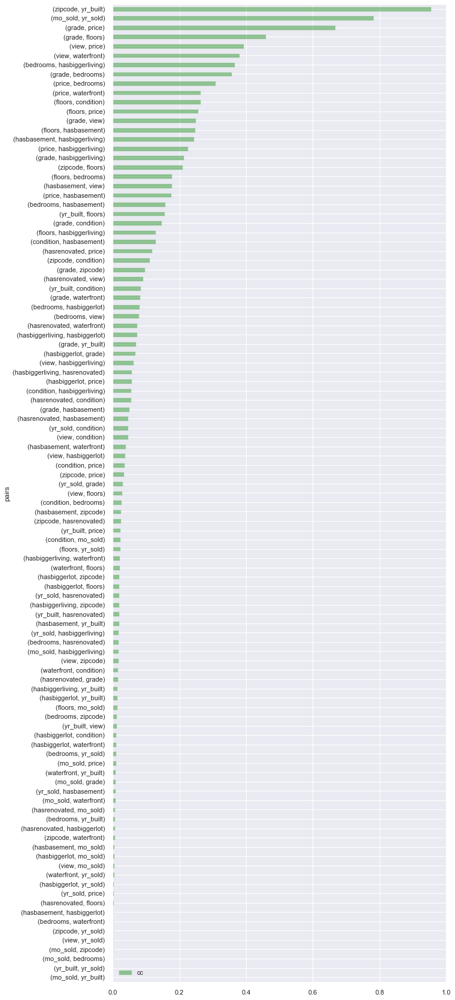

In [120]:
cc2pairs_update_df = cc2pairs_df[cc2pairs_df.cc<1]
cc2pairs_update_df.plot.barh(figsize=(10,30), color='green', alpha=0.4)

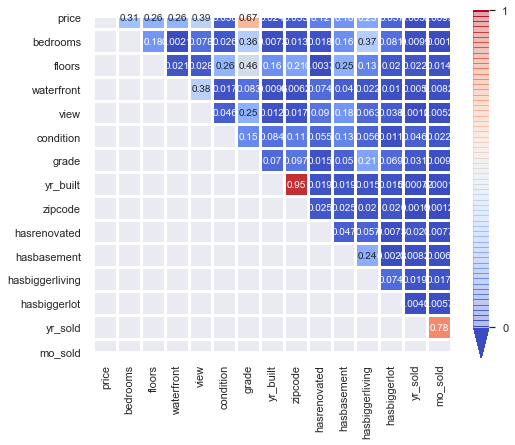

In [121]:
plt.figure(figsize=(8,8))
cbar_kws = {"orientation":"vertical", 
            "shrink":0.8,
            'extend':'min', 
            'extendfrac':0.1, 
            "ticks":np.arange(0,2), 
            "drawedges":True,
           }
sns.heatmap(kc_categorical.corr().abs(), mask=np.tril(kc_categorical.corr().abs()), cmap='coolwarm', center=0.5, linewidths=2, square= True, annot=True, cbar_kws=cbar_kws)
plt.show()

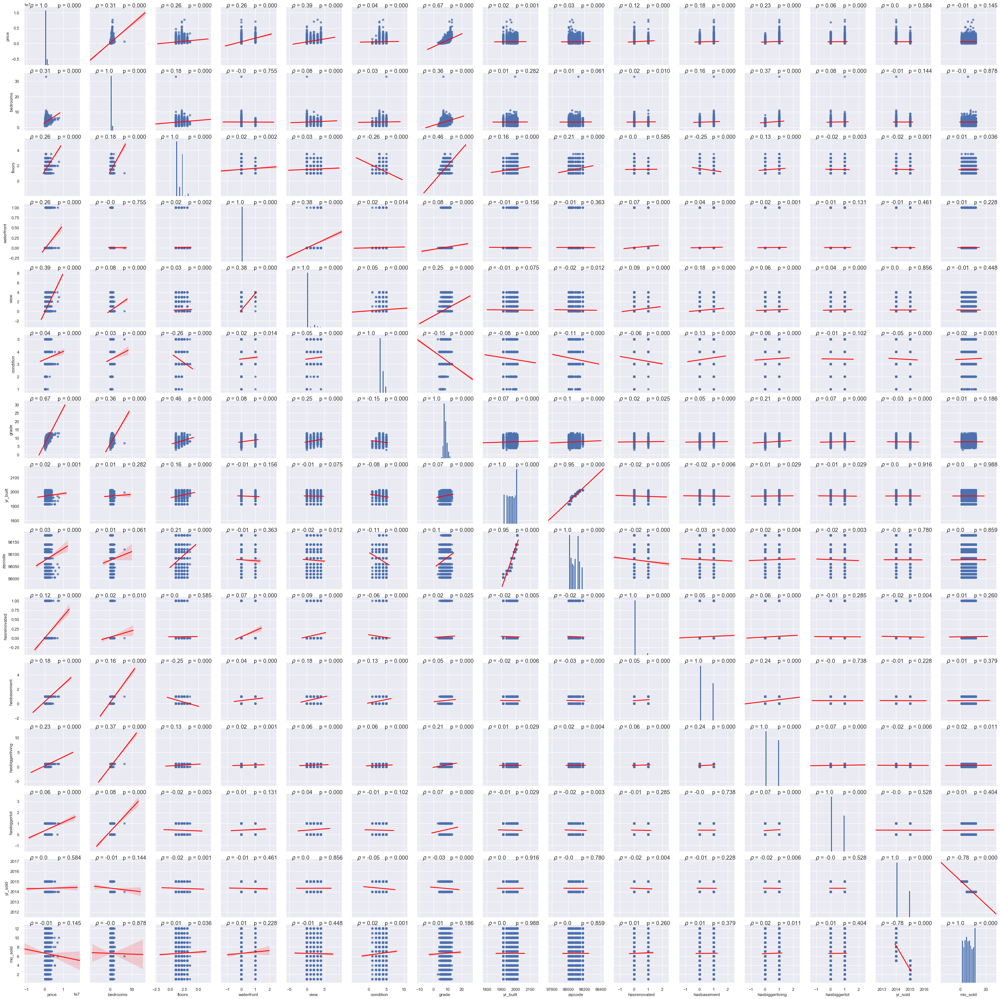

In [122]:
#cate_feats = ['price','bathrooms','view','grade']
cate_feats = list(kc_categorical.columns)
g = sns.pairplot(kc_categorical, vars = cate_feats, kind='reg', plot_kws={'line_kws':{'color':'red'}})
g.map(corrfunc)
plt.show()

## combine categorical and continuous features

In [123]:
#all_feats = categorical + continuous
#kc_all = kc10.loc[:, all_feats]
#kc_all = kc_all.loc[:,~kc_all.columns.duplicated()]
kc_preprocessed = pd.concat([kc_log_norm,kc_categorical],axis=1)
#kc_preprocessed = kc_preprocessed.drop(['price'],axis=1)
print(kc_preprocessed.shape)
kc_preprocessed.head()
#print(kc_all.shape)
#kc_all.head()

(21597, 22)


,price_log,bathrooms_log,sqft_living_log,sqft_lot_log,sqft_above_log,lat_log,long_log,price,bedrooms,floors,...,condition,grade,yr_built,zipcode,hasrenovated,hasbasement,hasbiggerliving,hasbiggerlot,yr_sold,mo_sold
0,-1.401998,-1.726509,-1.125556,-0.388430,-0.753565,-0.351359,0.306054,221900.0,3,1.0,...,3,7,1913.0,98005.0,0,0,0,0,2014,10
1,0.279938,0.339653,0.709446,-0.113241,0.672693,1.160018,0.746142,538000.0,3,2.0,...,3,7,1913.0,98005.0,1,1,1,0,2014,12
2,-1.799430,-1.726509,-2.131893,0.244475,-1.752954,1.281474,0.135637,180000.0,2,1.0,...,3,6,1913.0,98005.0,0,0,0,1,2015,2
3,0.499698,1.072635,0.070674,-0.523914,-1.026835,-0.282056,1.271117,604000.0,4,1.0,...,5,7,1913.0,98005.0,0,1,1,0,2014,12
4,0.178434,0.039555,-0.292725,0.008139,0.073515,0.410205,-1.200453,510000.0,3,1.0,...,3,8,1913.0,98005.0,0,0,0,1,2015,2


In [124]:
kc_preprocessed.corr()

,price_log,bathrooms_log,sqft_living_log,sqft_lot_log,sqft_above_log,lat_log,long_log,price,bedrooms,floors,...,condition,grade,yr_built,zipcode,hasrenovated,hasbasement,hasbiggerliving,hasbiggerlot,yr_sold,mo_sold
price_log,1.000000,0.520278,0.674802,0.138261,0.586013,0.449133,-0.050828,0.891745,0.343360,0.310630,...,0.038918,0.703720,0.035466,0.048018,0.106528,0.206368,0.252229,0.052922,0.004972,-0.013064
bathrooms_log,0.520278,1.000000,0.760764,0.084877,0.683889,0.011330,-0.241395,0.456122,0.507629,0.501036,...,-0.113356,0.644204,0.089696,0.122226,0.038066,0.163450,0.339597,0.076542,-0.027673,0.009153
sqft_living_log,0.674802,0.760764,1.000000,0.325983,0.864979,0.038881,-0.257081,0.611839,0.621820,0.367564,...,-0.049620,0.743038,0.036668,0.052768,0.047137,0.229867,0.503164,0.126463,-0.029434,0.012456
sqft_lot_log,0.138261,0.084877,0.325983,1.000000,0.318663,-0.149394,-0.376157,0.161561,0.184922,-0.237460,...,0.073694,0.184323,-0.117119,-0.154616,0.017463,-0.050971,0.087461,0.294450,-0.006687,-0.000047
sqft_above_log,0.586013,0.683889,0.864979,0.318663,1.000000,-0.019118,-0.361924,0.542675,0.516072,0.547619,...,-0.150730,0.742869,0.060434,0.084069,0.023356,-0.212167,0.348220,0.123183,-0.024607,0.011200
lat_log,0.449133,0.011330,0.038881,-0.149394,-0.019118,1.000000,0.135284,0.306954,-0.009920,0.049333,...,-0.015117,0.113687,0.002449,-0.000864,0.027949,0.132868,0.015375,-0.029465,-0.029013,0.014984
long_log,-0.050828,-0.241395,-0.257081,-0.376157,-0.361924,0.135284,1.000000,-0.021990,-0.131929,-0.125963,...,0.105908,-0.200251,-0.006248,-0.011817,0.064482,0.232707,0.020979,-0.093544,-0.000289,0.008401
price,0.891745,0.456122,0.611839,0.161561,0.542675,0.306954,-0.021990,1.000000,0.308787,0.256804,...,0.036056,0.667951,0.023502,0.033353,0.117543,0.175472,0.225865,0.057116,0.003727,-0.009928
bedrooms,0.343360,0.507629,0.621820,0.184922,0.516072,-0.009920,-0.131929,0.308787,1.000000,0.177944,...,0.026496,0.356563,0.007320,0.012737,0.017635,0.158345,0.365105,0.080793,-0.009949,-0.001046
floors,0.310630,0.501036,0.367564,-0.237460,0.547619,0.049333,-0.125963,0.256804,0.177944,1.000000,...,-0.264075,0.458794,0.156789,0.209645,0.003713,-0.248292,0.129568,-0.020206,-0.022352,0.014245


In [125]:
cc3_df = kc_preprocessed.corr().abs().stack().reset_index().sort_values(0, ascending=True)
print(cc3_df.head())
cc3_df['pairs'] = list(zip(cc3_df.level_0, cc3_df.level_1))
cc3pairs_df = cc3_df.set_index('pairs')
cc3pairs_df = cc3pairs_df.drop(['level_1', 'level_0'], axis=1)
cc3pairs_df.columns = ['cc']
cc3pairs_df = cc3pairs_df.drop_duplicates(keep='first')
cc3pairs_df.head()

          level_0       level_1         0
465       mo_sold  sqft_lot_log  0.000047
87   sqft_lot_log       mo_sold  0.000047
476       mo_sold      yr_built  0.000100
329      yr_built       mo_sold  0.000100
152      long_log       yr_sold  0.000289


,cc
pairs,
"(mo_sold, sqft_lot_log)",0.000047
"(mo_sold, yr_built)",0.000100
"(long_log, yr_sold)",0.000289
"(yr_built, yr_sold)",0.000720
"(zipcode, lat_log)",0.000864


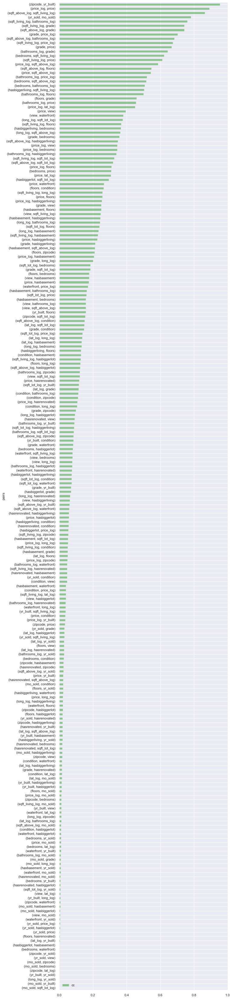

In [130]:
cc3pairs_update_df = cc3pairs_df[cc3pairs_df.cc<1]
cc3pairs_update_df.plot.barh(figsize=(10,60), color='green', alpha=0.4)

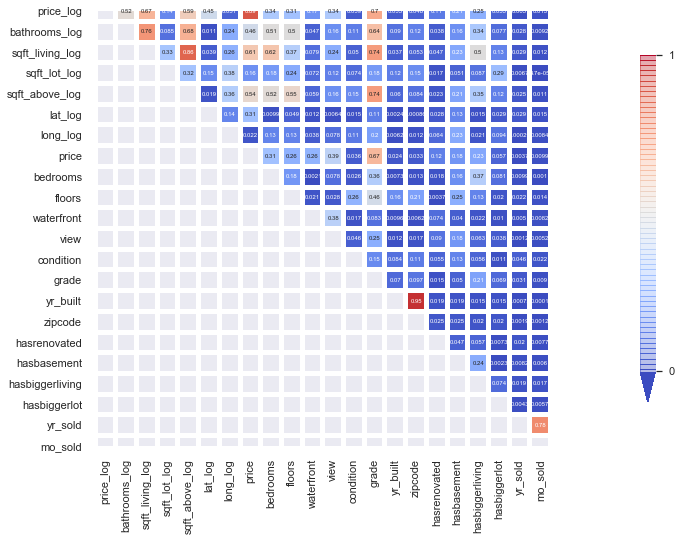

In [127]:
plt.figure(figsize=(32,8))
cbar_kws = {"orientation":"vertical", 
            "shrink":0.8,
            'extend':'min', 
            'extendfrac':0.1, 
            "ticks":np.arange(0,2), 
            "drawedges":True,
           }
sns.heatmap(kc_preprocessed.corr().abs(), mask=np.tril(kc_preprocessed.corr().abs()), cmap="coolwarm", center=0.5, linewidths=4, square= True, annot=True, annot_kws={"fontsize":6}, cbar_kws=cbar_kws)
plt.show()

## make a data decision: investigate multicollinearity

In [129]:
ccpairs_kc = cc3pairs_df[(abs(cc3pairs_df.cc) > 0.75) & (abs(cc3pairs_df.cc) < 1)]
ccpairs_kc

,cc
pairs,
"(sqft_living_log, bathrooms_log)",0.760764
"(yr_sold, mo_sold)",0.782325
"(sqft_above_log, sqft_living_log)",0.864979
"(price_log, price)",0.891745
"(zipcode, yr_built)",0.953504


In [131]:
x_cols = list(kc_preprocessed.columns)
vif = [variance_inflation_factor(kc_preprocessed.values, i) for i in range(kc_preprocessed.shape[1])]
list(zip(x_cols, vif))

[('price_log', 8.444491026697534),
 ('bathrooms_log', 3.015202955103808),
 ('sqft_living_log', 19.327409124194716),
 ('sqft_lot_log', 1.8983822400078338),
 ('sqft_above_log', 17.13841211012665),
 ('lat_log', 1.7310417555257103),
 ('long_log', 1.4318339362211436),
 ('price', 18.141372363770696),
 ('bedrooms', 25.052270194312364),
 ('floors', 20.573949981221787),
 ('waterfront', 1.2480888904171643),
 ('view', 1.5226332544012315),
 ('condition', 33.58641370238753),
 ('grade', 154.25426305080381),
 ('yr_built', 30244.923223480408),
 ('zipcode', 22641035.18229185),
 ('hasrenovated', 1.080289379108894),
 ('hasbasement', 6.450485126203179),
 ('hasbiggerliving', 2.848093125399771),
 ('hasbiggerlot', 1.8371376278230136),
 ('yr_sold', 21123740.13875589),
 ('mo_sold', 9.26683244578706)]

remove the chosen variables from kc_preprocessed. 

* sqft_living_log: equivalent to **sqft_above_log + hasbasement**

* price: redundant 

In [132]:
kc_preprocessed_v2 = kc_preprocessed.drop(['sqft_living_log','price'],axis=1)
kc_preprocessed_v2.head()

,price_log,bathrooms_log,sqft_lot_log,sqft_above_log,lat_log,long_log,bedrooms,floors,waterfront,view,condition,grade,yr_built,zipcode,hasrenovated,hasbasement,hasbiggerliving,hasbiggerlot,yr_sold,mo_sold
0,-1.401998,-1.726509,-0.388430,-0.753565,-0.351359,0.306054,3,1.0,0,0,3,7,1913.0,98005.0,0,0,0,0,2014,10
1,0.279938,0.339653,-0.113241,0.672693,1.160018,0.746142,3,2.0,0,0,3,7,1913.0,98005.0,1,1,1,0,2014,12
2,-1.799430,-1.726509,0.244475,-1.752954,1.281474,0.135637,2,1.0,0,0,3,6,1913.0,98005.0,0,0,0,1,2015,2
3,0.499698,1.072635,-0.523914,-1.026835,-0.282056,1.271117,4,1.0,0,0,5,7,1913.0,98005.0,0,1,1,0,2014,12
4,0.178434,0.039555,0.008139,0.073515,0.410205,-1.200453,3,1.0,0,0,3,8,1913.0,98005.0,0,0,0,1,2015,2


In [133]:
cc4_df = kc_preprocessed_v2.corr().abs().stack().reset_index().sort_values(0, ascending=True)
print(cc3_df.head())
cc4_df['pairs'] = list(zip(cc4_df.level_0, cc4_df.level_1))
cc4pairs_df = cc4_df.set_index('pairs')
cc4pairs_df = cc4pairs_df.drop(['level_1', 'level_0'], axis=1)
cc4pairs_df.columns = ['cc']
cc4pairs_df = cc4pairs_df.drop_duplicates(keep='first')
cc4pairs_df.head()

          level_0       level_1         0                    pairs
465       mo_sold  sqft_lot_log  0.000047  (mo_sold, sqft_lot_log)
87   sqft_lot_log       mo_sold  0.000047  (sqft_lot_log, mo_sold)
476       mo_sold      yr_built  0.000100      (mo_sold, yr_built)
329      yr_built       mo_sold  0.000100      (yr_built, mo_sold)
152      long_log       yr_sold  0.000289      (long_log, yr_sold)


,cc
pairs,
"(sqft_lot_log, mo_sold)",0.000047
"(mo_sold, yr_built)",0.000100
"(yr_sold, long_log)",0.000289
"(yr_sold, yr_built)",0.000720
"(zipcode, lat_log)",0.000864


In [134]:
x_cols = list(kc_preprocessed_v2.columns)
vif = [variance_inflation_factor(kc_preprocessed_v2.values, i) for i in range(kc_preprocessed_v2.shape[1])]
list(zip(x_cols, vif))

[('price_log', 3.9231179371090823),
 ('bathrooms_log', 2.811115006653638),
 ('sqft_lot_log', 1.8768588769273207),
 ('sqft_above_log', 6.077814609183599),
 ('lat_log', 1.674764750943814),
 ('long_log', 1.421609404344289),
 ('bedrooms', 23.757561126405413),
 ('floors', 19.653330741961287),
 ('waterfront', 1.2001135857444218),
 ('view', 1.5069075593103496),
 ('condition', 33.50791980803497),
 ('grade', 150.15083949974826),
 ('yr_built', 30242.54962545708),
 ('zipcode', 22640441.89168557),
 ('hasrenovated', 1.0789581781061846),
 ('hasbasement', 3.290307061332406),
 ('hasbiggerliving', 2.581417972170756),
 ('hasbiggerlot', 1.836421735868869),
 ('yr_sold', 21123019.264149647),
 ('mo_sold', 9.266375748770244)]

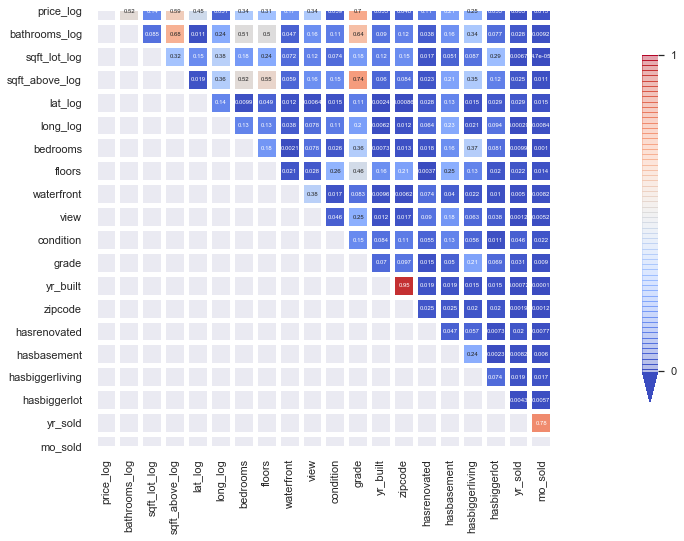

In [135]:
plt.figure(figsize=(32,8))
cbar_kws = {"orientation":"vertical", 
            "shrink":0.8,
            'extend':'min', 
            'extendfrac':0.1, 
            "ticks":np.arange(0,2), 
            "drawedges":True,
           }
sns.heatmap(kc_preprocessed_v2.corr().abs(), mask=np.tril(kc_preprocessed_v2.corr().abs()), cmap="coolwarm", center=0.5, linewidths=4, square= True, annot=True, annot_kws={"fontsize":6}, cbar_kws=cbar_kws)
plt.show()

# modeling data: build baseline model
## simple linear regression

Note: uncomment lines below to process one-to-one simple linear regression fit

King Housing DataSet - Regression Analysis and Diagnostics for price_log~price_log
-------------------------------------------------------------------------------------


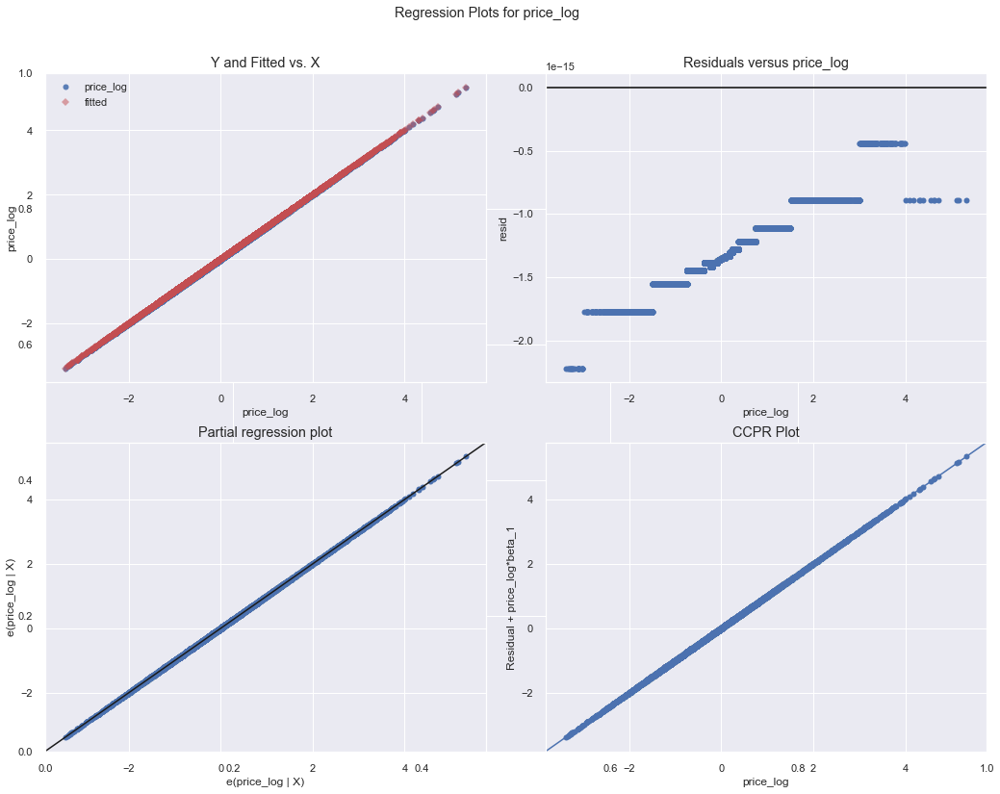

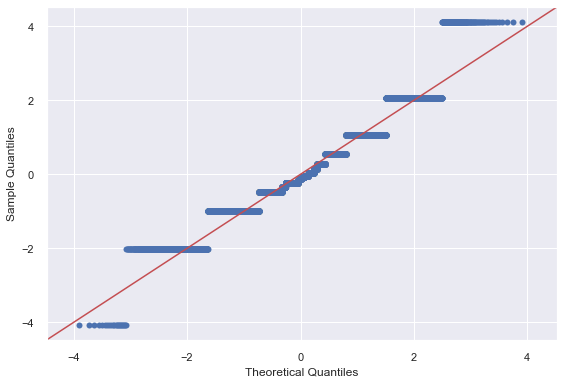

price_log: R2 1.000 , intercept 0.000 , slope 1.000 , p-value 0.000 , JB 2485.319
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~bathrooms_log
-------------------------------------------------------------------------------------


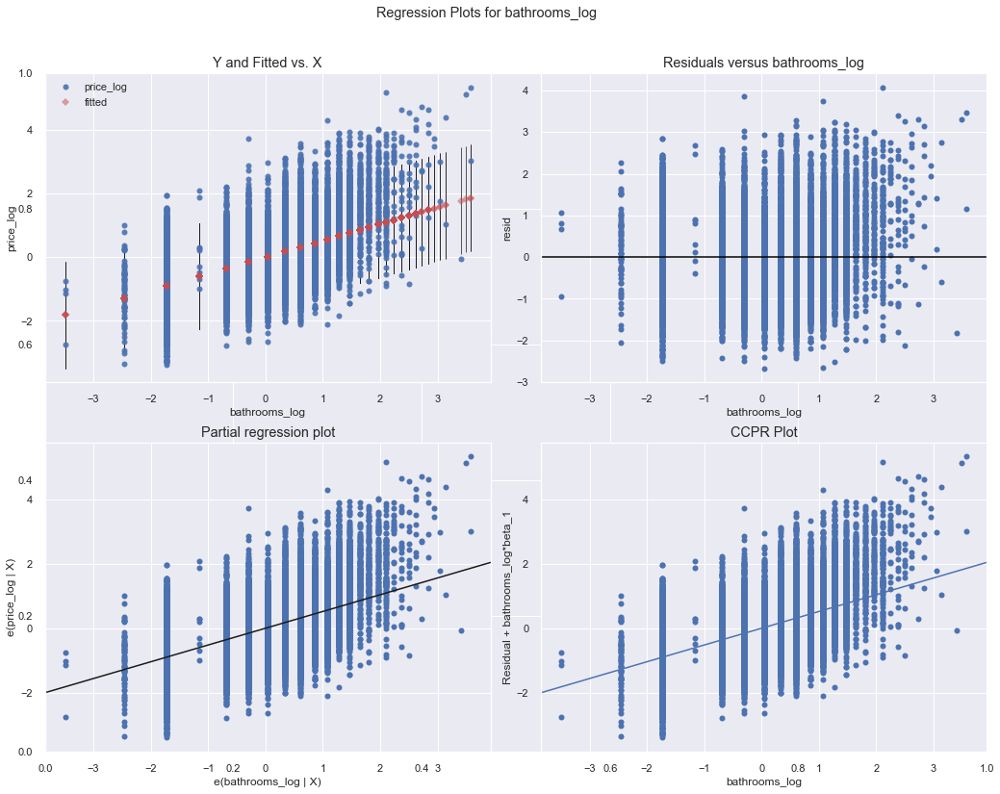

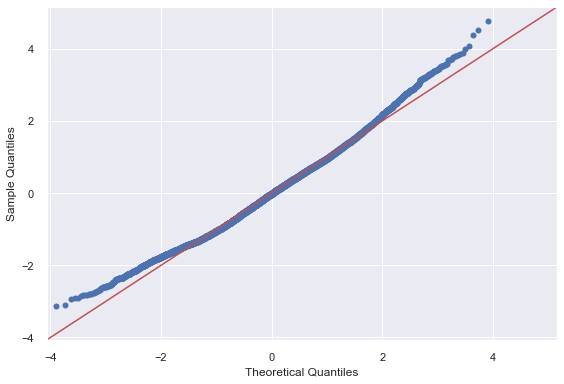

bathrooms_log: R2 0.271 , intercept 0.000 , slope 0.520 , p-value 0.000 , JB 344.181
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~sqft_lot_log
-------------------------------------------------------------------------------------


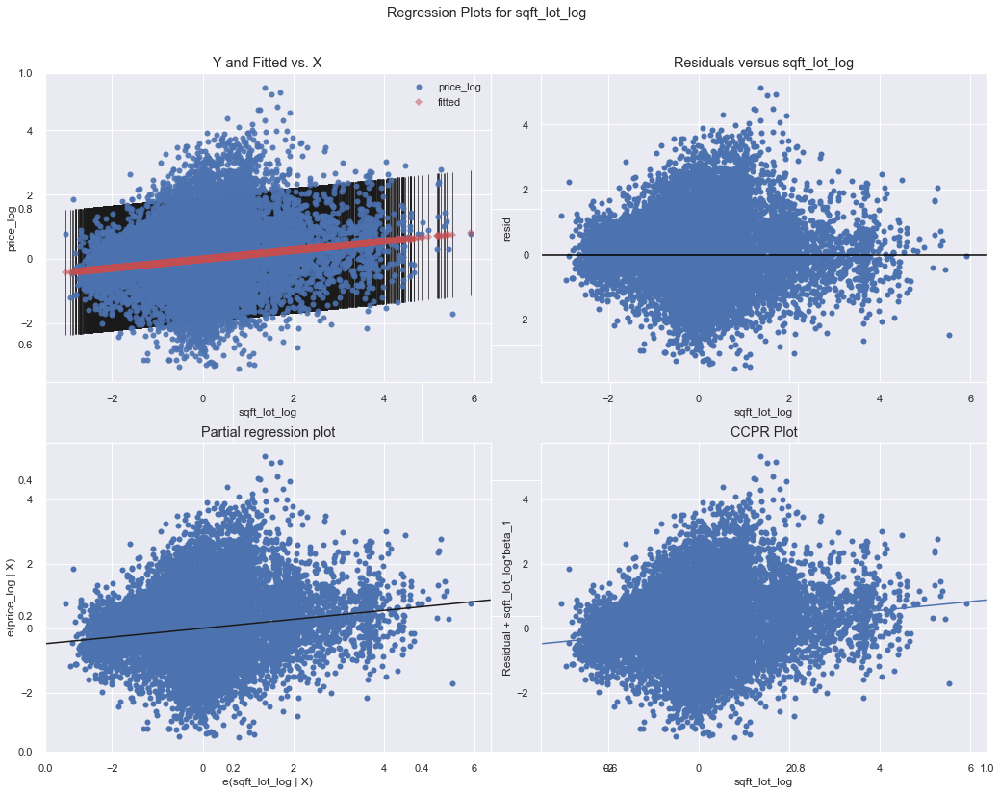

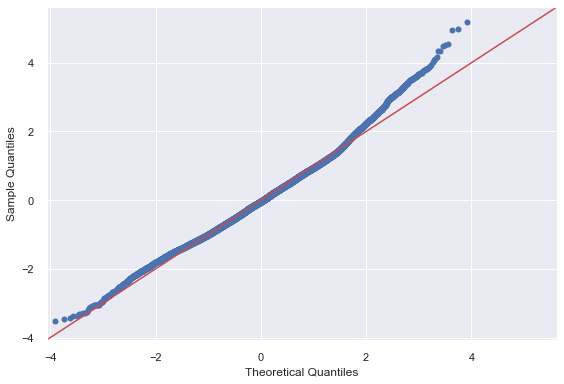

sqft_lot_log: R2 0.019 , intercept 0.000 , slope 0.138 , p-value 0.000 , JB 761.236
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~sqft_above_log
-------------------------------------------------------------------------------------


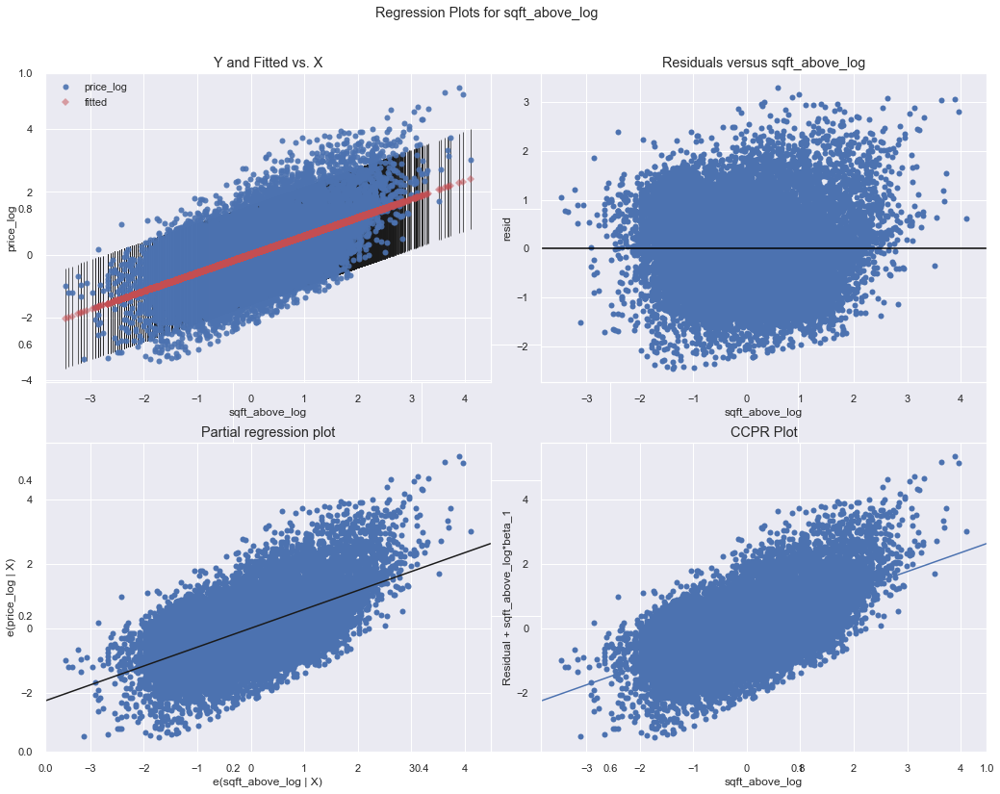

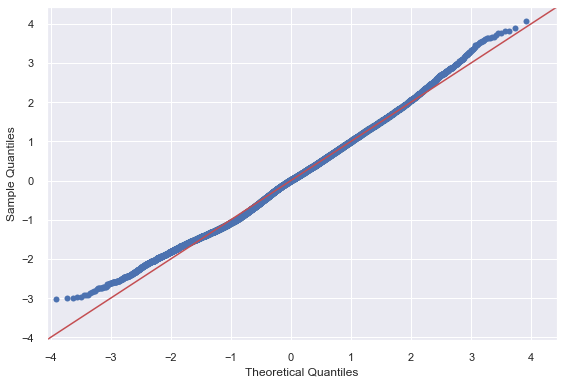

sqft_above_log: R2 0.343 , intercept 0.000 , slope 0.586 , p-value 0.000 , JB 139.438
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~lat_log
-------------------------------------------------------------------------------------


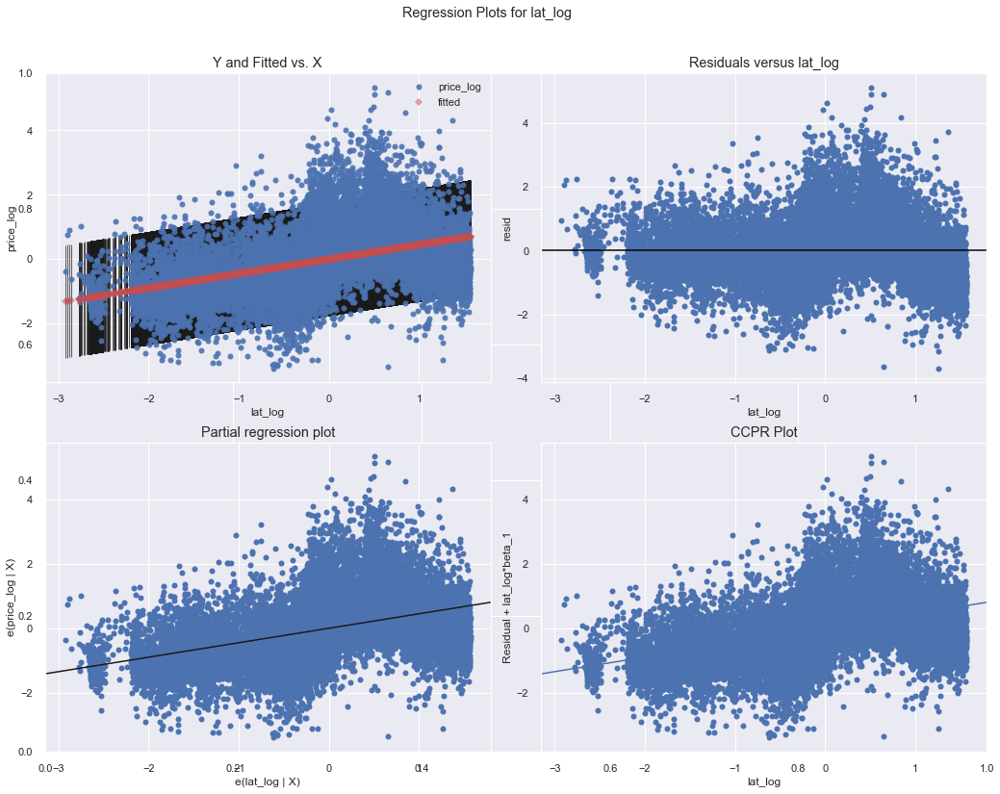

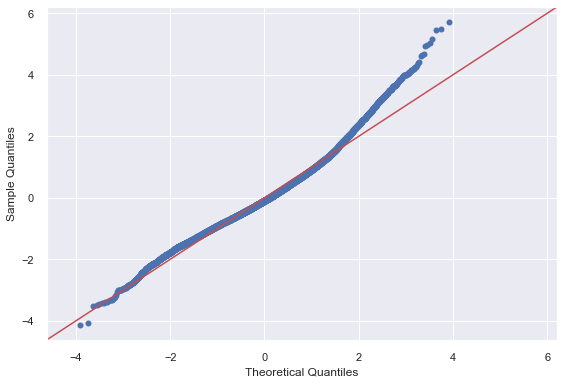

lat_log: R2 0.202 , intercept 0.000 , slope 0.449 , p-value 0.000 , JB 2761.665
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~long_log
-------------------------------------------------------------------------------------


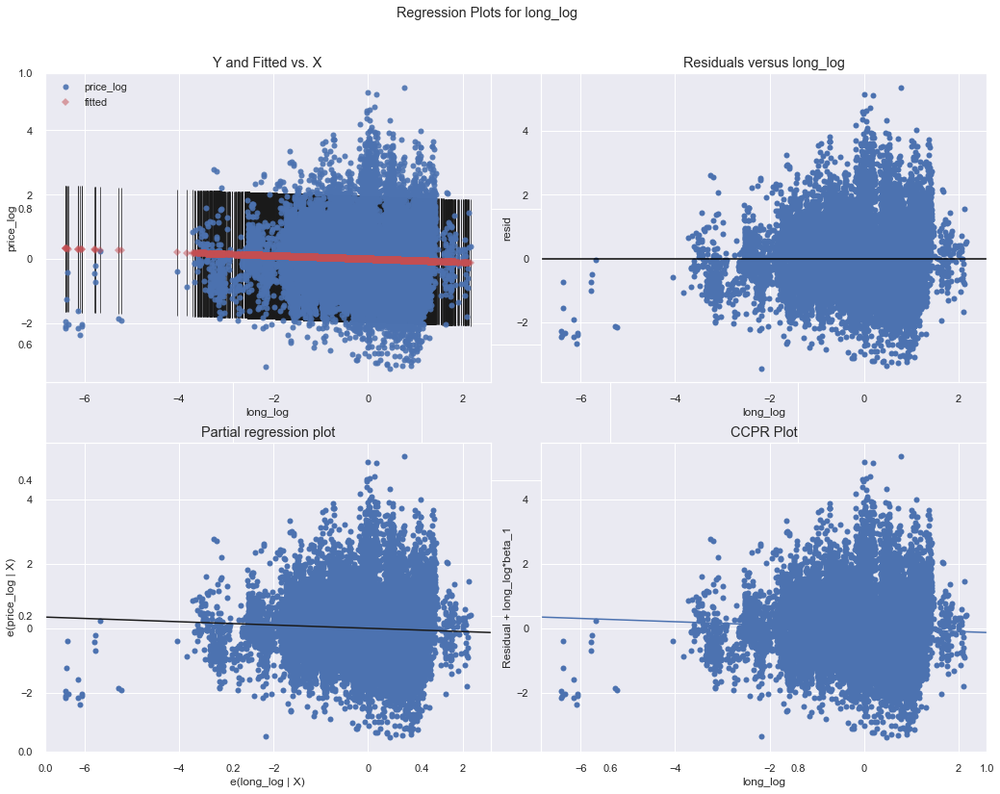

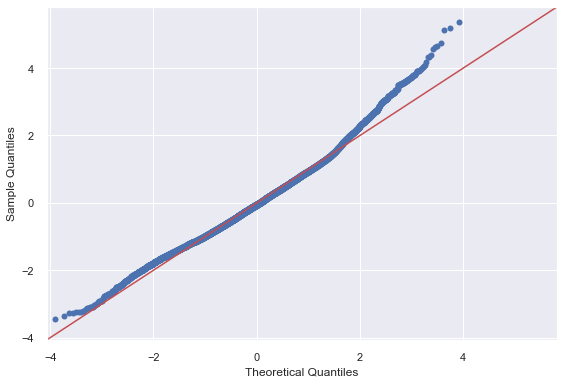

long_log: R2 0.003 , intercept 0.000 , slope -0.051 , p-value 0.000 , JB 1163.734
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~bedrooms
-------------------------------------------------------------------------------------


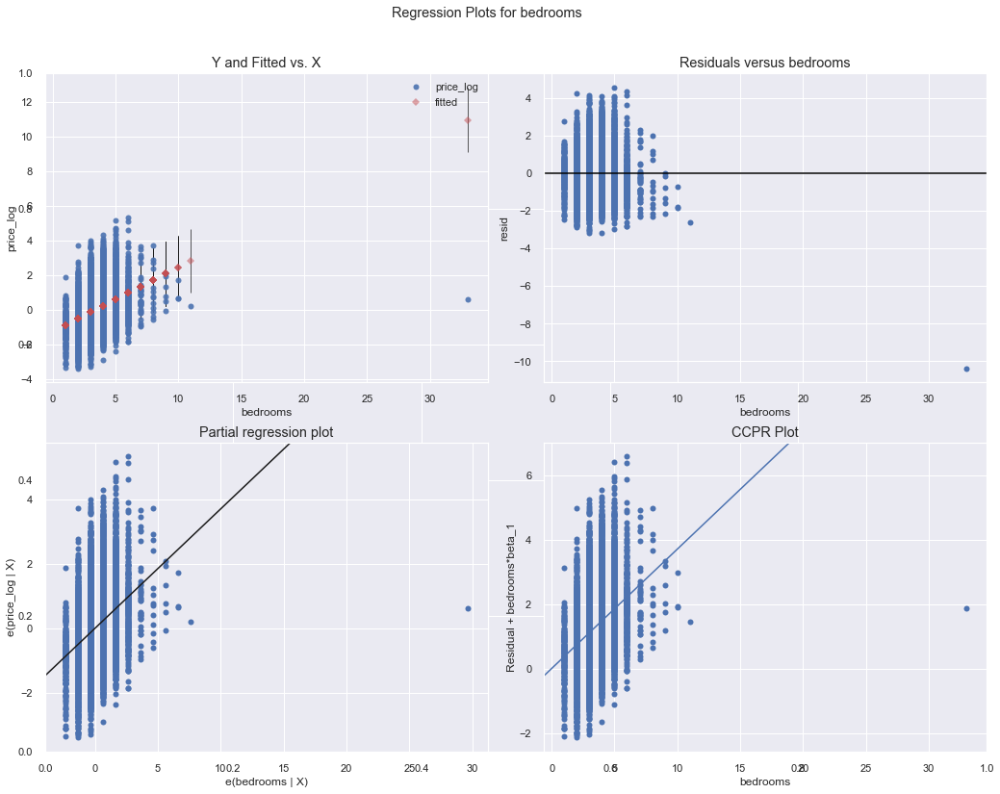

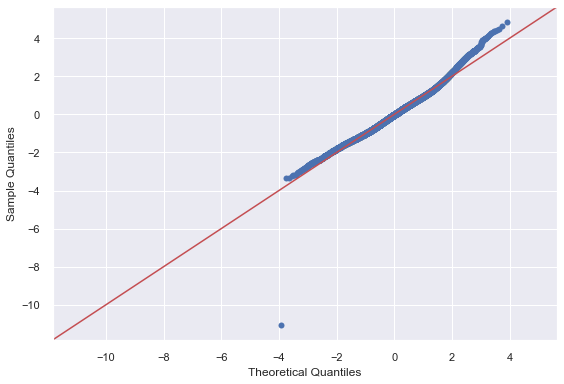

bedrooms: R2 0.118 , intercept -1.250 , slope 0.371 , p-value 0.000 , JB 1471.526
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~floors
-------------------------------------------------------------------------------------


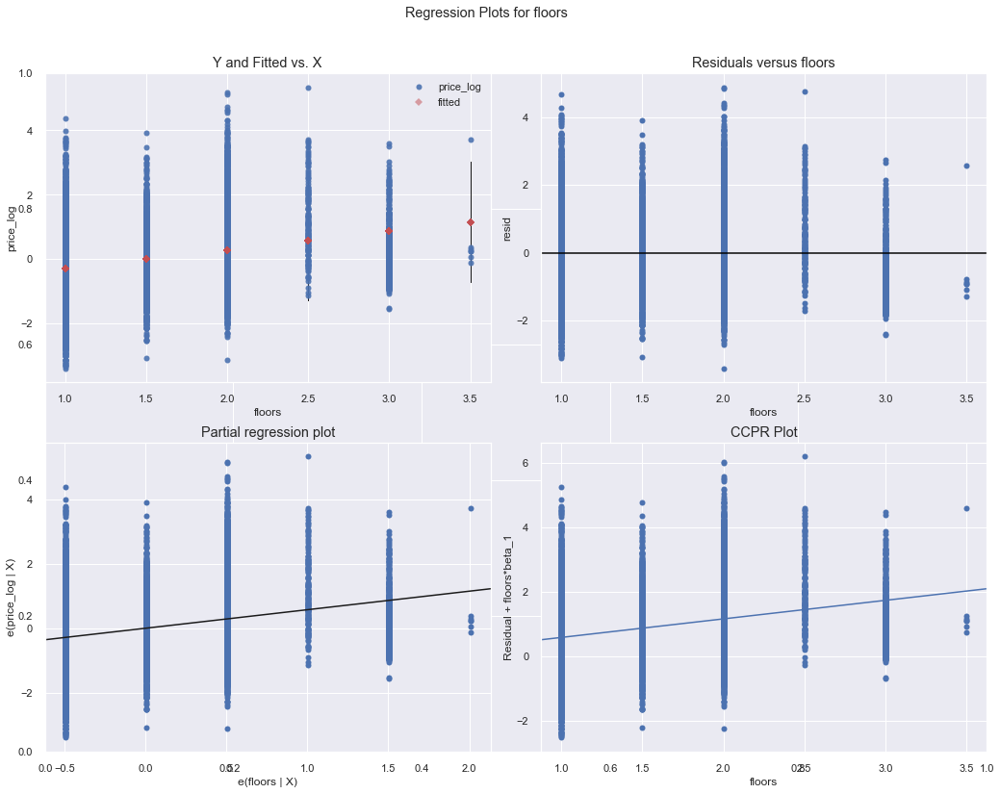

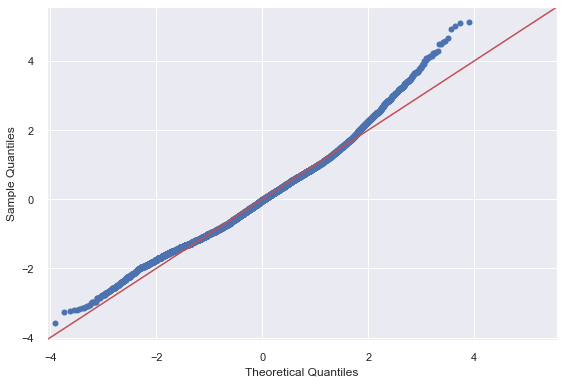

floors: R2 0.096 , intercept -0.860 , slope 0.576 , p-value 0.000 , JB 1031.279
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~waterfront
-------------------------------------------------------------------------------------


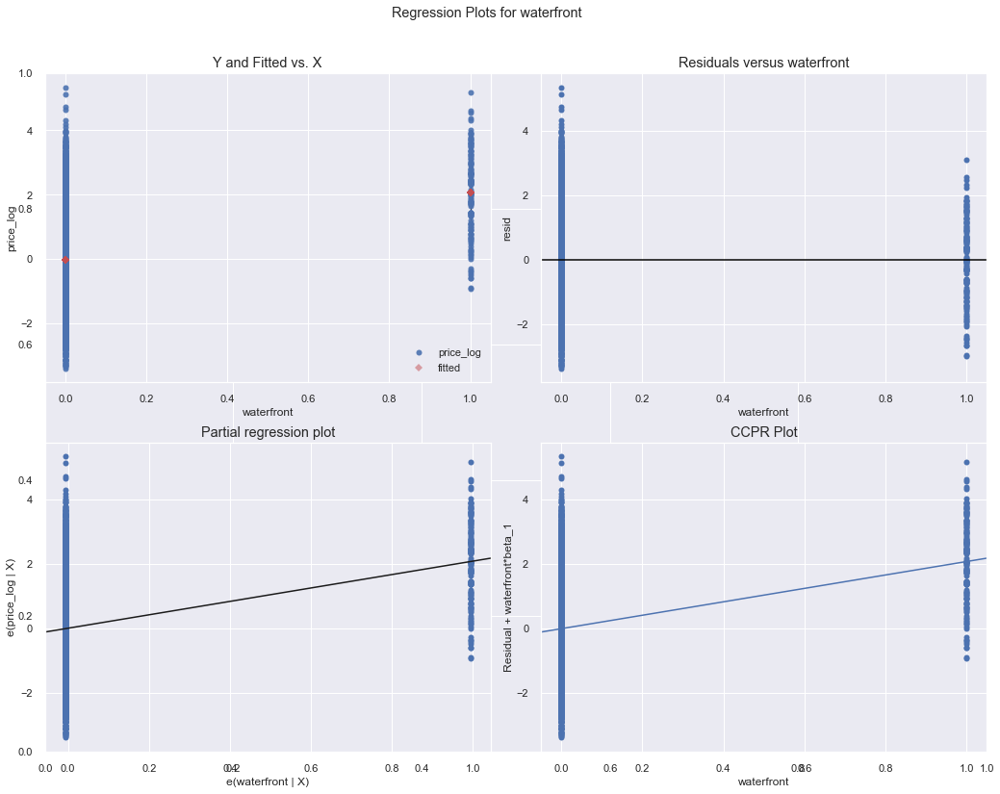

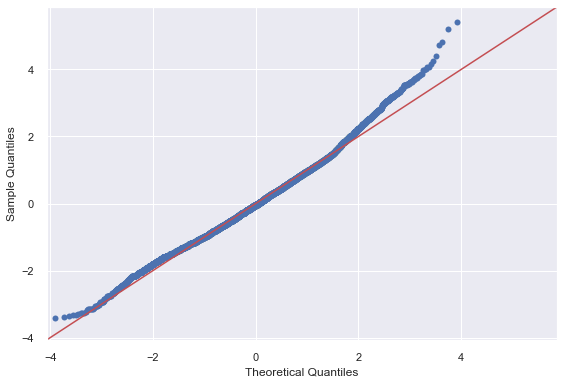

waterfront: R2 0.029 , intercept -0.014 , slope 2.083 , p-value 0.000 , JB 701.596
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~view
-------------------------------------------------------------------------------------


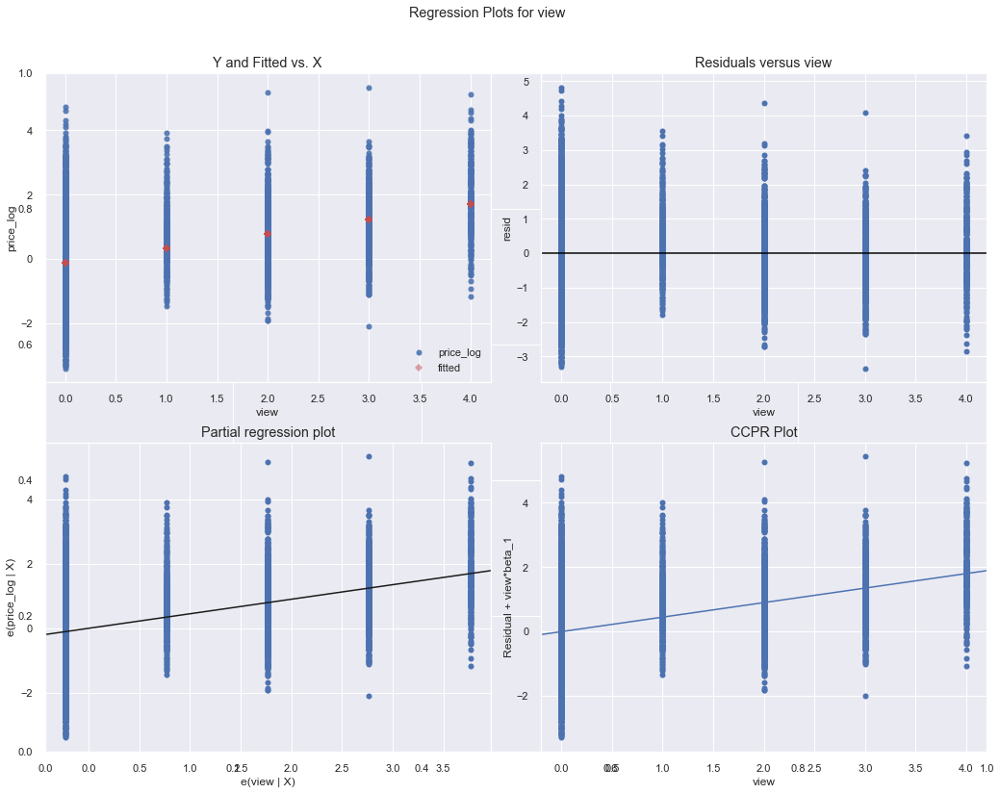

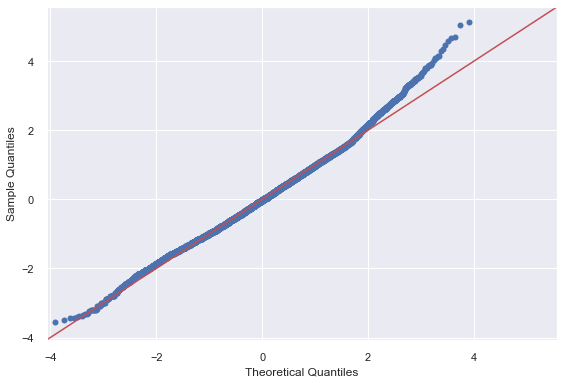

view: R2 0.119 , intercept -0.105 , slope 0.451 , p-value 0.000 , JB 436.570
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~condition
-------------------------------------------------------------------------------------


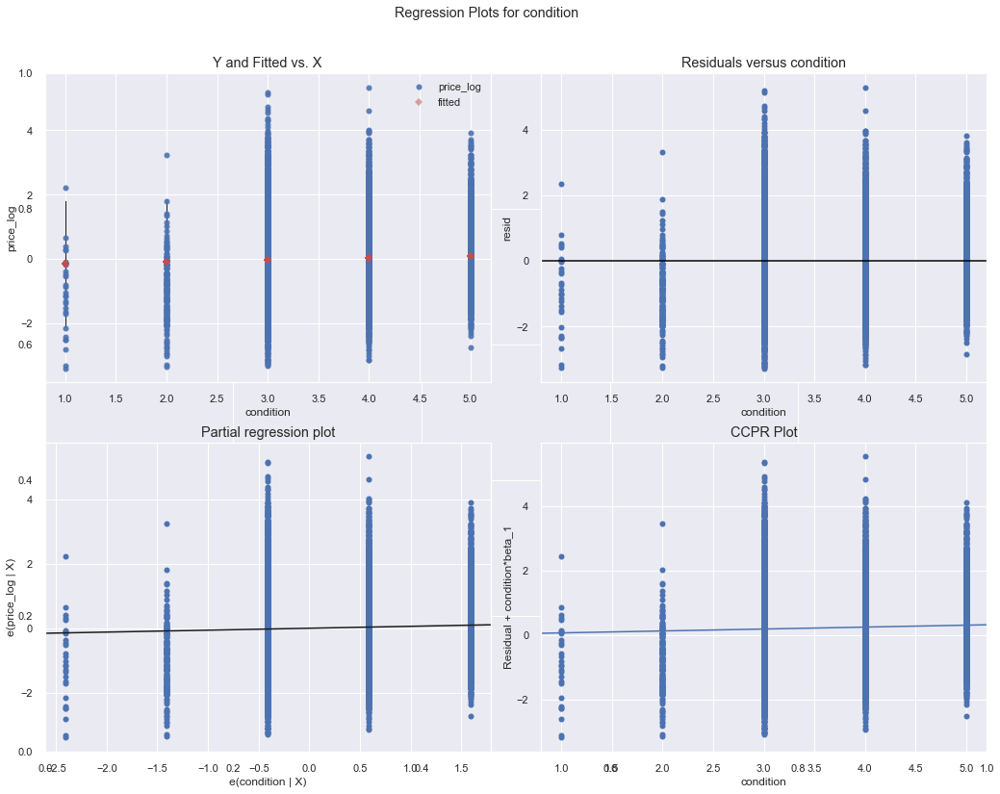

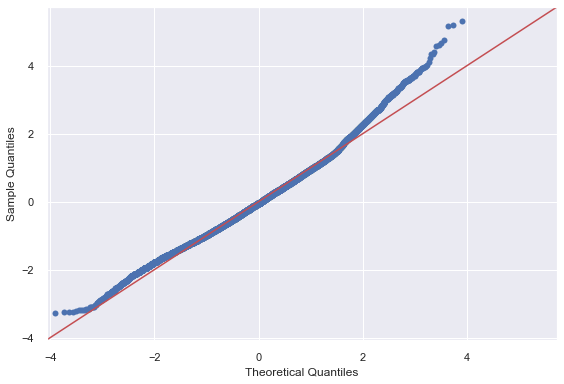

condition: R2 0.002 , intercept -0.204 , slope 0.060 , p-value 0.000 , JB 1086.243
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~grade
-------------------------------------------------------------------------------------


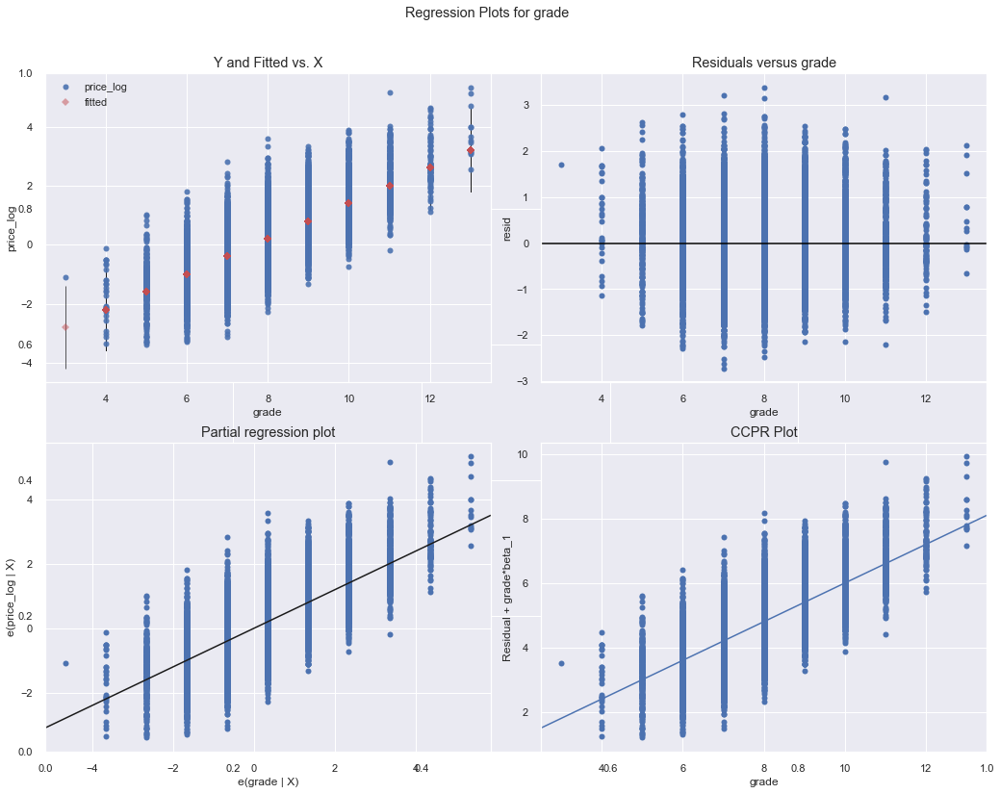

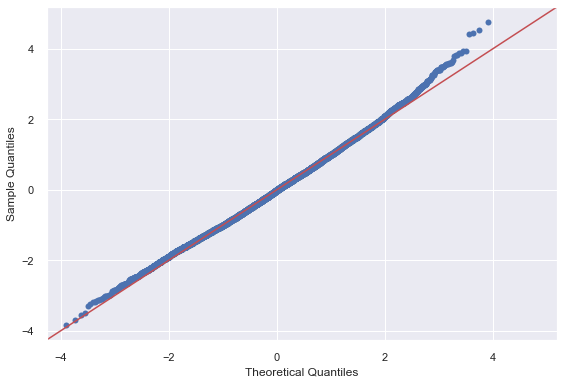

grade: R2 0.495 , intercept -4.593 , slope 0.600 , p-value 0.000 , JB 133.708
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~yr_built
-------------------------------------------------------------------------------------


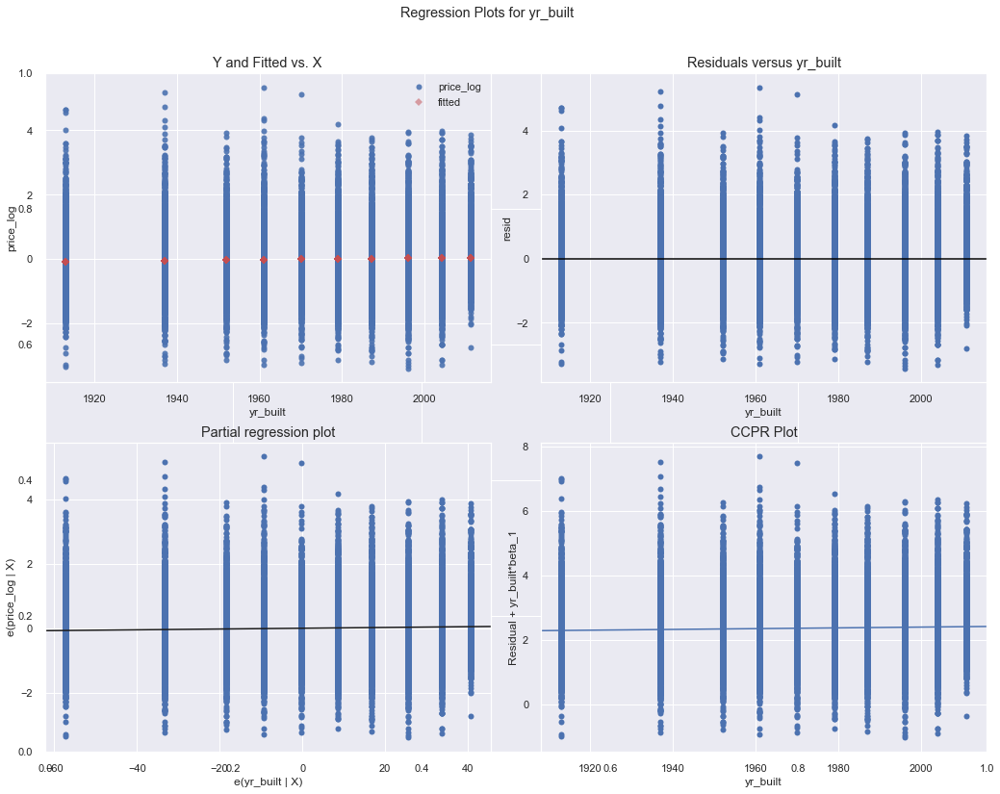

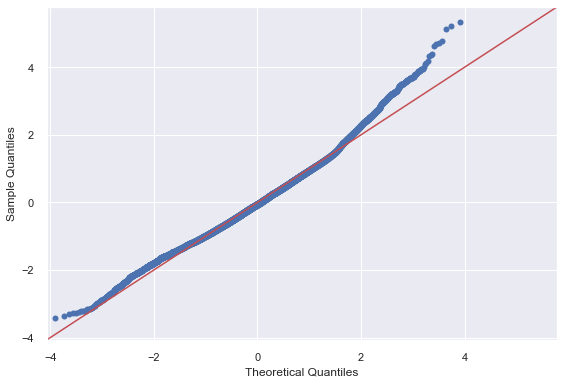

yr_built: R2 0.001 , intercept -2.366 , slope 0.001 , p-value 0.000 , JB 1110.506
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~zipcode
-------------------------------------------------------------------------------------


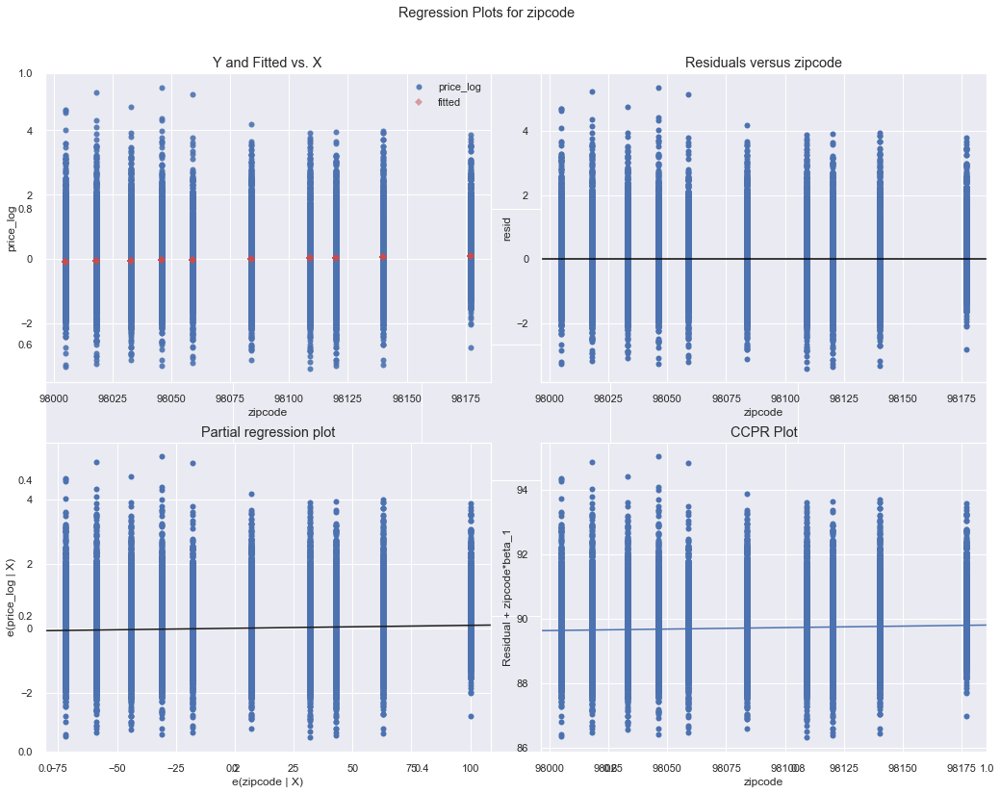

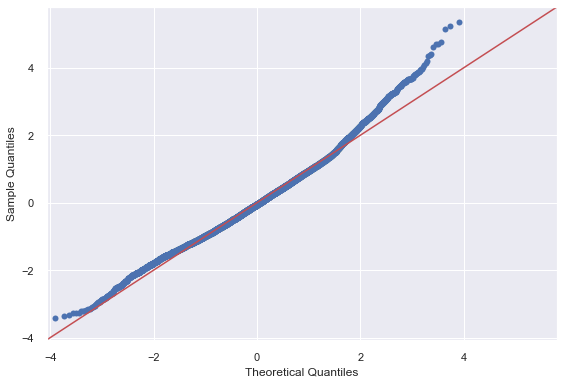

zipcode: R2 0.002 , intercept -89.700 , slope 0.001 , p-value 0.000 , JB 1115.766
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~hasrenovated
-------------------------------------------------------------------------------------


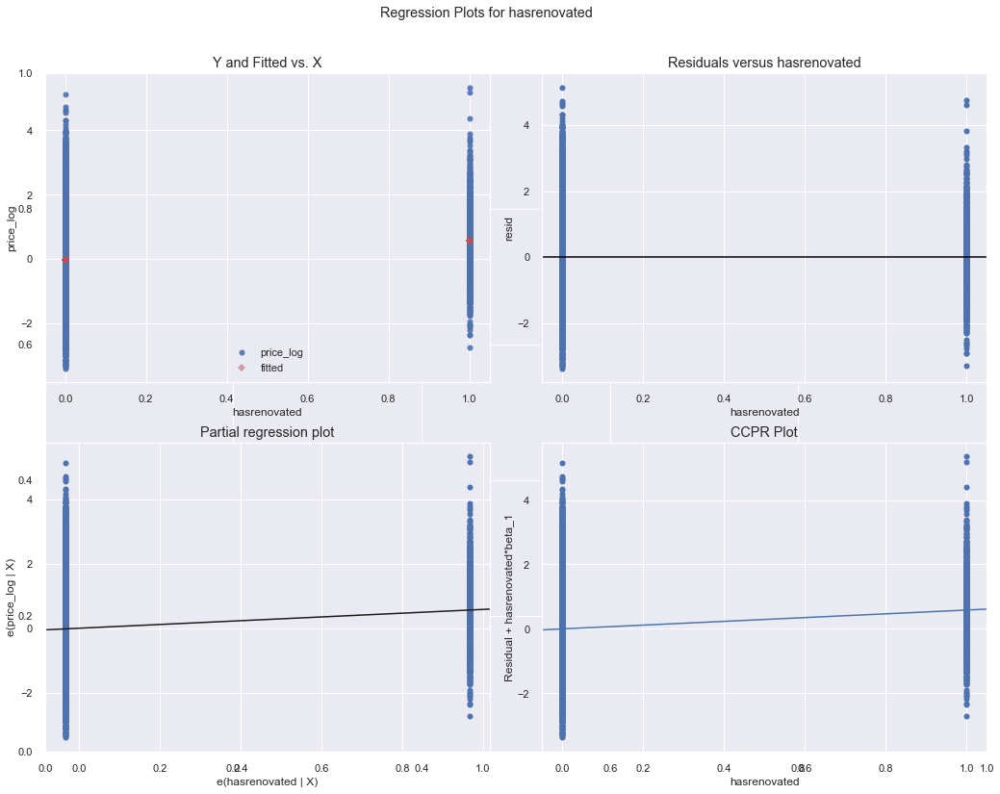

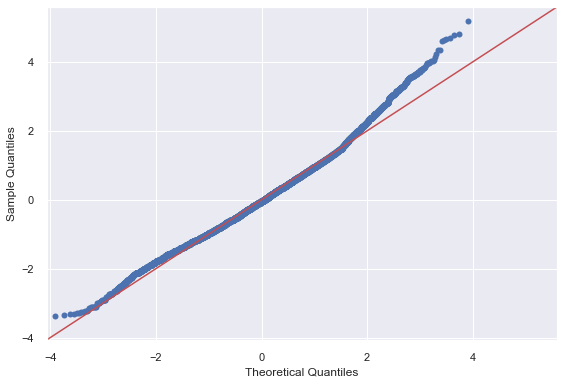

hasrenovated: R2 0.011 , intercept -0.020 , slope 0.584 , p-value 0.000 , JB 1000.113
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~hasbasement
-------------------------------------------------------------------------------------


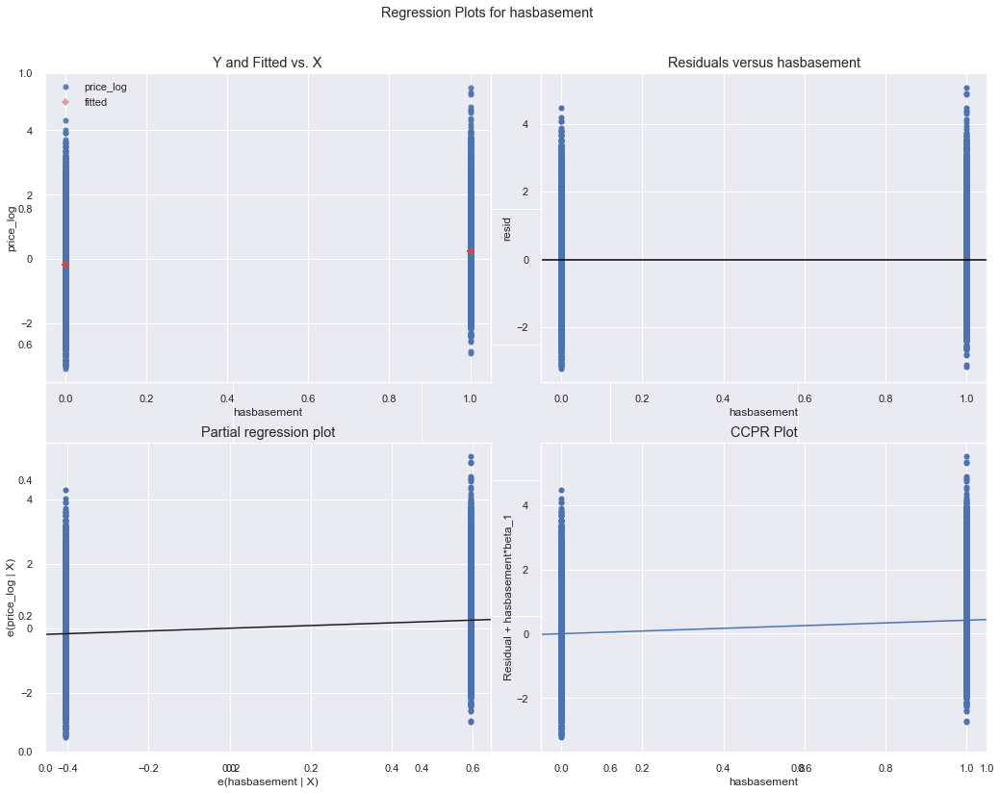

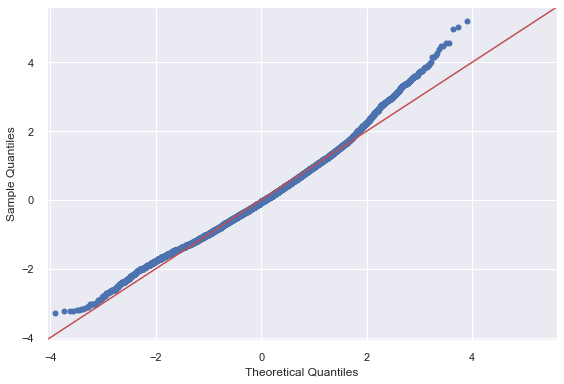

hasbasement: R2 0.043 , intercept -0.171 , slope 0.420 , p-value 0.000 , JB 1029.302
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~hasbiggerliving
-------------------------------------------------------------------------------------


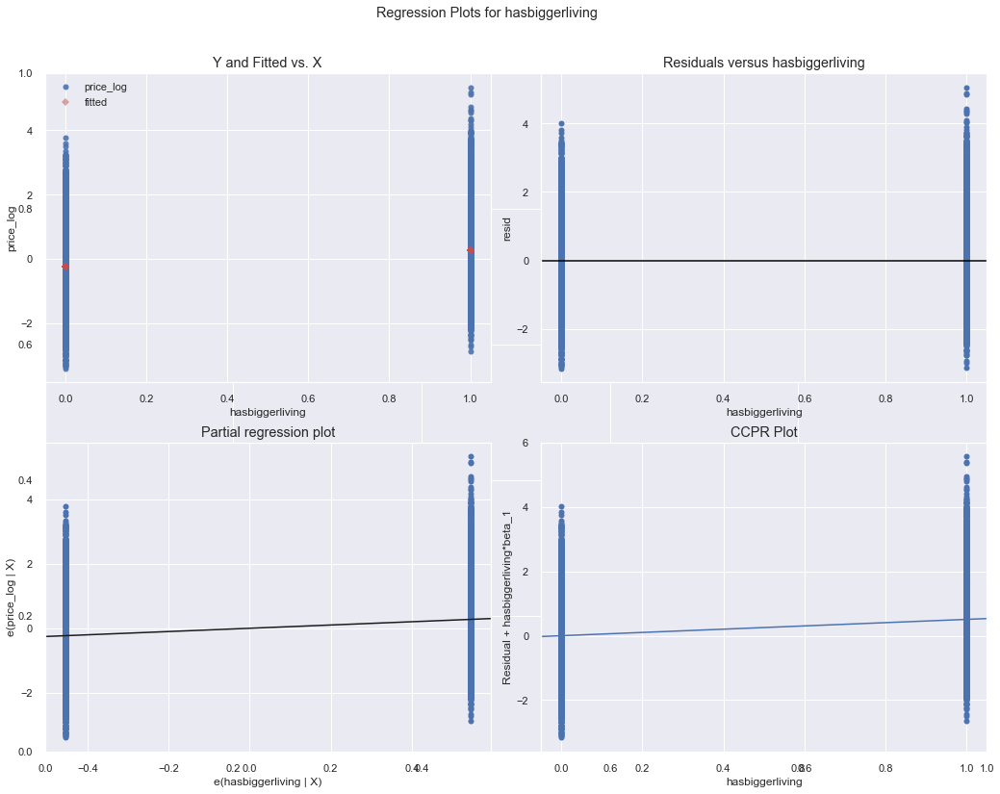

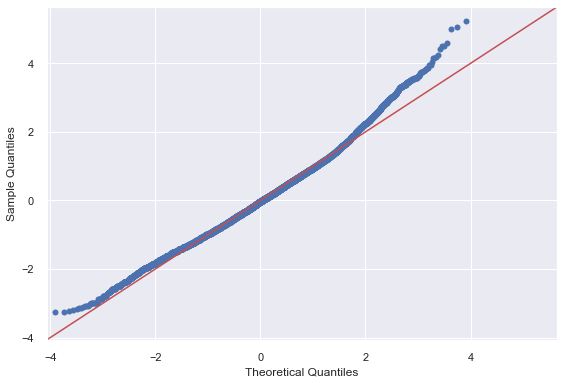

hasbiggerliving: R2 0.064 , intercept -0.231 , slope 0.506 , p-value 0.000 , JB 824.719
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~hasbiggerlot
-------------------------------------------------------------------------------------


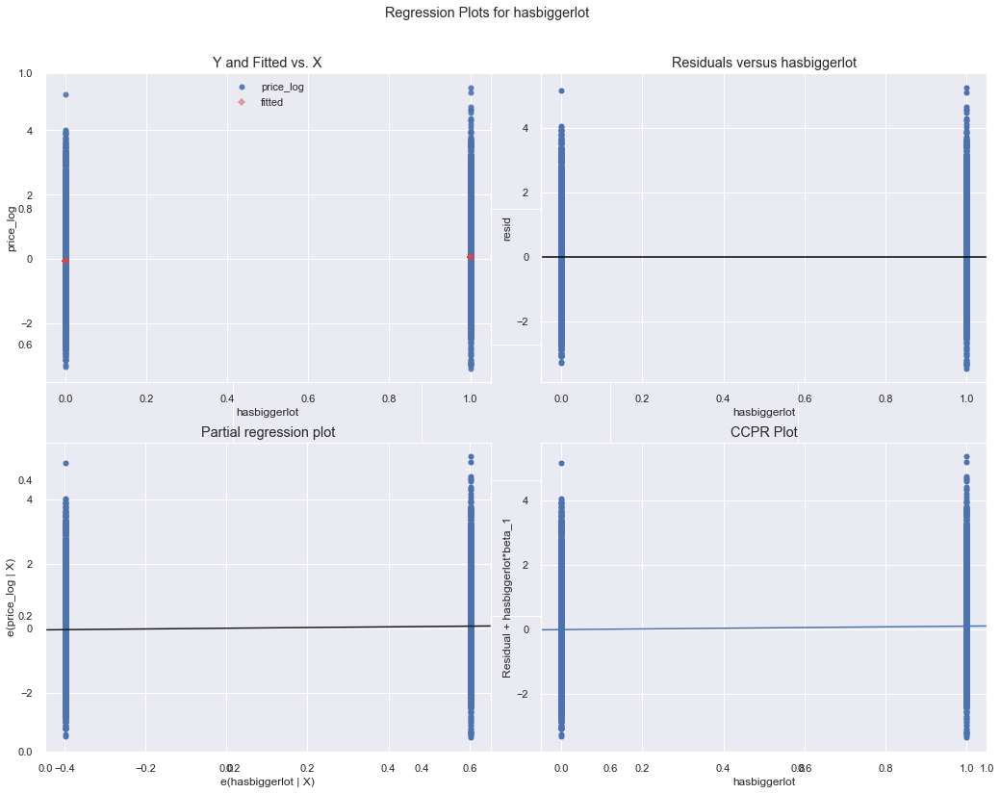

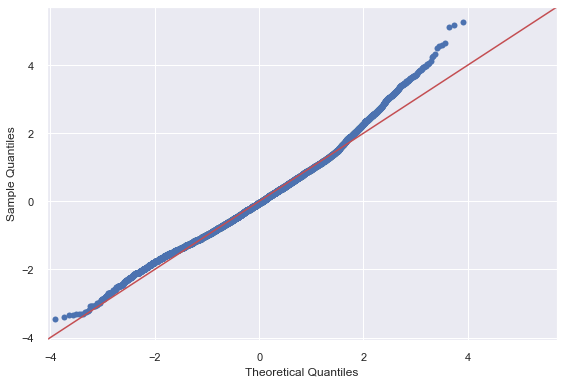

hasbiggerlot: R2 0.003 , intercept -0.043 , slope 0.108 , p-value 0.000 , JB 1053.966
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~yr_sold
-------------------------------------------------------------------------------------


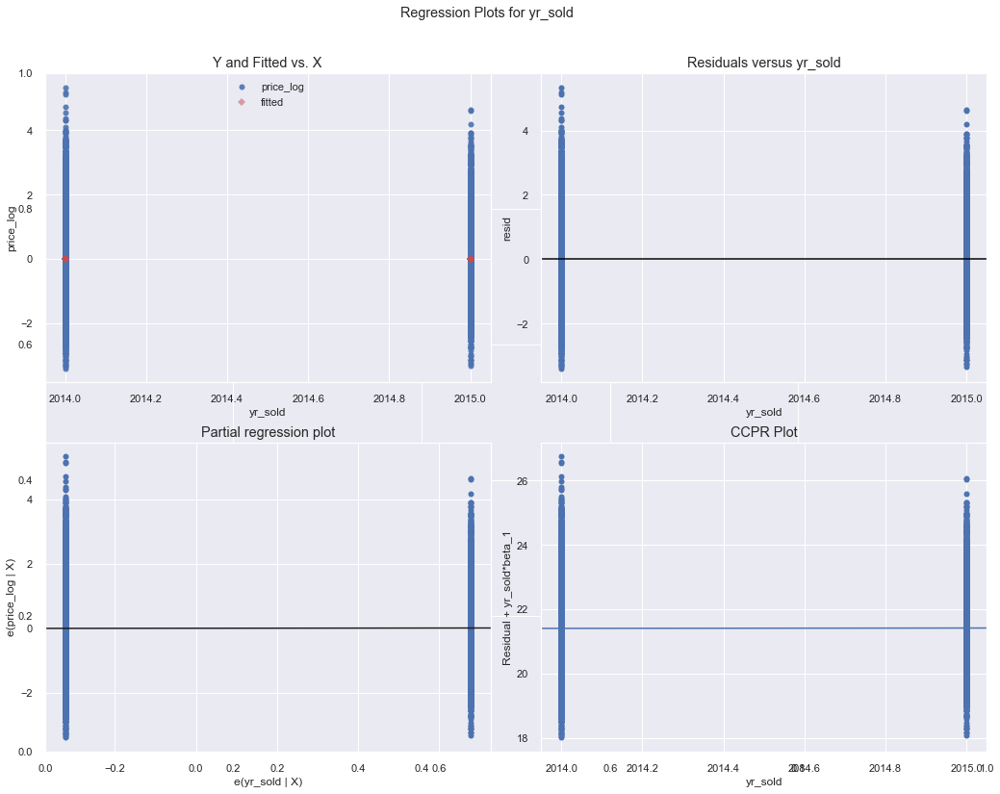

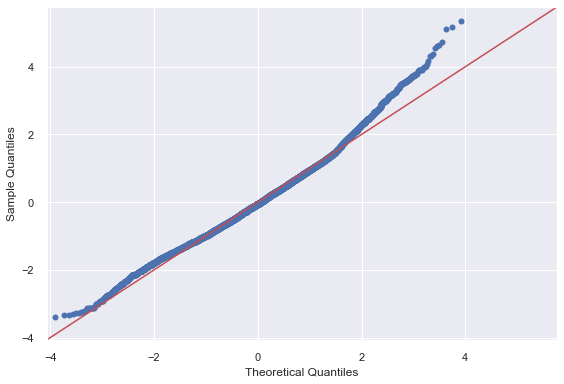

yr_sold: R2 0.000 , intercept -21.418 , slope 0.011 , p-value 0.465 , JB 1097.761
Press Enter to continue...
King Housing DataSet - Regression Analysis and Diagnostics for price_log~mo_sold
-------------------------------------------------------------------------------------


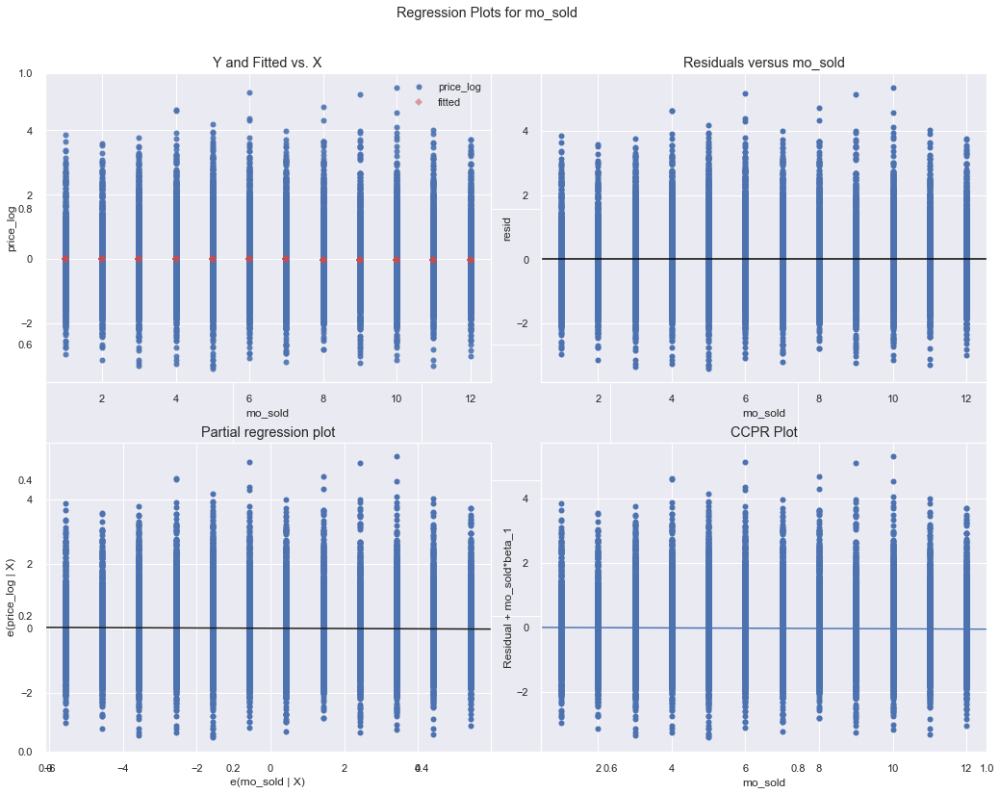

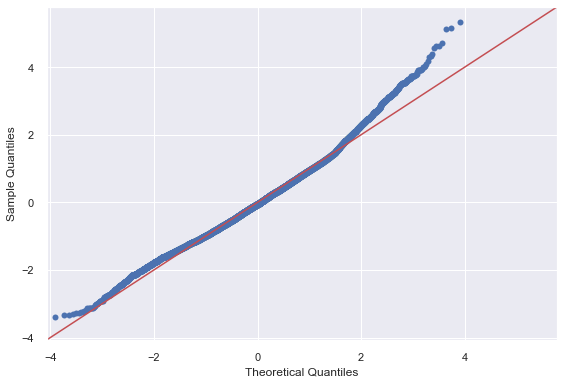

mo_sold: R2 0.000 , intercept 0.028 , slope -0.004 , p-value 0.055 , JB 1099.434
Press Enter to continue...


[['price_log', 1.0, 0.0, 1.0, 0.0, 2485.319],
 ['bathrooms_log', 0.271, 0.0, 0.52, 0.0, 344.181],
 ['sqft_lot_log', 0.019, 0.0, 0.138, 0.0, 761.236],
 ['sqft_above_log', 0.343, 0.0, 0.586, 0.0, 139.438],
 ['lat_log', 0.202, 0.0, 0.449, 0.0, 2761.665],
 ['long_log', 0.003, 0.0, -0.051, 0.0, 1163.734],
 ['bedrooms', 0.118, -1.25, 0.371, 0.0, 1471.526],
 ['floors', 0.096, -0.86, 0.576, 0.0, 1031.279],
 ['waterfront', 0.029, -0.014, 2.083, 0.0, 701.596],
 ['view', 0.119, -0.105, 0.451, 0.0, 436.57],
 ['condition', 0.002, -0.204, 0.06, 0.0, 1086.243],
 ['grade', 0.495, -4.593, 0.6, 0.0, 133.708],
 ['yr_built', 0.001, -2.366, 0.001, 0.0, 1110.506],
 ['zipcode', 0.002, -89.7, 0.001, 0.0, 1115.766],
 ['hasrenovated', 0.011, -0.02, 0.584, 0.0, 1000.113],
 ['hasbasement', 0.043, -0.171, 0.42, 0.0, 1029.302],
 ['hasbiggerliving', 0.064, -0.231, 0.506, 0.0, 824.719],
 ['hasbiggerlot', 0.003, -0.043, 0.108, 0.0, 1053.966],
 ['yr_sold', 0.0, -21.418, 0.011, 0.465, 1097.761],
 ['mo_sold', 0.0, 0.028,

In [138]:
results = []
for idx, col in enumerate(kc_preprocessed_v2.columns):
    print (f"King Housing DataSet - Regression Analysis and Diagnostics for price_log~{col}")
    print ("-------------------------------------------------------------------------------------")

    f = f'price_log~{col}'
    model = ols(formula=f, data=kc_preprocessed_v2).fit()
    
    fig, axes = plt.subplots(figsize=(15,12))
    fig = sm.graphics.plot_regress_exog(model, col, fig=fig)
    fig = sm.graphics.qqplot(model.resid, dist=stats.norm, line='45', fit=True)
    fig.tight_layout()
    plt.show()
    
    print(f'{col}: R2 {model.rsquared:5.3f} , intercept {model.params[0]:5.3f} , slope {model.params[1]:5.3f} , p-value {model.pvalues[1]:5.3f} , JB {sms.jarque_bera(model.resid)[0]:5.3f}')
    results.append([col, round(model.rsquared,3), round(model.params[0],3), round(model.params[1],3), round(model.pvalues[1],3), round(sms.jarque_bera(model.resid)[0],3)])
    input("Press Enter to continue...")
    
results

## multiple linear regression (before dummy creation)
### run a linear model with price as the target variable in statsmodels

In [139]:
X = kc_preprocessed_v2.drop('price_log', axis=1)
Y = kc_preprocessed_v2.price_log
print(Y.head(),'\n')
X.head()

0   -1.401998
1    0.279938
2   -1.799430
3    0.499698
4    0.178434
Name: price_log, dtype: float64 



,bathrooms_log,sqft_lot_log,sqft_above_log,lat_log,long_log,bedrooms,floors,waterfront,view,condition,grade,yr_built,zipcode,hasrenovated,hasbasement,hasbiggerliving,hasbiggerlot,yr_sold,mo_sold
0,-1.726509,-0.388430,-0.753565,-0.351359,0.306054,3,1.0,0,0,3,7,1913.0,98005.0,0,0,0,0,2014,10
1,0.339653,-0.113241,0.672693,1.160018,0.746142,3,2.0,0,0,3,7,1913.0,98005.0,1,1,1,0,2014,12
2,-1.726509,0.244475,-1.752954,1.281474,0.135637,2,1.0,0,0,3,6,1913.0,98005.0,0,0,0,1,2015,2
3,1.072635,-0.523914,-1.026835,-0.282056,1.271117,4,1.0,0,0,5,7,1913.0,98005.0,0,1,1,0,2014,12
4,0.039555,0.008139,0.073515,0.410205,-1.200453,3,1.0,0,0,3,8,1913.0,98005.0,0,0,0,1,2015,2


In [143]:
linreg = LinearRegression()
mse = make_scorer(mean_squared_error)

crossvalidation = KFold(n_splits=80, shuffle=True, random_state=1) # 10-fold
baseline_r2 = np.mean(cross_val_score(linreg, X, Y, scoring='r2', cv=crossvalidation))
baseline_mse = np.mean(cross_val_score(linreg, X, Y, scoring=mse, cv=crossvalidation))
baseline_rmse = np.sqrt(baseline_mse)

print(f' baseline model - r2:{baseline_r2:.5f}, mse:{baseline_mse:.5f}, rmse:{baseline_rmse:.5f}')

 baseline model - r2:0.74288, mse:0.25460, rmse:0.50458


In [144]:
X_baseline = sm.add_constant(X)
model = sm.OLS(Y,X_baseline).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              price_log   R-squared:                       0.746
Model:                            OLS   Adj. R-squared:                  0.746
Method:                 Least Squares   F-statistic:                     3334.
Date:                Tue, 21 Jul 2020   Prob (F-statistic):               0.00
Time:                        18:44:16   Log-Likelihood:                -15850.
No. Observations:               21597   AIC:                         3.174e+04
Df Residuals:                   21577   BIC:                         3.190e+04
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const            -264.7702     32.044     -8.263      0.000    -327.579    -201.961
bathrooms_log       0.0135      0.006      2.345      0.019       0.002       0.025
sqft_lot_log        0.0093      0.005      1.977      0.048    8.05e-05       0.019
sqft_above_log      0.3671      0.008     45.414      0.000       0.351       0.383
lat_log             0.3900      0.004    109.118      0.000       0.383       0.397
long_log            0.0400      0.004      9.787      0.000       0.032       0.048
bedrooms           -0.0080      0.005     -1.681      0.093      -0.017       0.001
floors             -0.0088      0.010     -0.913      0.361      -0.028       0.010
waterfront          0.7333      0.045     16.134      0.000       0.644       0.822
view                0.1635      0.005     31.740      0.000       0.153       0.174
condition           0.1994      0.006     35.729      0.000       0.188       0.210
grade               0.3144      0.005     63.026      0.000       0.305       0.324
yr_built           -0.0003      0.000     -0.717      0.473      -0.001       0.000
zipcode             0.0003      0.000      1.169      0.243      -0.000       0.001
hasrenovated        0.3529      0.019     18.508      0.000       0.316       0.390
hasbasement         0.3356      0.009     35.336      0.000       0.317       0.354
hasbiggerliving    -0.0445      0.008     -5.454      0.000      -0.061      -0.029
hasbiggerlot       -0.0141      0.007     -1.907      0.057      -0.029       0.000
yr_sold             0.1174      0.012      9.932      0.000       0.094       0.141
mo_sold             0.0040      0.002      2.245      0.025       0.001       0.007
==============================================================================
Omnibus:                      464.134   Durbin-Watson:                   2.003
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              729.423
Skew:                           0.218   Prob(JB):                    4.05e-159
Kurtosis:                       3.788   Cond. No.                     9.16e+08
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 9.16e+08. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

### check normality

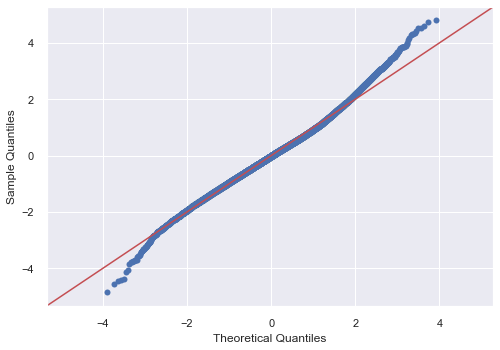

In [145]:
fig = sm.graphics.qqplot(model.resid, dist=stats.norm, line='45', fit=True)

### check homoscedasticity

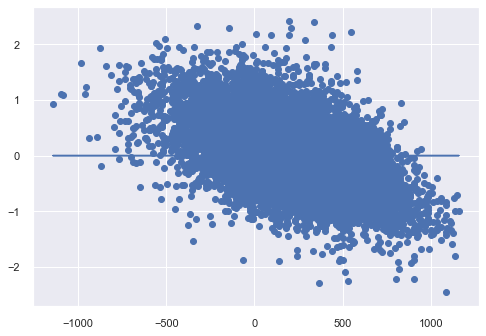

In [146]:
plt.scatter(model.predict(kc_preprocessed_v2[x_cols]), model.resid)
plt.plot(model.predict(kc_preprocessed_v2[x_cols]), [0 for i in range(len(kc_preprocessed_v2))])

### run the same model in scikit-learn

In [147]:
# Importing and initialize the linear regression model class
linreg = LinearRegression()
linreg.fit(X, Y)
linreg.coef_

array([ 1.34930925e-02,  9.32385683e-03,  3.67076664e-01,  3.89973379e-01,
        3.99627666e-02, -8.03854229e-03, -8.75034619e-03,  7.33328767e-01,
        1.63523351e-01,  1.99385315e-01,  3.14433447e-01, -2.81170967e-04,
        2.61601474e-04,  3.52948156e-01,  3.35574155e-01, -4.45193537e-02,
       -1.40568026e-02,  1.17373292e-01,  3.97467245e-03])

In [148]:
linreg.intercept_

-264.77016660852473

### use feature ranking with recursive feature elimination: Top 5 features

In [149]:
selector = RFE(linreg, n_features_to_select=5)
selector = selector.fit(X, Y.values.ravel())

In [150]:
selector.support_ 

array([False, False,  True,  True, False, False, False,  True, False,
       False, False, False, False,  True,  True, False, False, False,
       False])

In [151]:
selector.ranking_

array([ 9, 10,  1,  1,  7, 11, 12,  1,  4,  3,  2, 14, 15,  1,  1,  6,  8,
        5, 13])

In [152]:
estimators = selector.estimator_
print(estimators.coef_)
print(estimators.intercept_)

[0.64479209 0.42423718 1.49273363 0.31479446 0.56854535]
-0.25183393504374707


In [153]:
print(X.columns)
selected_columns = X.columns[selector.support_]
selected_columns

Index(['bathrooms_log', 'sqft_lot_log', 'sqft_above_log', 'lat_log',
       'long_log', 'bedrooms', 'floors', 'waterfront', 'view', 'condition',
       'grade', 'yr_built', 'zipcode', 'hasrenovated', 'hasbasement',
       'hasbiggerliving', 'hasbiggerlot', 'yr_sold', 'mo_sold'],
      dtype='object')


Index(['sqft_above_log', 'lat_log', 'waterfront', 'hasrenovated',
       'hasbasement'],
      dtype='object')

In [154]:
linreg.fit(X[selected_columns],Y)
yhat = linreg.predict(X[selected_columns])
yhat

array([-0.88678635,  1.55737593, -0.8384758 , ..., -0.85213589,
       -0.35579492, -0.85305316])

Now, using the formulas of R-squared and adjusted R-squared below, and your Python/numpy knowledge, compute them and contrast them with the R-squared and adjusted R-squared in your statsmodels output using stepwise selection. Which of the two models would you prefer?

$SS_{residual} = \sum (y - \hat{y})^2 $

$SS_{total} = \sum (y - \bar{y})^2 $

$R^2 = 1- \dfrac{SS_{residual}}{SS_{total}}$

$R^2_{adj}= 1-(1-R^2)\dfrac{n-1}{n-p-1}$

In [155]:
SS_residual = np.dot(Y-yhat,Y-yhat)
SS_total = np.dot(Y-np.mean(Y),Y-np.mean(Y))
R_squared = 1 - (SS_residual / SS_total)
adjusted_R_squared = 1 - (1 - R_squared) * ((len(Y) - 1) / (len(Y) - X[selected_columns].shape[1] - 1))

print(R_squared)
print(adjusted_R_squared)

0.6530169911043833
0.6529366374827595


###  train-test split

In [156]:
# Split the data into training and test sets (assign 20% to test set)
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.20, random_state=42)
print('X_train:', len(X_train), 'X_test:', len(X_test), 'y_train:', len(y_train), 'y_test:', len(y_test))
print('X_test/X_train:',round(np.divide(len(X_test),len(X_train)),3),'\ty_test/y_train:',round(np.divide(len(y_test),len(y_train)),3))

X_train: 17277 X_test: 4320 y_train: 17277 y_test: 4320
X_test/X_train: 0.25 	y_test/y_train: 0.25


### fit the model
* Apply your model to the train set
* Calculate predictions on training and test sets

Fit a linear regression model and apply the model to make predictions on test set

In [157]:
# Fit the model to train data
linreg.fit(X_train, y_train)
# Calculate predictions on training and test sets
y_hat_train = linreg.predict(X_train)
y_hat_test = linreg.predict(X_test)

### residuals and MSE
* Calculate training and test residuals
* Calculate the Mean Squared Error (MSE)

A good way to compare overall performance is to compare the mean squarred error for the predicted values on the training and test sets. Calculate the residuals and the mean squared error on the test set

In [158]:
# Calculate residuals
train_residuals = y_hat_train - y_train
test_residuals = y_hat_test - y_test
# Import mean_squared_error from sklearn.metrics
train_mse = mean_squared_error(y_train, y_hat_train)
test_mse = mean_squared_error(y_test, y_hat_test)
print('Train Mean Squarred Error (sklearn.metrics):', round(train_mse,3))
print('Test Mean Squarred Error (sklearn.metrics):', round(test_mse,3))
# Calculate training and test MSE
mse_train = np.dot((y_train-y_hat_train).T, y_train-y_hat_train) / np.size(y_train)
mse_test = np.dot((y_test-y_hat_test).T, y_test-y_hat_test) / np.size(y_test)
print('Train Mean Squarred Error (statistics):', round(mse_train,3))
print('Test Mean Squarred Error (statistics):', round(mse_test,3))
rmse_train = np.sqft(mse_train)
rmse_test = np.sqft(mse_test)
print('Train Root Mean Squarred Error (statistics):', round(rmse_train,3))
print('Test Root Mean Squarred Error (statistics):', round(rmse_test,3))

Train Mean Squarred Error (sklearn.metrics): 0.254
Test Mean Squarred Error (sklearn.metrics): 0.253
Train Mean Squarred Error (statistics): 0.254
Test Mean Squarred Error (statistics): 0.253


### cross-validation using Scikit-Learn

In [159]:
mse = make_scorer(mean_squared_error)

cv_5_mse  = np.mean(cross_val_score(linreg, X, Y, cv=5,  scoring=mse))
cv_10_mse = np.mean(cross_val_score(linreg, X, Y, cv=10, scoring=mse))
cv_20_mse = np.mean(cross_val_score(linreg, X, Y, cv=20, scoring=mse))
cv_40_mse = np.mean(cross_val_score(linreg, X, Y, cv=40, scoring=mse))
cv_80_mse = np.mean(cross_val_score(linreg, X, Y, cv=80, scoring=mse))
print(f'5-fold:{cv_5_mse.mean():.5f}, 10-fold:{cv_10_mse.mean():.5f}, 20-fold:{cv_20_mse.mean():.5f}, 40-fold:{cv_40_mse.mean():.5f}, 80-fold:{cv_80_mse.mean():.5f}')

5-fold:0.25513, 10-fold:0.25525, 20-fold:0.25488, 40-fold:0.25474, 80-fold:0.25465


In [160]:
cv_5_r2  = np.mean(cross_val_score(linreg, X, Y, cv=5,  scoring='r2'))
cv_10_r2 = np.mean(cross_val_score(linreg, X, Y, cv=10, scoring='r2'))
cv_20_r2 = np.mean(cross_val_score(linreg, X, Y, cv=20, scoring='r2'))
cv_40_r2 = np.mean(cross_val_score(linreg, X, Y, cv=40, scoring='r2'))
cv_80_r2 = np.mean(cross_val_score(linreg, X, Y, cv=80, scoring='r2'))
print(f'5-fold:{cv_5_r2.mean():.5f}, 10-fold:{cv_10_r2.mean():.5f}, 20-fold:{cv_20_r2.mean():.5f}, 40-fold:{cv_40_r2.mean():.5f}, 80-fold:{cv_80_r2.mean():.5f}')

5-fold:0.74407, 10-fold:0.74348, 20-fold:0.74363, 40-fold:0.74297, 80-fold:0.74167


### conclusion:

Top 5 features in this baseline model, where there is no dummy created, are as follow:

- **'sqft_above_log'** (continuous), 

- **'waterfront'** (categorical), 

- **'lat_log'** (continuous), 

- **'hasrenovated'** (categorical), 

- **'hasbasement'** (categorical)

baseline model : r2:0.74, mse:0.25, rmse:0.50

### predict the house price given various characteristics: 

In [161]:
#train, test = train_test_split(kc_preprocessed_v2, test_size=0.20, random_state=42)
#X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.20, random_state=42)
#print('train:', len(train), 'test:', len(test))
#print('test/train:',round(np.divide(len(test),len(train)),3))
#train.columns

#### house tours

In [162]:
#f1 = 'price_log~view'
#model_view = ols(formula=f1, data=train).fit()

#fig, axes = plt.subplots(figsize=(15,12))
#fig = sm.graphics.plot_regress_exog(model_view, 'view', fig=fig)
#fig = sm.graphics.qqplot(model_view.resid, dist=stats.norm, line='45', fit=True)
#fig.tight_layout()
#plt.show()

#print(f'view: R2 {model_view.rsquared:5.3f} , intercept {model_view.params[0]:5.3f} , slope {model_view.params[1]:5.3f} , p-value {model_view.pvalues[1]:5.3f} , JB {sms.jarque_bera(model_view.resid)[0]:5.3f}')

In [163]:
#X_new = pd.DataFrame({'view': [np.min(train.view), np.max(train.view)]})
#preds = model_view.predict(X_new)
#train.plot(kind='scatter', x='view', y='price_log', c='green')
#plt.plot(X_new, preds, c='red', linewidth=2)
#plt.show()

#### house sold season

In [164]:
#f2 = 'price_log~mo_sold'
#model_mo = ols(formula=f2, data=train).fit()

#fig, axes = plt.subplots(figsize=(15,12))
#fig = sm.graphics.plot_regress_exog(model_mo, 'mo_sold', fig=fig)
#fig = sm.graphics.qqplot(model_mo.resid, dist=stats.norm, line='45', fit=True)
#fig.tight_layout()
#plt.show()

#print(f'month_sold: R2 {model_mo.rsquared:5.3f} , intercept {model_mo.params[0]:5.3f} , slope {model_mo.params[1]:5.3f} , p-value {model_mo.pvalues[1]:5.3f} , JB {sms.jarque_bera(model_mo.resid)[0]:5.3f}')

In [165]:
#X_new = pd.DataFrame({'mo_sold': [np.min(train.mo_sold), np.max(train.mo_sold)]})
#preds = model_mo.predict(X_new)
#train.plot(kind='scatter', x='mo_sold', y='price_log', c='green')
#plt.plot(X_new, preds, c='red', linewidth=2)
#plt.show()

#### house location

In [166]:
#f3 = 'price_log~lat_cat'
#model_lat = ols(formula=f3, data=train).fit()

#fig, axes = plt.subplots(figsize=(15,12))
#fig = sm.graphics.plot_regress_exog(model_lat, 'lat_cat', fig=fig)
#fig = sm.graphics.qqplot(model_lat.resid, dist=stats.norm, line='45', fit=True)
#fig.tight_layout()
#plt.show()

#print(f'month_sold: R2 {model_lat.rsquared:5.3f} , intercept {model_lat.params[0]:5.3f} , slope {model_lat.params[1]:5.3f} , p-value {model_lat.pvalues[1]:5.3f} , JB {sms.jarque_bera(model_lat.resid)[0]:5.3f}')

In [167]:
#X_new = pd.DataFrame({'lat_cat': [np.min(train.lat_cat), np.max(train.lat_cat)]})
#preds = model_lat.predict(X_new)
#train.plot(kind='scatter', x='lat_cat', y='price_log', c='green')
#plt.plot(X_new, preds, c='red', linewidth=2)
#plt.show()

In [168]:
#f4 = 'price_log~zipcode_log'
#model_zip = ols(formula=f4, data=train).fit()

#fig, axes = plt.subplots(figsize=(15,12))
#fig = sm.graphics.plot_regress_exog(model_zip, 'zipcode_log', fig=fig)
#fig = sm.graphics.qqplot(model_zip.resid, dist=stats.norm, line='45', fit=True)
#fig.tight_layout()
#plt.show()

#print(f'zipcode_log: R2 {model_zip.rsquared:5.3f} , intercept {model_zip.params[0]:5.3f} , slope {model_zip.params[1]:5.3f} , p-value {model_zip.pvalues[1]:5.3f} , JB {sms.jarque_bera(model_zip.resid)[0]:5.3f}')

In [169]:
#X_new = pd.DataFrame({'zipcode_log': [np.min(train.zipcode_log), np.max(train.zipcode_log)]})
#preds = model_zip.predict(X_new)
#train.plot(kind='scatter', x='zipcode_log', y='price_log', c='green')
#plt.plot(X_new, preds, c='red', linewidth=2)
#plt.show()

#### house condition

In [170]:
#f5 = 'price_log~condition'
#model_cond = ols(formula=f5, data=train).fit()

#fig, axes = plt.subplots(figsize=(15,12))
#fig = sm.graphics.plot_regress_exog(model_cond, 'condition', fig=fig)
#fig = sm.graphics.qqplot(model_cond.resid, dist=stats.norm, line='45', fit=True)
#fig.tight_layout()
#plt.show()

#print(f'condition: R2 {model_cond.rsquared:5.3f} , intercept {model_cond.params[0]:5.3f} , slope {model_cond.params[1]:5.3f} , p-value {model_cond.pvalues[1]:5.3f} , JB {sms.jarque_bera(model_cond.resid)[0]:5.3f}')

In [171]:
#X_new = pd.DataFrame({'condition': [np.min(train.condition), np.max(train.condition)]})
#preds = model_cond.predict(X_new)
#train.plot(kind='scatter', x='condition', y='price_log', c='green')
#plt.plot(X_new, preds, c='red', linewidth=2)
#plt.show()

#### house tour evaluation

In [172]:
#f6 = 'price_log~grade'
#model_grade = ols(formula=f6, data=train).fit()

#fig, axes = plt.subplots(figsize=(15,12))
#fig = sm.graphics.plot_regress_exog(model_grade, 'grade', fig=fig)
#fig = sm.graphics.qqplot(model_grade.resid, dist=stats.norm, line='45', fit=True)
#fig.tight_layout()
#plt.show()

#print(f'grade: R2 {model_grade.rsquared:5.3f} , intercept {model_grade.params[0]:5.3f} , slope {model_grade.params[1]:5.3f} , p-value {model_grade.pvalues[1]:5.3f} , JB {sms.jarque_bera(model_grade.resid)[0]:5.3f}')

In [173]:
#sms.jarque_bera(model_grade.resid)

In [174]:
#X_new = pd.DataFrame({'grade': [np.min(train.grade), np.max(train.grade)]})
#preds = model_grade.predict(X_new)
#train.plot(kind='scatter', x='grade', y='price_log', c='green')
#plt.plot(X_new, preds, c='red', linewidth=2)
#plt.show()

#### house size

In [175]:
#f7 = 'price_log~sqft_above_log'
#model_size = ols(formula=f7, data=train).fit()

#fig, axes = plt.subplots(figsize=(15,12))
#fig = sm.graphics.plot_regress_exog(model_size, 'sqft_above_log', fig=fig)
#fig = sm.graphics.qqplot(model_size.resid, dist=stats.norm, line='45', fit=True)
#fig.tight_layout()
#plt.show()

#print(f'size: R2 {model_size.rsquared:5.3f} , intercept {model_size.params[0]:5.3f} , slope {model_size.params[1]:5.3f} , p-value {model_size.pvalues[1]:5.3f} , JB {sms.jarque_bera(model_size.resid)[0]:5.3f}')

In [176]:
#X_new = pd.DataFrame({'sqft_above_log': [np.min(train.sqft_above_log), np.max(train.sqft_above_log)]})
#preds = model_size.predict(X_new)
#train.plot(kind='scatter', x='sqft_above_log', y='price_log', c='green')
#plt.plot(X_new, preds, c='red', linewidth=2)
#plt.show()

#### house plans & designs
##### (1) basement

In [177]:
#f8 = 'price_log~hasbasement'
#model_base = ols(formula=f8, data=train).fit()

#fig, axes = plt.subplots(figsize=(15,12))
#fig = sm.graphics.plot_regress_exog(model_base, 'hasbasement', fig=fig)
#fig = sm.graphics.qqplot(model_base.resid, dist=stats.norm, line='45', fit=True)
#fig.tight_layout()
#plt.show()

#print(f'basement: R2 {model_base.rsquared:5.3f} , intercept {model_base.params[0]:5.3f} , slope {model_base.params[1]:5.3f} , p-value {model_base.pvalues[1]:5.3f} , JB {sms.jarque_bera(model_base.resid)[0]:5.3f}')

In [178]:
#X_new = pd.DataFrame({'hasbasement': [np.min(train.hasbasement), np.max(train.hasbasement)]})
#preds = model_base.predict(X_new)
#train.plot(kind='scatter', x='hasbasement', y='price_log', c='green')
#plt.plot(X_new, preds, c='red', linewidth=2)
#plt.show()

##### (2) renovation amenity

In [179]:
#f9 = 'price_log~hasrenovated'
#model_ren = ols(formula=f9, data=train).fit()

#fig, axes = plt.subplots(figsize=(15,12))
#fig = sm.graphics.plot_regress_exog(model_ren, 'hasrenovated', fig=fig)
#fig = sm.graphics.qqplot(model_ren.resid, dist=stats.norm, line='45', fit=True)
#fig.tight_layout()
#plt.show()

#print(f'renovation: R2 {model_ren.rsquared:5.3f} , intercept {model_ren.params[0]:5.3f} , slope {model_ren.params[1]:5.3f} , p-value {model_ren.pvalues[1]:5.3f} , JB {sms.jarque_bera(model_ren.resid)[0]:5.3f}')

In [180]:
#X_new = pd.DataFrame({'hasrenovated': [np.min(train.hasrenovated), np.max(train.hasrenovated)]})
#preds = model_ren.predict(X_new)
#train.plot(kind='scatter', x='hasrenovated', y='price_log', c='green')
#plt.plot(X_new, preds, c='red', linewidth=2)
#plt.show()

##### (3) bathrooms

In [181]:
#f10 = 'price_log~bathrooms'
#model_bath = ols(formula=f10, data=train).fit()

#fig, axes = plt.subplots(figsize=(15,12))
#fig = sm.graphics.plot_regress_exog(model_bath, 'bathrooms', fig=fig)
#fig = sm.graphics.qqplot(model_bath.resid, dist=stats.norm, line='45', fit=True)
#fig.tight_layout()
#plt.show()

#print(f'bathrooms: R2 {model_bath.rsquared:5.3f} , intercept {model_bath.params[0]:5.3f} , slope {model_bath.params[1]:5.3f} , p-value {model_bath.pvalues[1]:5.3f} , JB {sms.jarque_bera(model_bath.resid)[0]:5.3f}')

In [182]:
#X_new = pd.DataFrame({'bathrooms': [np.min(train.bathrooms), np.max(train.bathrooms)]})
#preds = model_bath.predict(X_new)
#train.plot(kind='scatter', x='bathrooms', y='price_log', c='green')
#plt.plot(X_new, preds, c='red', linewidth=2)
#plt.show()

##### (4) bedrooms

In [183]:
#f11 = 'price_log~bedrooms'
#model_bed = ols(formula=f11, data=train).fit()

#fig, axes = plt.subplots(figsize=(15,12))
#fig = sm.graphics.plot_regress_exog(model_bed, 'bedrooms', fig=fig)
#fig = sm.graphics.qqplot(model_bed.resid, dist=stats.norm, line='45', fit=True)
#fig.tight_layout()
#plt.show()

#print(f'bedrooms: R2 {model_bed.rsquared:5.3f} , intercept {model_bed.params[0]:5.3f} , slope {model_bed.params[1]:5.3f} , p-value {model_bed.pvalues[1]:5.3f} , JB {sms.jarque_bera(model_bed.resid)[0]:5.3f}')

In [184]:
#X_new = pd.DataFrame({'bedrooms': [np.min(train.bedrooms), np.max(train.bedrooms)]})
#preds = model_bed.predict(X_new)
#train.plot(kind='scatter', x='bedrooms', y='price_log', c='green')
#plt.plot(X_new, preds, c='red', linewidth=2)
#plt.show()

##### (5) floors

In [185]:
#f12 = 'price_log~floors'
#model_fl = ols(formula=f12, data=train).fit()

#fig, axes = plt.subplots(figsize=(15,12))
#fig = sm.graphics.plot_regress_exog(model_fl, 'floors', fig=fig)
#fig = sm.graphics.qqplot(model_fl.resid, dist=stats.norm, line='45', fit=True)
#fig.tight_layout()
#plt.show()

#print(f'floors: R2 {model_fl.rsquared:5.3f} , intercept {model_fl.params[0]:5.3f} , slope {model_fl.params[1]:5.3f} , p-value {model_fl.pvalues[1]:5.3f} , JB {sms.jarque_bera(model_fl.resid)[0]:5.3f}')

In [186]:
#X_new = pd.DataFrame({'floors': [np.min(train.floors), np.max(train.floors)]})
#preds = model_fl.predict(X_new)
#train.plot(kind='scatter', x='floors', y='price_log', c='green')
#plt.plot(X_new, preds, c='red', linewidth=2)
#plt.show()

##### (6) bigger living space in neighborhood 

In [187]:
#f13 = 'price_log~hasbiggerliving'
#model_liv = ols(formula=f13, data=train).fit()

#fig, axes = plt.subplots(figsize=(15,12))
#fig = sm.graphics.plot_regress_exog(model_liv, 'hasbiggerliving', fig=fig)
#fig = sm.graphics.qqplot(model_liv.resid, dist=stats.norm, line='45', fit=True)
#fig.tight_layout()
#plt.show()

#print(f'living space: R2 {model_liv.rsquared:5.3f} , intercept {model_liv.params[0]:5.3f} , slope {model_liv.params[1]:5.3f} , p-value {model_liv.pvalues[1]:5.3f} , JB {sms.jarque_bera(model_liv.resid)[0]:5.3f}')

In [188]:
#X_new = pd.DataFrame({'hasbiggerliving': [np.min(train.hasbiggerliving), np.max(train.hasbiggerliving)]})
#preds = model_liv.predict(X_new)
#train.plot(kind='scatter', x='hasbiggerliving', y='price_log', c='green')
#plt.plot(X_new, preds, c='red', linewidth=2)
#plt.show()

##### (7) waterfront amenity

In [189]:
#f14 = 'price_log~waterfront'
#model_water = ols(formula=f14, data=train).fit()

#fig, axes = plt.subplots(figsize=(15,12))
#fig = sm.graphics.plot_regress_exog(model_water, 'waterfront', fig=fig)
#fig = sm.graphics.qqplot(model_water.resid, dist=stats.norm, line='45', fit=True)
#fig.tight_layout()
#plt.show()

#print(f'waterfront: R2 {model_water.rsquared:5.3f} , intercept {model_water.params[0]:5.3f} , slope {model_water.params[1]:5.3f} , p-value {model_water.pvalues[1]:5.3f} , JB {sms.jarque_bera(model_water.resid)[0]:5.3f}')

In [190]:
#X_new = pd.DataFrame({'waterfront': [np.min(train.waterfront), np.max(train.waterfront)]})
#preds = model_water.predict(X_new)
#train.plot(kind='scatter', x='waterfront', y='price_log', c='green')
#plt.plot(X_new, preds, c='red', linewidth=2)
#plt.show()

### conclusion (baseline model w/o dummies):

final features: 
       
- **'bathrooms_log'** (discrete), 

- **'sqft_lot_log'** (continuous), 

- **'sqft_above_log'** (continuous), 

- **'lat_log'** (continuous),

- **'long_log'** (continuous),

- **'zipcode'** (continuous --> discrete), 

- **'bedrooms'** (discrete),  

- **'floors'** (discrete), 

- **'waterfront'** (categorical), 

- **'view'** (categorical), 

- **'condition'** (categorical),

- **'grade'** (categorical), 

- **'yr_built'** (continuous --> discrete),

- **'hasrenovated'** (categorical), 

- **'hasbasement'** (categorical), 

- **'hasbiggerliving'** (categorical),

- **'hasbiggerlot'** (categorical), 

- **'yr_sold'** (discrete),

- **'mo_sold'** (discrete)

## multiple linear regression (after dummy creation)

In [192]:
kc_preprocessed_v2['yr_built'] = kc_preprocessed_v2['yr_built'].astype('int64')
kc_preprocessed_v2['zipcode'] = kc_preprocessed_v2['zipcode'].astype('int64')
kc_preprocessed_v2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 20 columns):
price_log          21597 non-null float64
bathrooms_log      21597 non-null float64
sqft_lot_log       21597 non-null float64
sqft_above_log     21597 non-null float64
lat_log            21597 non-null float64
long_log           21597 non-null float64
bedrooms           21597 non-null int64
floors             21597 non-null float64
waterfront         21597 non-null int64
view               21597 non-null int64
condition          21597 non-null int64
grade              21597 non-null int64
yr_built           21597 non-null int64
zipcode            21597 non-null int64
hasrenovated       21597 non-null int64
hasbasement        21597 non-null int64
hasbiggerliving    21597 non-null int64
hasbiggerlot       21597 non-null int64
yr_sold            21597 non-null int64
mo_sold            21597 non-null int64
dtypes: float64(7), int64(13)
memory usage: 3.3 MB


In [193]:
# one hot encode categoricals
import pandas as pd
categoricals = ['zipcode', 'bedrooms', 'floors', 'waterfront', 'view', 'condition', 'grade', 'yr_built', 'hasrenovated', 
                'hasbasement', 'hasbiggerliving', 'hasbiggerlot', 'yr_sold', 'mo_sold']

kc_preprocessed_v3 = pd.get_dummies(kc_preprocessed_v2, columns=categoricals, drop_first=True)
print(kc_preprocessed_v3.columns)
kc_preprocessed_v3.head()

Index(['price_log', 'bathrooms_log', 'sqft_lot_log', 'sqft_above_log',
       'lat_log', 'long_log', 'zipcode_98018', 'zipcode_98033',
       'zipcode_98046', 'zipcode_98059', 'zipcode_98084', 'zipcode_98109',
       'zipcode_98120', 'zipcode_98140', 'zipcode_98177', 'bedrooms_2',
       'bedrooms_3', 'bedrooms_4', 'bedrooms_5', 'bedrooms_6', 'bedrooms_7',
       'bedrooms_8', 'bedrooms_9', 'bedrooms_10', 'bedrooms_11', 'bedrooms_33',
       'floors_1.5', 'floors_2.0', 'floors_2.5', 'floors_3.0', 'floors_3.5',
       'waterfront_1', 'view_1', 'view_2', 'view_3', 'view_4', 'condition_2',
       'condition_3', 'condition_4', 'condition_5', 'grade_4', 'grade_5',
       'grade_6', 'grade_7', 'grade_8', 'grade_9', 'grade_10', 'grade_11',
       'grade_12', 'grade_13', 'yr_built_1937', 'yr_built_1952',
       'yr_built_1961', 'yr_built_1970', 'yr_built_1979', 'yr_built_1987',
       'yr_built_1996', 'yr_built_2004', 'yr_built_2011', 'hasrenovated_1',
       'hasbasement_1', 'hasbiggerliving_

,price_log,bathrooms_log,sqft_lot_log,sqft_above_log,lat_log,long_log,zipcode_98018,zipcode_98033,zipcode_98046,zipcode_98059,...,mo_sold_3,mo_sold_4,mo_sold_5,mo_sold_6,mo_sold_7,mo_sold_8,mo_sold_9,mo_sold_10,mo_sold_11,mo_sold_12
0,-1.401998,-1.726509,-0.388430,-0.753565,-0.351359,0.306054,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
1,0.279938,0.339653,-0.113241,0.672693,1.160018,0.746142,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2,-1.799430,-1.726509,0.244475,-1.752954,1.281474,0.135637,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0.499698,1.072635,-0.523914,-1.026835,-0.282056,1.271117,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,0.178434,0.039555,0.008139,0.073515,0.410205,-1.200453,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [194]:
kc_preprocessed_v3 = transform_colname(kc_preprocessed_v3)
kc_preprocessed_v3.columns

Index(['price_log', 'bathrooms_log', 'sqft_lot_log', 'sqft_above_log',
       'lat_log', 'long_log', 'zipcode_98018', 'zipcode_98033',
       'zipcode_98046', 'zipcode_98059', 'zipcode_98084', 'zipcode_98109',
       'zipcode_98120', 'zipcode_98140', 'zipcode_98177', 'bedrooms_2',
       'bedrooms_3', 'bedrooms_4', 'bedrooms_5', 'bedrooms_6', 'bedrooms_7',
       'bedrooms_8', 'bedrooms_9', 'bedrooms_10', 'bedrooms_11', 'bedrooms_33',
       'floors_15', 'floors_20', 'floors_25', 'floors_30', 'floors_35',
       'waterfront_1', 'view_1', 'view_2', 'view_3', 'view_4', 'condition_2',
       'condition_3', 'condition_4', 'condition_5', 'grade_4', 'grade_5',
       'grade_6', 'grade_7', 'grade_8', 'grade_9', 'grade_10', 'grade_11',
       'grade_12', 'grade_13', 'yr_built_1937', 'yr_built_1952',
       'yr_built_1961', 'yr_built_1970', 'yr_built_1979', 'yr_built_1987',
       'yr_built_1996', 'yr_built_2004', 'yr_built_2011', 'hasrenovated_1',
       'hasbasement_1', 'hasbiggerliving_1', '

In [195]:
kc_preprocessed_v3.head()

,price_log,bathrooms_log,sqft_lot_log,sqft_above_log,lat_log,long_log,zipcode_98018,zipcode_98033,zipcode_98046,zipcode_98059,...,mo_sold_3,mo_sold_4,mo_sold_5,mo_sold_6,mo_sold_7,mo_sold_8,mo_sold_9,mo_sold_10,mo_sold_11,mo_sold_12
0,-1.401998,-1.726509,-0.388430,-0.753565,-0.351359,0.306054,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
1,0.279938,0.339653,-0.113241,0.672693,1.160018,0.746142,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2,-1.799430,-1.726509,0.244475,-1.752954,1.281474,0.135637,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0.499698,1.072635,-0.523914,-1.026835,-0.282056,1.271117,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,0.178434,0.039555,0.008139,0.073515,0.410205,-1.200453,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


### check linearity

In [196]:
cc4_df = kc_preprocessed_v3.corr().abs().stack().reset_index().sort_values(0, ascending=True)
print(cc4_df.head())
cc4_df['pairs'] = list(zip(cc4_df.level_0, cc4_df.level_1))
cc4pairs_df = cc4_df.set_index('pairs')
cc4pairs_df = cc4pairs_df.drop(['level_1', 'level_0'], axis=1)
cc4pairs_df.columns = ['cc']
cc4pairs_df = cc4pairs_df.drop_duplicates(keep='first')
cc4pairs_df

            level_0        level_1             0
5603     mo_sold_12  yr_built_1970  3.415366e-07
4049  yr_built_1970     mo_sold_12  3.415366e-07
3575       grade_11  yr_built_1937  5.033896e-06
3797  yr_built_1937       grade_11  5.033896e-06
1329     bedrooms_4  yr_built_1979  6.953077e-06


,cc
pairs,
"(mo_sold_12, yr_built_1970)",3.415366e-07
"(grade_11, yr_built_1937)",5.033896e-06
"(bedrooms_4, yr_built_1979)",6.953077e-06
"(price_log, yr_built_1987)",7.805411e-06
"(bedrooms_33, bedrooms_11)",4.630487e-05
...,...
"(zipcode_98140, yr_built_2004)",9.327672e-01
"(yr_built_1970, zipcode_98059)",9.366365e-01
"(yr_built_1937, zipcode_98018)",9.534116e-01


In [198]:
cc4pairs_df[(cc4pairs_df['cc']>0.75) & (cc4pairs_df['cc']<1)]

,cc
pairs,
"(condition_3, condition_4)",0.812294
"(yr_built_1961, zipcode_98046)",0.876490
"(zipcode_98109, yr_built_1987)",0.890296
"(yr_built_1952, zipcode_98033)",0.904193
"(zipcode_98120, yr_built_1996)",0.907334
"(zipcode_98084, yr_built_1979)",0.932036
"(zipcode_98140, yr_built_2004)",0.932767
"(yr_built_1970, zipcode_98059)",0.936636
"(yr_built_1937, zipcode_98018)",0.953412


In [200]:
x_cols = list(kc_preprocessed_v3.columns)
vif = [variance_inflation_factor(kc_preprocessed_v3.values, i) for i in range(kc_preprocessed_v3.shape[1])]
list(zip(x_cols, vif))

[('price_log', 4.095535931583599),
 ('bathrooms_log', 3.0733412956470065),
 ('sqft_lot_log', 1.9789276949424564),
 ('sqft_above_log', 6.582880186277445),
 ('lat_log', 1.7159677178552886),
 ('long_log', 1.4724266068407372),
 ('zipcode_98018', 53.91751717799709),
 ('zipcode_98033', 83.76279401655769),
 ('zipcode_98046', 77.10392966351706),
 ('zipcode_98059', 81.44594219772564),
 ('zipcode_98084', 160.2231862478282),
 ('zipcode_98109', 138.72466909996936),
 ('zipcode_98120', 175.11694069167118),
 ('zipcode_98140', 184.2664326095309),
 ('zipcode_98177', 173.91092330721955),
 ('bedrooms_2', 16.012505460396802),
 ('bedrooms_3', 57.70920971012229),
 ('bedrooms_4', 42.462246620878226),
 ('bedrooms_5', 10.922545375374206),
 ('bedrooms_6', 2.7364421386400433),
 ('bedrooms_7', 1.2570750706048388),
 ('bedrooms_8', 1.1002396005526422),
 ('bedrooms_9', 1.0488463533606014),
 ('bedrooms_10', 1.0230168259558263),
 ('bedrooms_11', 1.0094238344274464),
 ('bedrooms_33', 1.007514010391932),
 ('floors_15', 

### make a data decision

In [208]:
kc_preprocessed_v3.columns

Index(['price_log', 'bathrooms_log', 'sqft_lot_log', 'sqft_above_log',
       'lat_log', 'long_log', 'zipcode_98018', 'zipcode_98033',
       'zipcode_98046', 'zipcode_98059', 'zipcode_98084', 'zipcode_98109',
       'zipcode_98120', 'zipcode_98140', 'zipcode_98177', 'bedrooms_2',
       'bedrooms_3', 'bedrooms_4', 'bedrooms_5', 'bedrooms_6', 'bedrooms_7',
       'bedrooms_8', 'bedrooms_9', 'bedrooms_10', 'bedrooms_11', 'bedrooms_33',
       'floors_15', 'floors_20', 'floors_25', 'floors_30', 'floors_35',
       'waterfront_1', 'view_1', 'view_2', 'view_3', 'view_4', 'condition_2',
       'condition_3', 'condition_4', 'condition_5', 'grade_4', 'grade_5',
       'grade_6', 'grade_7', 'grade_8', 'grade_9', 'grade_10', 'grade_11',
       'grade_12', 'grade_13', 'yr_built_1937', 'yr_built_1952',
       'yr_built_1961', 'yr_built_1970', 'yr_built_1979', 'yr_built_1987',
       'yr_built_1996', 'yr_built_2004', 'yr_built_2011', 'hasrenovated_1',
       'hasbasement_1', 'hasbiggerliving_1', '

In [209]:
kc_preprocessed_v4 = kc_preprocessed_v3.drop(['zipcode_98018','zipcode_98033','zipcode_98046','zipcode_98059','zipcode_98084','zipcode_98109','zipcode_98120','zipcode_98140','zipcode_98177'],axis=1)
#kc_preprocessed_v4 = kc_preprocessed_v3
kc_preprocessed_v4.head()

,price_log,bathrooms_log,sqft_lot_log,sqft_above_log,lat_log,long_log,bedrooms_2,bedrooms_3,bedrooms_4,bedrooms_5,...,mo_sold_3,mo_sold_4,mo_sold_5,mo_sold_6,mo_sold_7,mo_sold_8,mo_sold_9,mo_sold_10,mo_sold_11,mo_sold_12
0,-1.401998,-1.726509,-0.388430,-0.753565,-0.351359,0.306054,0,1,0,0,...,0,0,0,0,0,0,0,1,0,0
1,0.279938,0.339653,-0.113241,0.672693,1.160018,0.746142,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
2,-1.799430,-1.726509,0.244475,-1.752954,1.281474,0.135637,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0.499698,1.072635,-0.523914,-1.026835,-0.282056,1.271117,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
4,0.178434,0.039555,0.008139,0.073515,0.410205,-1.200453,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


In [210]:
X = kc_preprocessed_v4.drop('price_log', axis=1)
Y = kc_preprocessed_v4.price_log
print(Y.head(),'\n')
X.head()

0   -1.401998
1    0.279938
2   -1.799430
3    0.499698
4    0.178434
Name: price_log, dtype: float64 



,bathrooms_log,sqft_lot_log,sqft_above_log,lat_log,long_log,bedrooms_2,bedrooms_3,bedrooms_4,bedrooms_5,bedrooms_6,...,mo_sold_3,mo_sold_4,mo_sold_5,mo_sold_6,mo_sold_7,mo_sold_8,mo_sold_9,mo_sold_10,mo_sold_11,mo_sold_12
0,-1.726509,-0.388430,-0.753565,-0.351359,0.306054,0,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0
1,0.339653,-0.113241,0.672693,1.160018,0.746142,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2,-1.726509,0.244475,-1.752954,1.281474,0.135637,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1.072635,-0.523914,-1.026835,-0.282056,1.271117,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
4,0.039555,0.008139,0.073515,0.410205,-1.200453,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [211]:
X_adfeats = sm.add_constant(X)
model2 = sm.OLS(Y,X_adfeats).fit()
model2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              price_log   R-squared:                       0.756
Model:                            OLS   Adj. R-squared:                  0.755
Method:                 Least Squares   F-statistic:                     1025.
Date:                Tue, 21 Jul 2020   Prob (F-statistic):               0.00
Time:                        19:25:57   Log-Likelihood:                -15423.
No. Observations:               21597   AIC:                         3.098e+04
Df Residuals:                   21531   BIC:                         3.150e+04
Df Model:                          65                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.1715      0.506      0.339      0.735      -0.820       1.162
bathrooms_log         0.0485      0.006      8.224      0.000       0.037       0.060
sqft_lot_log         -0.0005      0.005     -0.109      0.913      -0.010       0.009
sqft_above_log        0.3570      0.008     43.031      0.000       0.341       0.373
lat_log               0.3829      0.004    107.611      0.000       0.376       0.390
long_log              0.0309      0.004      7.573      0.000       0.023       0.039
bedrooms_2           -0.0678      0.038     -1.798      0.072      -0.142       0.006
bedrooms_3           -0.1999      0.038     -5.272      0.000      -0.274      -0.126
bedrooms_4           -0.1782      0.039     -4.587      0.000      -0.254      -0.102
bedrooms_5           -0.1474      0.041     -3.607      0.000      -0.228      -0.067
bedrooms_6           -0.1804      0.050     -3.636      0.000      -0.278      -0.083
bedrooms_7           -0.2775      0.090     -3.083      0.002      -0.454      -0.101
bedrooms_8            0.1463      0.144      1.016      0.309      -0.136       0.429
bedrooms_9           -0.0204      0.207     -0.099      0.921      -0.426       0.385
bedrooms_10           0.1074      0.289      0.372      0.710      -0.459       0.674
bedrooms_11          -0.4089      0.497     -0.822      0.411      -1.384       0.566
bedrooms_33           0.2964      0.497      0.597      0.551      -0.677       1.270
floors_15             0.1639      0.013     12.560      0.000       0.138       0.190
floors_20            -0.0378      0.011     -3.352      0.001      -0.060      -0.016
floors_25             0.1609      0.041      3.941      0.000       0.081       0.241
floors_30            -0.0873      0.024     -3.591      0.000      -0.135      -0.040
floors_35             0.0477      0.189      0.252      0.801      -0.323       0.418
waterfront_1          0.7532      0.050     14.970      0.000       0.655       0.852
view_1                0.3811      0.028     13.690      0.000       0.327       0.436
view_2                0.3072      0.017     18.276      0.000       0.274       0.340
view_3                0.4423      0.023     19.287      0.000       0.397       0.487
view_4                0.5800      0.035     16.622      0.000       0.512       0.648
condition_2           0.0396      0.100      0.396      0.692      -0.156       0.235
condition_3           0.1917      0.093      2.065      0.039       0.010       0.374
condition_4           0.3886      0.093      4.181      0.000       0.206       0.571
condition_5           0.5796      0.093      6.199      0.000       0.396       0.763
grade_4              -1.3127      0.505     -2.599      0.009      -2.303      -0.323
grade_5              -1.3219      0.498     -2.657      0.008      -2.297

In [212]:
mse = make_scorer(mean_squared_error)

crossvalidation = KFold(n_splits=80, shuffle=True, random_state=1) # 10-fold
adfeats_r2 = np.mean(cross_val_score(linreg, X, Y, scoring='r2', cv=crossvalidation))
adfeats_mse = np.mean(cross_val_score(linreg, X, Y, scoring=mse, cv=crossvalidation))
adfeats_rmse = np.sqrt(adfeats_mse)

print(f' dummy features added model r2:{adfeats_r2}, mse:{adfeats_mse}, rmse:{adfeats_rmse}')

 dummy features added model r2:-1.103155325690563e+19, mse:1.1172453759332758e+19, rmse:3342522065.6463523


### train-test split

In [213]:
train, test = train_test_split(kc_preprocessed_v4, test_size=0.20, random_state=42)
#X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.20, random_state=42)
print('train:', len(train), 'test:', len(test))
print('test/train:',round(np.divide(len(test),len(train)),3))

train: 17277 test: 4320
test/train: 0.25


In [214]:
outcome = 'price_log'
predictors = '+'.join(X.columns)
formula = outcome + '~' + predictors
model3 = ols(formula=formula, data=train).fit()
model3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              price_log   R-squared:                       0.757
Model:                            OLS   Adj. R-squared:                  0.756
Method:                 Least Squares   F-statistic:                     836.7
Date:                Tue, 21 Jul 2020   Prob (F-statistic):               0.00
Time:                        19:28:02   Log-Likelihood:                -12340.
No. Observations:               17277   AIC:                         2.481e+04
Df Residuals:                   17212   BIC:                         2.532e+04
Df Model:                          64                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept             0.0609      0.511      0.119      0.905      -0.940       1.062
bathrooms_log         0.0444      0.007      6.714      0.000       0.031       0.057
sqft_lot_log         -0.0025      0.005     -0.477      0.633      -0.013       0.008
sqft_above_log        0.3596      0.009     38.749      0.000       0.341       0.378
lat_log               0.3827      0.004     96.164      0.000       0.375       0.391
long_log              0.0312      0.005      6.887      0.000       0.022       0.040
bedrooms_2           -0.0491      0.041     -1.184      0.236      -0.130       0.032
bedrooms_3           -0.1921      0.042     -4.612      0.000      -0.274      -0.110
bedrooms_4           -0.1639      0.043     -3.838      0.000      -0.248      -0.080
bedrooms_5           -0.1363      0.045     -3.028      0.002      -0.225      -0.048
bedrooms_6           -0.1402      0.055     -2.547      0.011      -0.248      -0.032
bedrooms_7           -0.2204      0.095     -2.322      0.020      -0.406      -0.034
bedrooms_8           -0.1586      0.164     -0.966      0.334      -0.480       0.163
bedrooms_9            0.2830      0.252      1.122      0.262      -0.211       0.777
bedrooms_10           0.1193      0.354      0.338      0.736      -0.574       0.812
bedrooms_11          -0.4091      0.498     -0.821      0.411      -1.385       0.567
bedrooms_33       -4.145e-15   4.38e-15     -0.947      0.344   -1.27e-14    4.44e-15
floors_15             0.1565      0.015     10.718      0.000       0.128       0.185
floors_20            -0.0327      0.013     -2.583      0.010      -0.057      -0.008
floors_25             0.1630      0.046      3.542      0.000       0.073       0.253
floors_30            -0.0907      0.027     -3.355      0.001      -0.144      -0.038
floors_35             0.0984      0.190      0.519      0.604      -0.273       0.470
waterfront_1          0.8030      0.056     14.388      0.000       0.694       0.912
view_1                0.3870      0.032     12.256      0.000       0.325       0.449
view_2                0.3001      0.019     15.830      0.000       0.263       0.337
view_3                0.4328      0.026     16.639      0.000       0.382       0.484
view_4                0.5452      0.038     14.244      0.000       0.470       0.620
condition_2           0.1620      0.122      1.329      0.184      -0.077       0.401
condition_3           0.2836      0.115      2.471      0.013       0.059       0.509
condition_4           0.4817      0.115      4.195      0.000       0.257       0.707
condition_5           0.6855      0.115      5.941      0.000       0.459       0.912
grade_4              -1.4825      0.510     -2.909      0.004      -2.481      -0.483
grade_5              -1.2818      0.498     -2.572      0.010      -2.259

In [226]:
train2 = train.drop(['price_log'],axis=1)
train2 = train2[xB_cols]
Y2 = train.price_log

mse = make_scorer(mean_squared_error)

crossvalidation = KFold(n_splits=80, shuffle=True, random_state=1) # 10-fold
adfeats_r2 = np.mean(cross_val_score(linreg, train2, Y2, scoring='r2', cv=crossvalidation))
adfeats_mse = np.mean(cross_val_score(linreg, train2, Y2, scoring=mse, cv=crossvalidation))
adfeats_rmse = np.sqrt(adfeats_mse)

print(f' dummy features added model r2:{adfeats_r2}, mse:{adfeats_mse}, rmse:{adfeats_rmse}')

 dummy features added model r2:0.7026569788944322, mse:0.29472375067362194, rmse:0.542884656878072


### check normality

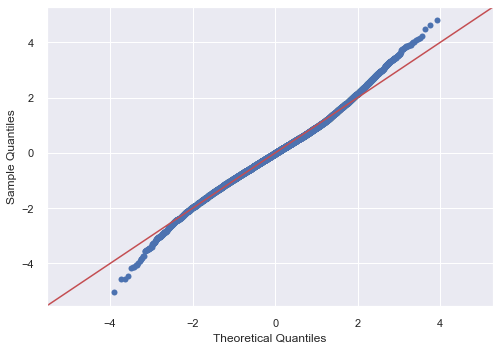

In [216]:
fig = sm.graphics.qqplot(model2.resid, dist=stats.norm, line='45', fit=True)

### check homoscedasticity

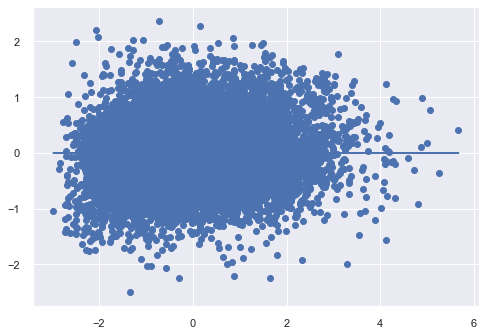

In [217]:
plt.scatter(model2.predict(kc_preprocessed_v4), model2.resid)
plt.plot(model2.predict(kc_preprocessed_v4), [0 for i in range(len(kc_preprocessed_v4))])

### remove non-influential features
Based on the initial model, remove those features which do not appear to be statistically relevant and rerun the model.

In [218]:
summaryA = model2.summary()
pA_table = summaryA.tables[1]
pA_table = pd.DataFrame(pA_table.data)
pA_table.columns = pA_table.iloc[0]
pA_table = pA_table.drop(0)
pA_table = pA_table.set_index(pA_table.columns[0])
pA_table['P>|t|'] = pA_table['P>|t|'].astype(float)
xA_cols = list(pA_table[pA_table['P>|t|'] <= 0.05].index)
removed_cols = list(pA_table[pA_table['P>|t|'] > 0.05].index)
removed_cols.remove('const')
pA_table.head()

,coef,std err,t,P>|t|,[0.025,0.975]
,,,,,,
const,0.1715,0.506,0.339,0.735,-0.820,1.162
bathrooms_log,0.0485,0.006,8.224,0.000,0.037,0.060
sqft_lot_log,-0.0005,0.005,-0.109,0.913,-0.010,0.009
sqft_above_log,0.3570,0.008,43.031,0.000,0.341,0.373
lat_log,0.3829,0.004,107.611,0.000,0.376,0.390


In [219]:
summaryB = model3.summary()
pB_table = summaryB.tables[1]
pB_table = pd.DataFrame(pB_table.data)
pB_table.columns = pB_table.iloc[0]
pB_table = pB_table.drop(0)
pB_table = pB_table.set_index(pB_table.columns[0])
pB_table['P>|t|'] = pB_table['P>|t|'].astype(float)
xB_cols = list(pB_table[pB_table['P>|t|'] <= 0.05].index)
pB_table.head()

,coef,std err,t,P>|t|,[0.025,0.975]
,,,,,,
Intercept,0.0609,0.511,0.119,0.905,-0.940,1.062
bathrooms_log,0.0444,0.007,6.714,0.000,0.031,0.057
sqft_lot_log,-0.0025,0.005,-0.477,0.633,-0.013,0.008
sqft_above_log,0.3596,0.009,38.749,0.000,0.341,0.378
lat_log,0.3827,0.004,96.164,0.000,0.375,0.391


In [220]:
print(xA_cols)

['bathrooms_log', 'sqft_above_log', 'lat_log', 'long_log', 'bedrooms_3', 'bedrooms_4', 'bedrooms_5', 'bedrooms_6', 'bedrooms_7', 'floors_15', 'floors_20', 'floors_25', 'floors_30', 'waterfront_1', 'view_1', 'view_2', 'view_3', 'view_4', 'condition_3', 'condition_4', 'condition_5', 'grade_4', 'grade_5', 'grade_6', 'grade_13', 'yr_built_1937', 'yr_built_2011', 'hasrenovated_1', 'hasbasement_1', 'hasbiggerliving_1', 'yr_sold_2015', 'mo_sold_3', 'mo_sold_4', 'mo_sold_5', 'mo_sold_6', 'mo_sold_7', 'mo_sold_8', 'mo_sold_9', 'mo_sold_10', 'mo_sold_11', 'mo_sold_12']


In [221]:
print(xB_cols)

['bathrooms_log', 'sqft_above_log', 'lat_log', 'long_log', 'bedrooms_3', 'bedrooms_4', 'bedrooms_5', 'bedrooms_6', 'bedrooms_7', 'floors_15', 'floors_20', 'floors_25', 'floors_30', 'waterfront_1', 'view_1', 'view_2', 'view_3', 'view_4', 'condition_3', 'condition_4', 'condition_5', 'grade_4', 'grade_5', 'grade_6', 'grade_13', 'yr_built_1937', 'hasrenovated_1', 'hasbasement_1', 'hasbiggerliving_1', 'yr_sold_2015', 'mo_sold_3', 'mo_sold_4', 'mo_sold_5', 'mo_sold_6', 'mo_sold_7', 'mo_sold_8', 'mo_sold_9', 'mo_sold_10', 'mo_sold_11', 'mo_sold_12']


In [222]:
X = X[xA_cols]
XA_adfeats = sm.add_constant(X)
model4 = sm.OLS(Y,XA_adfeats).fit()
model4.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              price_log   R-squared:                       0.708
Model:                            OLS   Adj. R-squared:                  0.707
Method:                 Least Squares   F-statistic:                     1273.
Date:                Tue, 21 Jul 2020   Prob (F-statistic):               0.00
Time:                        19:29:08   Log-Likelihood:                -17362.
No. Observations:               21597   AIC:                         3.481e+04
Df Residuals:                   21555   BIC:                         3.514e+04
Df Model:                          41                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                -0.4166      0.049     -8.458      0.000      -0.513      -0.320
bathrooms_log         0.0791      0.006     12.468      0.000       0.067       0.092
sqft_above_log        0.6339      0.007     88.853      0.000       0.620       0.648
lat_log               0.4122      0.004    107.608      0.000       0.405       0.420
long_log              0.0424      0.004      9.960      0.000       0.034       0.051
bedrooms_3           -0.2512      0.013    -19.816      0.000      -0.276      -0.226
bedrooms_4           -0.2345      0.015    -15.711      0.000      -0.264      -0.205
bedrooms_5           -0.2339      0.020    -11.723      0.000      -0.273      -0.195
bedrooms_6           -0.3814      0.036    -10.489      0.000      -0.453      -0.310
bedrooms_7           -0.4896      0.090     -5.463      0.000      -0.665      -0.314
floors_15             0.0766      0.014      5.465      0.000       0.049       0.104
floors_20            -0.0232      0.011     -2.030      0.042      -0.046      -0.001
floors_25             0.2274      0.044      5.152      0.000       0.141       0.314
floors_30             0.0029      0.025      0.115      0.908      -0.046       0.052
waterfront_1          0.7318      0.055     13.333      0.000       0.624       0.839
view_1                0.4325      0.030     14.227      0.000       0.373       0.492
view_2                0.3982      0.018     21.770      0.000       0.362       0.434
view_3                0.5940      0.025     23.845      0.000       0.545       0.643
view_4                0.7986      0.038     21.072      0.000       0.724       0.873
condition_3           0.1915      0.039      4.880      0.000       0.115       0.268
condition_4           0.3704      0.039      9.383      0.000       0.293       0.448
condition_5           0.5599      0.041     13.640      0.000       0.479       0.640
grade_4              -0.0127      0.106     -0.121      0.904      -0.220       0.194
grade_5              -0.2183      0.037     -5.972      0.000      -0.290      -0.147
grade_6              -0.1512      0.014    -10.468      0.000      -0.179      -0.123
grade_13              1.0363      0.152      6.837      0.000       0.739       1.333
yr_built_1937         0.0317      0.012      2.599      0.009       0.008       0.056
yr_built_2011         0.0533      0.014      3.696      0.000       0.025       0.082
hasrenovated_1        0.2973      0.021     14.476      0.000       0.257       0.338
hasbasement_1         0.4663      0.010     46.693      0.000       0.447       0.486
hasbiggerliving_1    -0.1367      0.009    -15.758      0.000      -0.154      -0.120
yr_sold_2015          0.1606      0.025      6.446      0.000       0.112       0.209
mo_sold_3             0.0955      0.017      5.626      0.000       0.062

In [224]:
mse = make_scorer(mean_squared_error)

crossvalidation = KFold(n_splits=80, shuffle=True, random_state=1) # 10-fold
adfeats_r2 = np.mean(cross_val_score(linreg, X, Y, scoring='r2', cv=crossvalidation))
adfeats_mse = np.mean(cross_val_score(linreg, X, Y, scoring=mse, cv=crossvalidation))
adfeats_rmse = np.sqrt(adfeats_mse)

print(f' dummy features added model r2:{adfeats_r2:.5f}, mse:{adfeats_mse:.5f}, rmse:{adfeats_rmse:.5f}')

 dummy features added model r2:0.70355, mse:0.29369, rmse:0.54193


In [227]:
predictors = '+'.join(xB_cols)
formula = outcome + '~' + predictors
model5 = ols(formula=formula, data=train).fit()
model5.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              price_log   R-squared:                       0.708
Model:                            OLS   Adj. R-squared:                  0.708
Method:                 Least Squares   F-statistic:                     1046.
Date:                Tue, 21 Jul 2020   Prob (F-statistic):               0.00
Time:                        19:32:51   Log-Likelihood:                -13911.
No. Observations:               17277   AIC:                         2.790e+04
Df Residuals:                   17236   BIC:                         2.822e+04
Df Model:                          40                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept            -0.3793      0.056     -6.814      0.000      -0.488      -0.270
bathrooms_log         0.0735      0.007     10.332      0.000       0.060       0.087
sqft_above_log        0.6342      0.008     79.495      0.000       0.619       0.650
lat_log               0.4110      0.004     95.791      0.000       0.403       0.419
long_log              0.0428      0.005      9.061      0.000       0.034       0.052
bedrooms_3           -0.2615      0.014    -18.459      0.000      -0.289      -0.234
bedrooms_4           -0.2376      0.017    -14.265      0.000      -0.270      -0.205
bedrooms_5           -0.2409      0.022    -10.785      0.000      -0.285      -0.197
bedrooms_6           -0.3742      0.041     -9.162      0.000      -0.454      -0.294
bedrooms_7           -0.4288      0.094     -4.572      0.000      -0.613      -0.245
floors_15             0.0725      0.016      4.618      0.000       0.042       0.103
floors_20            -0.0071      0.013     -0.566      0.571      -0.032       0.018
floors_25             0.2357      0.050      4.745      0.000       0.138       0.333
floors_30             0.0221      0.027      0.810      0.418      -0.031       0.075
waterfront_1          0.7667      0.061     12.580      0.000       0.647       0.886
view_1                0.4362      0.035     12.638      0.000       0.369       0.504
view_2                0.3938      0.021     19.091      0.000       0.353       0.434
view_3                0.5852      0.028     20.703      0.000       0.530       0.641
view_4                0.7695      0.042     18.498      0.000       0.688       0.851
condition_3           0.1684      0.044      3.788      0.000       0.081       0.256
condition_4           0.3475      0.045      7.768      0.000       0.260       0.435
condition_5           0.5509      0.046     11.864      0.000       0.460       0.642
grade_4              -0.2245      0.126     -1.785      0.074      -0.471       0.022
grade_5              -0.2023      0.041     -4.954      0.000      -0.282      -0.122
grade_6              -0.1608      0.016     -9.926      0.000      -0.193      -0.129
grade_13              1.1090      0.165      6.705      0.000       0.785       1.433
yr_built_1937         0.0301      0.014      2.195      0.028       0.003       0.057
hasrenovated_1        0.3070      0.023     13.346      0.000       0.262       0.352
hasbasement_1         0.4684      0.011     41.924      0.000       0.446       0.490
hasbiggerliving_1    -0.1386      0.010    -14.289      0.000      -0.158      -0.120
yr_sold_2015          0.1466      0.028      5.231      0.000       0.092       0.202
mo_sold_3             0.1039      0.019      5.469      0.000       0.067       0.141
mo_sold_4             0.1303      0.018      7.145      0.000       0.095

In [228]:
train2 = train.drop(['price_log'],axis=1)
train2 = train2[xB_cols]
Y2 = train.price_log

mse = make_scorer(mean_squared_error)

crossvalidation = KFold(n_splits=80, shuffle=True, random_state=1) # 10-fold
adfeats_r2 = np.mean(cross_val_score(linreg, train2, Y2, scoring='r2', cv=crossvalidation))
adfeats_mse = np.mean(cross_val_score(linreg, train2, Y2, scoring=mse, cv=crossvalidation))

print(f' dummy features added model r2:{adfeats_r2:.5f}, mse:{adfeats_mse:.5f}')

 dummy features added model r2:0.70266, mse:0.29472


###  use feature ranking with recursive feature elimination: Top 15 features

In [229]:
selector = RFE(linreg, n_features_to_select=15)
selector = selector.fit(X, Y.values.ravel())
selector.support_ 

array([False,  True,  True, False, False, False, False, False,  True,
       False, False,  True, False,  True,  True,  True,  True,  True,
        True,  True,  True, False, False, False,  True, False, False,
        True,  True, False, False, False, False, False, False, False,
       False, False, False, False, False])

In [230]:
selector.ranking_

array([21,  1,  1, 23,  4,  5,  6,  3,  1, 20, 25,  1, 27,  1,  1,  1,  1,
        1,  1,  1,  1, 26,  2,  7,  1, 24, 22,  1,  1,  8, 10, 19,  9, 11,
       12, 13, 15, 16, 14, 17, 18])

In [231]:
estimators = selector.estimator_
print(estimators.coef_)
print(estimators.intercept_)

[ 0.62270283  0.42832708 -0.22838532  0.25245134  0.75677501  0.48608448
  0.4323817   0.64166542  0.85575341  0.25157492  0.39542184  0.5803199
  1.09517575  0.29160804  0.47006801]
-0.5754070804436049


In [232]:
print(X.columns)
selected_columns = X.columns[selector.support_]
selected_columns

Index(['bathrooms_log', 'sqft_above_log', 'lat_log', 'long_log', 'bedrooms_3',
       'bedrooms_4', 'bedrooms_5', 'bedrooms_6', 'bedrooms_7', 'floors_15',
       'floors_20', 'floors_25', 'floors_30', 'waterfront_1', 'view_1',
       'view_2', 'view_3', 'view_4', 'condition_3', 'condition_4',
       'condition_5', 'grade_4', 'grade_5', 'grade_6', 'grade_13',
       'yr_built_1937', 'yr_built_2011', 'hasrenovated_1', 'hasbasement_1',
       'hasbiggerliving_1', 'yr_sold_2015', 'mo_sold_3', 'mo_sold_4',
       'mo_sold_5', 'mo_sold_6', 'mo_sold_7', 'mo_sold_8', 'mo_sold_9',
       'mo_sold_10', 'mo_sold_11', 'mo_sold_12'],
      dtype='object')


Index(['sqft_above_log', 'lat_log', 'bedrooms_7', 'floors_25', 'waterfront_1',
       'view_1', 'view_2', 'view_3', 'view_4', 'condition_3', 'condition_4',
       'condition_5', 'grade_13', 'hasrenovated_1', 'hasbasement_1'],
      dtype='object')

In [233]:
linreg.fit(X[selected_columns],Y)
yhat = linreg.predict(X[selected_columns])
yhat

array([-0.94357589,  1.35359899, -0.86651147, ..., -0.89893546,
       -0.42764306, -0.89986157])

In [234]:
SS_residual = np.dot(Y-yhat,Y-yhat)
SS_total = np.dot(Y-np.mean(Y),Y-np.mean(Y))
R_squared = 1 - (SS_residual / SS_total)
adjusted_R_squared = 1 - (1 - R_squared) * ((len(Y) - 1) / (len(Y) - X[selected_columns].shape[1] - 1))

print(R_squared)
print(adjusted_R_squared)

0.690365079903406
0.6901498663451163


### conclusion (baseline model w/ dummies):
final features:

- **'sqft_lot_log'**, 

- **'sqft_above_log'** (Top15), 

- **'zipcode_log'**, 

- **'yr_sdiff_log'**,

- **'bedrooms_3'**, 

- **'bedrooms_4'**,

- **'bedrooms_5'**, 

- **'bedrooms_6'**, 

- **'bedrooms_7'**,

- **'bathrooms_175'**, 

- **'bathrooms_20'**, 

- **'bathrooms_275'**, 

- **'bathrooms_30'**,

- **'bathrooms_325'**, 

- **'bathrooms_35'**, 

- **'bathrooms_375'**, 

- **'bathrooms_40'**,

- **'bathrooms_425'**,

- **'bathrooms_45'**,

- **'bathrooms_475'**,

- **'bathrooms_50'**,

- **'bathrooms_525'**,

- **'bathrooms_55'**,

- **'bathrooms_575'**, 

- **'bathrooms_60'** (Top15), 
          
- **'bathrooms_625'**,

- **'bathrooms_775'** (Top15),

- **'floors_15'**,

- **'floors_25'**,

- **'floors_30'** (Top15),

- **'waterfront_1'** (Top15),
         
- **'view_1'** (Top15),

- **'view_2'** (Top15),

- **'view_3'** (Top15),

- **'view_4'** (Top15),

- **'condition_2'** (Top15),

- **'condition_3'**,

- **'condition_5'**,

- **'grade_10'** (Top15),
           
- **'grade_11'** (Top15),         
           
- **'grade_12'** (Top15), 

- **'grade_13'** (Top15),

- **'hasrenovated_1'**,

- **'hasbasement_1'** (Top15),

- **'hasbiggerliving_1'**,
           
- **'mo_sold_3'**,

- **'mo_sold_4'**, 

- **'mo_sold_5'**, 

- **'mo_sold_6'**,

- **'lat_cat_476414'**, 

- **'lat_cat_477094'**, 

- **'lat_cat_477528'**

### check normality

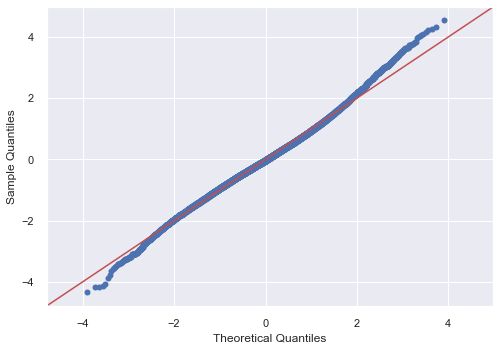

In [235]:
fig = sm.graphics.qqplot(model4.resid, dist=stats.norm, line='45', fit=True)

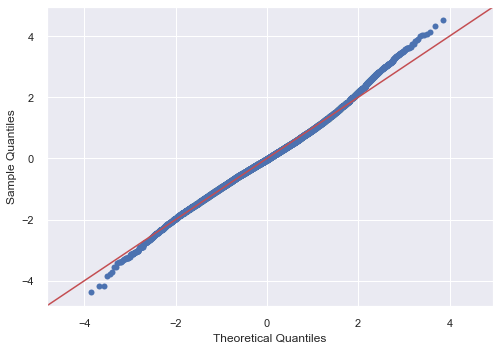

In [236]:
fig = sm.graphics.qqplot(model5.resid, dist=stats.norm, line='45', fit=True)

### check homoscedasticity

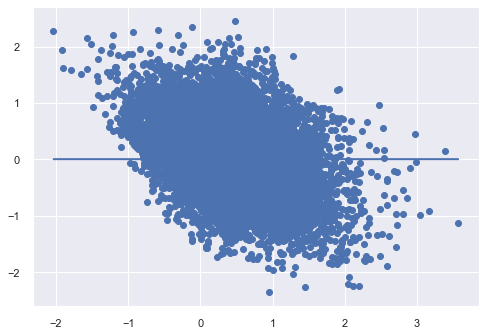

In [237]:
kc_preprocessed_v5 = kc_preprocessed_v4.drop(removed_cols,axis=1)
plt.scatter(model4.predict(kc_preprocessed_v5), model4.resid)
plt.plot(model4.predict(kc_preprocessed_v5), [0 for i in range(len(kc_preprocessed_v5))])

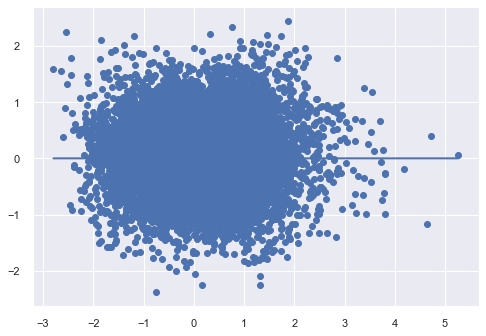

In [238]:
plt.scatter(model5.predict(train), model5.resid)
plt.plot(model5.predict(train), [0 for i in range(len(train))])